# **Name: Raja Haider Ali**
# **CMS ID: 346900**
# **Group: 2**

# Deep Learning CS405 - Lab 12

# Generative Adversarial Networks(GAN) - PyTorch Tutorial

![image](https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2FHwq72%2FbtqAY6E0wYb%2FBFRgtJWTY3Ij9BKks7vsM1%2Fimg.png)

# Objective:
The objective of this lab is to introduce students to Generative Adversarial Networks (GANs) and how they can be used to generate synthetic data similar to the MNIST dataset. Students will gain hands-on experience implementing a GAN architecture, training it on a simplified version of the MNIST dataset, and generating new digit images.

# Overview:
Generative Adversarial Networks (GANs) are a class of neural networks used in unsupervised machine learning, particularly in generating synthetic data that resembles real data distributions. In this lab, students will delve into the mechanics of GANs and learn how they consist of two neural networks - a generator and a discriminator - that compete against each other to create realistic synthetic data.

# Tasks:

## 1) Please create a report in which you answer each of the question posed in this notebook.

## 2) Train the Generative Adversarial Network completely and visualize the outputs of your Generator in your notebook.

## MAIN Reference
1. [PyTorch-GAN | Github/eriklindernoren | Collection of PyTorch implementations of GAN](https://github.com/sw-song/PyTorch-GAN)


## Index
```
Step 1. Import Libraries
Step 2. Initial Setting
Step 3. Define Generator
Step 4. Define Discriminator
Step 5. Define Loss Function
Step 6. Initialize Generator and Discriminator
Step 7. GPU Setting
Step 8. Configure Data Loader
Step 9. Define Optimizers
Step 10. Training
```
---

### Step 1. Import Libraries

In [1]:
import numpy as np

import torchvision.transforms as transforms

from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch

### Step 2. Initial setting

In [2]:
channels = 1 # suggested default : 1, number of image channels (gray scale)
img_size = 28 # suggested default : 28, size of each image dimension
img_shape = (channels, img_size, img_size) # (Channels, Image Size(H), Image Size(W))

# Question 1: What does the latent_dim variable used for in the cell below?

The generator model in the GAN architecture takes a point from the latent space as input and generates a new image.
The latent space itself has no meaning. Typically it is a 100-dimensional hypersphere with each variable drawn from a Gaussian distribution with a mean of zero and a standard deviation of one.

In [3]:
latent_dim = 100 # suggested default. dimensionality of the latent space

In [4]:
cuda = True if torch.cuda.is_available() else False # GPU Setting

### Step 3. Define Generator

## Question 2: Please explain the architecture of the Generator part of our GAN in the cell below. Is the Generator convolutional or fully-connected?

The Generator of this GAN is fully-connected, as it consists of linear layers. You can see this in the block function of the GAN i.e. layers = [nn.Linear(input_features, output_features)]. It takes a random latent vector as input and generates an image as output through a series of linear transformations, batch normalization, and LeakyReLU activations.

In [5]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        def block(input_features, output_features, normalize=True):
            layers = [nn.Linear(input_features, output_features)]
            if normalize: # Default
                layers.append(nn.BatchNorm1d(output_features, 0.8))
            layers.append(nn.LeakyReLU(0.2, inplace=True)) # inplace=True : modify the input directly. It can slightly decrease the memory usage.
            return layers # return list of layers

        self.model = nn.Sequential(
            *block(latent_dim, 128, normalize=False), # Asterisk('*') in front of block means unpacking list of layers - leave only values(layers) in list
            *block(128, 256),
            *block(256, 512),
            *block(512, 1024),
            nn.Linear(1024, int(np.prod(img_shape))), # np.prod(1, 28, 28) == 1*28*28
            nn.Tanh() # result : from -1 to 1
        )

    def forward(self, z): # z == latent vector(random input vector)
        img = self.model(z) # (64, 100) --(model)--> (64, 784)
        img = img.view(img.size(0), *img_shape) # img.size(0) == N(Batch Size), (N, C, H, W) == default --> (64, 1, 28, 28)
        return img

> Read More
- [What is the difference between nn.ReLU() and nn.ReLU(inplace=True)?](https://discuss.pytorch.org/t/whats-the-difference-between-nn-relu-and-nn-relu-inplace-true/948)
- [Tanh](https://wiki.documentfoundation.org/Documentation/Calc_Functions/TANH)
- [Unpacking Operators in Python](https://towardsdatascience.com/unpacking-operators-in-python-306ae44cd480)

### Step 4. Define Discriminator

## Question 3: Please explain the architecture of the Discrinimator part of our GAN in the cell below. Is the discriminator convolutional or fully-connected?

The Discriminator part is also fully-connected as the layers used are linear layers i.e.  nn.Linear(int(np.prod(img_shape)), 512) etc.

In [6]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(int(np.prod(img_shape)), 512), # (28*28, 512)
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid() # result : from 0 to 1
        )

    def forward(self, img):
        img_flat = img.view(img.size(0), -1) #flatten -> from (64, 1, 28, 28) to (64, 1*28*28)
        validity = self.model(img_flat) # Discriminate -> Real? or Fake? (64, 784) -> (64, 1)
        return validity

> Read More
- [Sigmoid](https://en.wikipedia.org/wiki/Sigmoid_function)
- [pytorch in x = x.view (x.size (0), -1) understanding](https://www.programmersought.com/article/11412923760/)

### Step 5. Define Loss Function

# Question 4: Why is the adversarial loss binary cross-entropy used here?

Binary Cross Entropy loss is used in binary classification task. As in GAN model distinguish between  real and generated samples, so BCE loss is used to effectivelty calculate the loss.

In [7]:
adversarial_loss = torch.nn.BCELoss()

> Read More
- [BCELoss(Binary Cross Entropy Loss)](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html)

### Step 6. Initialize generator and Discriminator

In [8]:
generator = Generator()
discriminator = Discriminator()

In [9]:
generator

Generator(
  (model): Sequential(
    (0): Linear(in_features=100, out_features=128, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Linear(in_features=128, out_features=256, bias=True)
    (3): BatchNorm1d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Linear(in_features=256, out_features=512, bias=True)
    (6): BatchNorm1d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Linear(in_features=512, out_features=1024, bias=True)
    (9): BatchNorm1d(1024, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Linear(in_features=1024, out_features=784, bias=True)
    (12): Tanh()
  )
)

In [10]:
discriminator

Discriminator(
  (model): Sequential(
    (0): Linear(in_features=784, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Linear(in_features=512, out_features=256, bias=True)
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Linear(in_features=256, out_features=1, bias=True)
    (5): Sigmoid()
  )
)

### Step 7. GPU Setting

In [11]:
if cuda:
    generator.cuda()
    discriminator.cuda()
    adversarial_loss.cuda()

### Step 8. Configure Data Loader

Since we use the Kaggle dataset, it is necessary to read the csv file and convert it into an image format.


For the code to load and convert Kaggle MNIST data, I referred to [Pytorch Dataset and DataLoader](https://www.kaggle.com/pinocookie/pytorch-dataset-and-dataloader).


In [12]:
import pandas as pd
from torch.utils.data import Dataset

In [13]:
class DatasetMNIST(Dataset): # inherit abstract class - 'Dataset'

    def __init__(self, file_path, transform=None):
        self.data = pd.read_csv(file_path)
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        # load image ad ndarray type (H, W, C)
        # be carefull for converting dtype to np.uint8 (Unsigned integer (0 to 255))
        # in this example, We use ToTensor(), so we define the numpy array like (H, W, C)

        image = self.data.iloc[index, 1:].values.astype(np.uint8).reshape((28,28,1))
        label = self.data.iloc[index, 0]
        if self.transform is not None:
            image = self.transform(image)

        return image, label


> TEST CODE : Read CSV file

In [14]:
!gdown https://drive.google.com/file/d/1yasQ9chYaHy0eiEfwjfy-HQnt-zjhmyw/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=1yasQ9chYaHy0eiEfwjfy-HQnt-zjhmyw
To: /content/mnist.csv
100% 76.8M/76.8M [00:01<00:00, 46.3MB/s]


In [15]:
train = pd.read_csv('/content/mnist.csv')

In [16]:
train

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41996,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41997,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41998,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


> TEST CODE : Construct image from csv file

In [17]:
for index in range(1, 6): # N : 5 (Number of Image)
    temp_image = train.iloc[index, 1:].values.astype(np.uint8).reshape((28,28,1))
    temp_label = train.iloc[index, 0]
    print('Shape of Image : ',temp_image.shape)
    print('label : ', temp_label)

Shape of Image :  (28, 28, 1)
label :  0
Shape of Image :  (28, 28, 1)
label :  1
Shape of Image :  (28, 28, 1)
label :  4
Shape of Image :  (28, 28, 1)
label :  0
Shape of Image :  (28, 28, 1)
label :  0


> TEST CODE : transform from table data to image data with basic preprocessing

In [18]:
dataset = DatasetMNIST(file_path='/content/mnist.csv',
                       transform=transforms.Compose(
                           [#transforms.Resize(img_size), # Resize is only for PIL Image. Not for numpy array
                            transforms.ToTensor(), # ToTensor() : np.array (H, W, C) -> tensor (C, H, W)
                            transforms.Normalize([0.5],[0.5])]
                       ))

In [19]:
temp_img, _ =  dataset.__getitem__(0) # We don't need label, so _

In [20]:
temp_img.size() # before ToTensor() : (28,28,1), after : (1,28,28)

torch.Size([1, 28, 28])

In [21]:
temp_img.max(), temp_img.min() # before Normalize([0.5],[0.5]) : 0 ~ 1, after : -1 ~ 1

(tensor(1.), tensor(-1.))

> TEST CODE : Define dataloader that can load image by batch

In [22]:
batch_size = 64 # suggested default, size of the batches
dataloader = DataLoader( # torch.utils.data.DataLoader
    dataset,
    batch_size=batch_size,
    shuffle=True
)

In [23]:
temp_images, _ = next(iter(dataloader))# We don't use label, so _
print('images shape on batch size = {}'.format(temp_images.size()))

images shape on batch size = torch.Size([64, 1, 28, 28])


> Read More
1. [torchvision.transforms](https://pytorch.org/vision/stable/transforms.html)
    - .ToTensor | Convert a PIL Image or numpy.ndarray to tensor. This transform does not support torchscript.
    - .ToTensor | Converts a PIL Image or numpy.ndarray (H x W x C) in the range [0, 255] to a torch.FloatTensor of shape (C x H x W) in the range [0.0, 1.0] if the PIL Image belongs to one of the modes (L, LA, P, I, F, RGB, YCbCr, RGBA, CMYK, 1) or if the numpy.ndarray has dtype = np.uint8

### Step 9. Define optimizers

In [24]:
# suggested default - beta parameters (decay of first order momentum of gradients)
b1 = 0.5
b2 = 0.999

# suggested default - learning rate
lr = 0.0002

In [25]:
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(b1,b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(b1,b2))

### Step 10. Training

![image](https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2FpMdme%2FbtqA1ArBCOy%2FqqGg7IvV0hpqVkvBuEFpJK%2Fimg.png)

In [26]:
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

In [27]:
from tqdm.notebook import tqdm

In [28]:
# Visualize result
import matplotlib.pyplot as plt

# Question 5: Answer the following questions in the cell below:
### (i) What are the "valid" and "fake" variables initialized for?
### (ii) What does "real_imgs = imgs.type(Tensor)" do and why are we doing it?
### (iii) What is the tensor z used for in the line: z = Tensor(np.random.normal(0, 1, (imgs.shape[0],latent_dim)))

### (iv) In the code below is the Generator updated first or the discriminator?

### For discriminator you can see it is a sum of two losses "real_loss" and "fake_loss". What do these two losses signify?


1. valid and fake: These are target labels for the Discriminator during training. "valid" is used when the Discriminator is learning about real images, aiming for its output to be close to 1.0. "fake" is used when the Discriminator is learning about generated images, wanting its output to be close to 0.0.

2. real_imgs = imgs.type(Tensor): It is a conversion ensuring that the images (imgs) are in the right format (data type and device) for further processing in the neural network.

3. z in z = Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))): z is a set of random numbers that are used as input for the Generator. It adds an element of randomness, ensuring the Generator produces diverse images.

4. Generator or Discriminator update order: The Generator is updated first. It tries to generate images that look real to confuse the Discriminator.

5. "real_loss" and "fake_loss": These are components of the Discriminator's training. "real_loss" measures how well the Discriminator recognizes real images, and "fake_loss" measures its ability to detect generated images as fake. Both losses are averaged to update the Discriminator's parameters effectively.







  0%|          | 0/657 [00:00<?, ?it/s]

<ipython-input-29-312fac5a3036>:7: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:83.)
  valid = Variable(Tensor(imgs.size(0), 1).fill_(1.0), requires_grad=False) # imgs.size(0) == batch_size(1 batch) == 64, *TEST_CODE


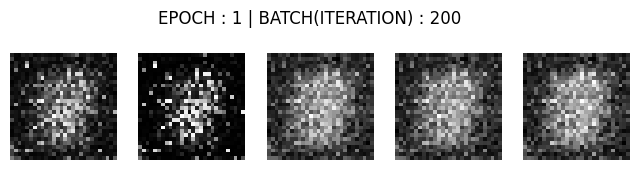

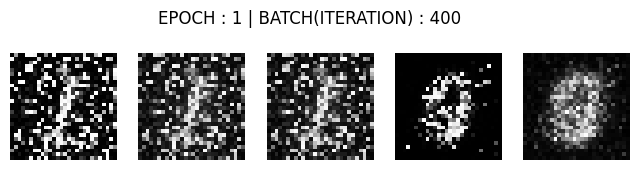

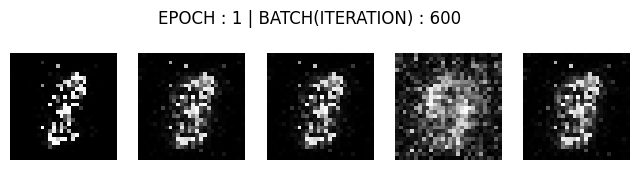

[Epoch: 1/200] [Batch: 657/657] [D loss: 0.487872] [G loss: 1.350274]


  0%|          | 0/657 [00:00<?, ?it/s]

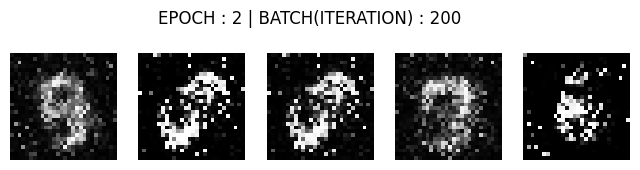

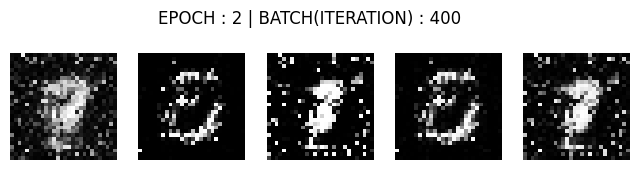

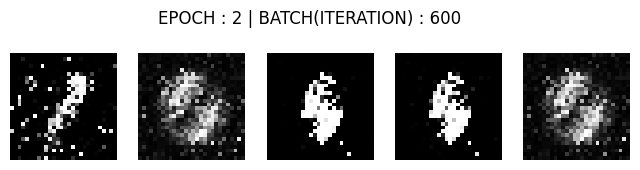

[Epoch: 2/200] [Batch: 657/657] [D loss: 0.450957] [G loss: 0.717125]


  0%|          | 0/657 [00:00<?, ?it/s]

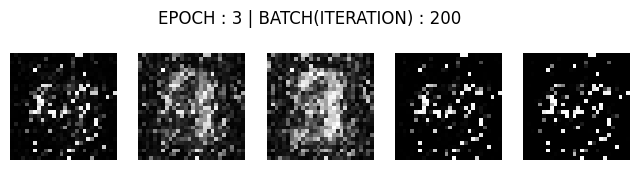

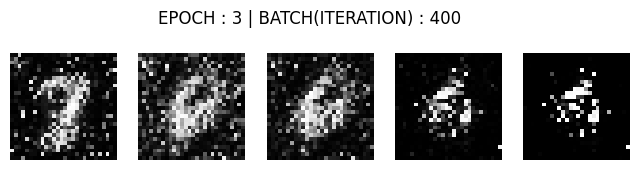

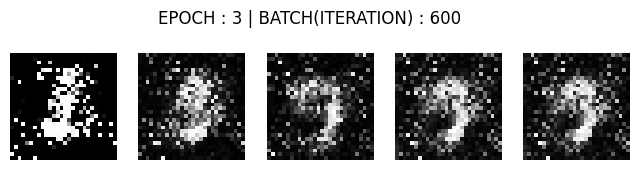

[Epoch: 3/200] [Batch: 657/657] [D loss: 0.159303] [G loss: 2.875896]


  0%|          | 0/657 [00:00<?, ?it/s]

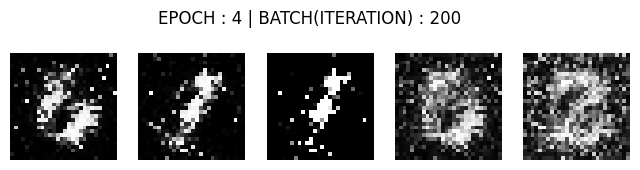

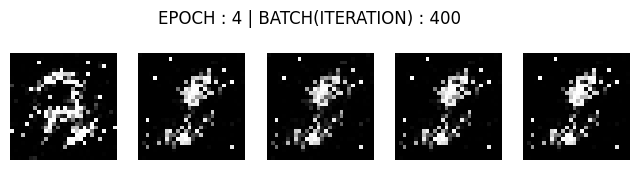

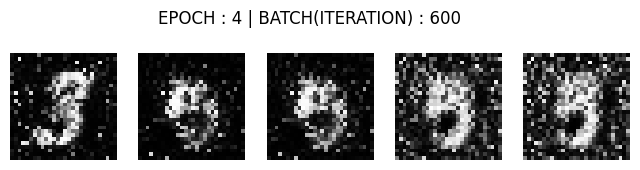

[Epoch: 4/200] [Batch: 657/657] [D loss: 0.309009] [G loss: 1.299613]


  0%|          | 0/657 [00:00<?, ?it/s]

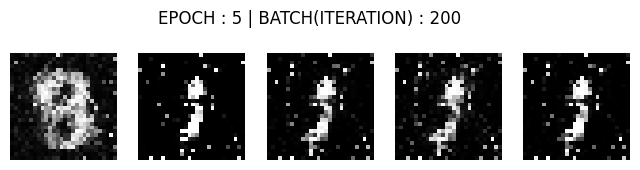

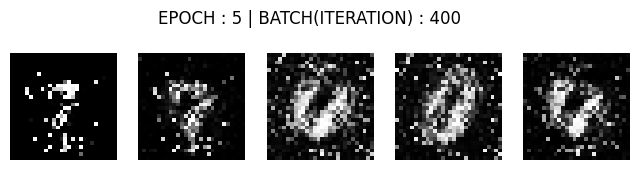

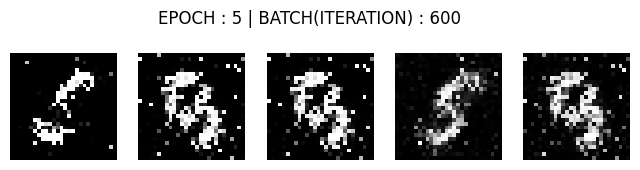

[Epoch: 5/200] [Batch: 657/657] [D loss: 0.211728] [G loss: 1.362927]


  0%|          | 0/657 [00:00<?, ?it/s]

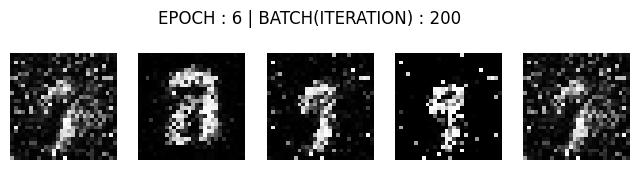

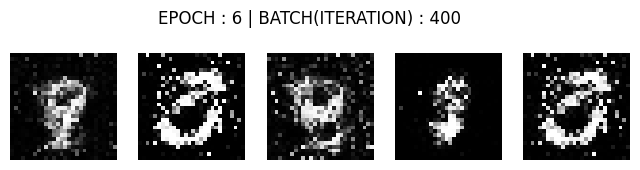

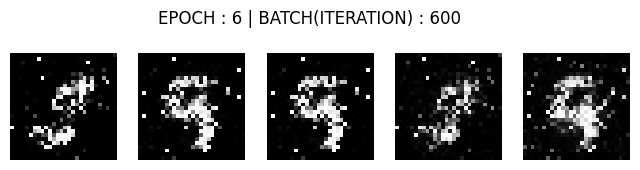

[Epoch: 6/200] [Batch: 657/657] [D loss: 0.284525] [G loss: 1.113565]


  0%|          | 0/657 [00:00<?, ?it/s]

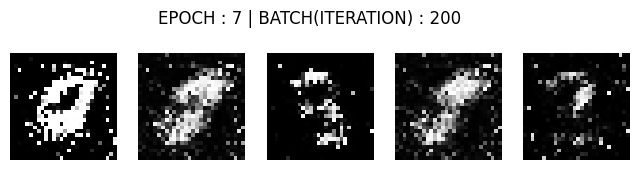

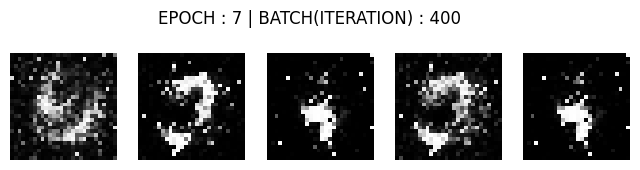

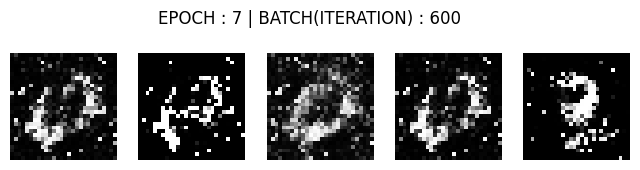

[Epoch: 7/200] [Batch: 657/657] [D loss: 0.430628] [G loss: 1.763301]


  0%|          | 0/657 [00:00<?, ?it/s]

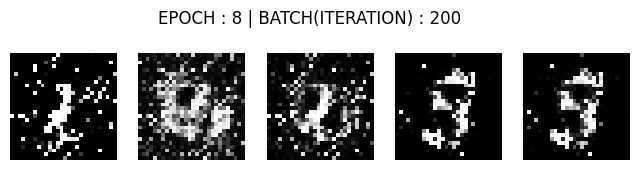

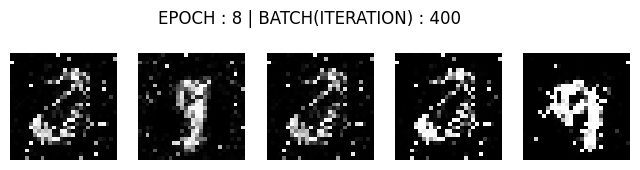

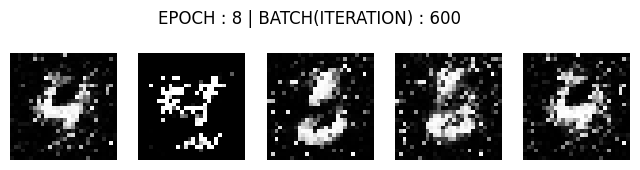

[Epoch: 8/200] [Batch: 657/657] [D loss: 0.127932] [G loss: 1.830027]


  0%|          | 0/657 [00:00<?, ?it/s]

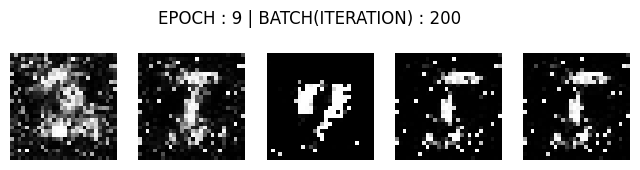

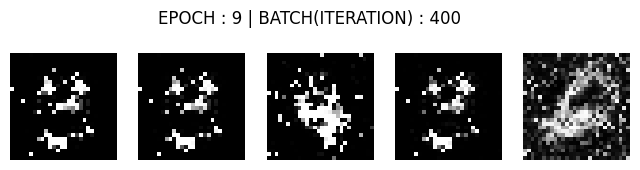

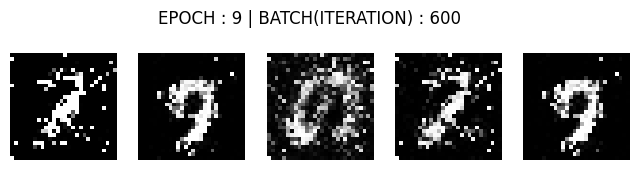

[Epoch: 9/200] [Batch: 657/657] [D loss: 1.285419] [G loss: 7.792353]


  0%|          | 0/657 [00:00<?, ?it/s]

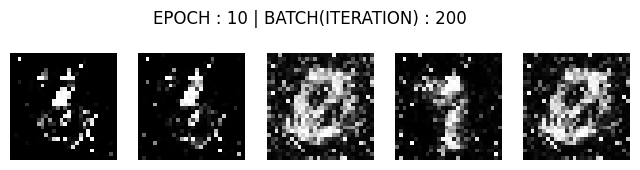

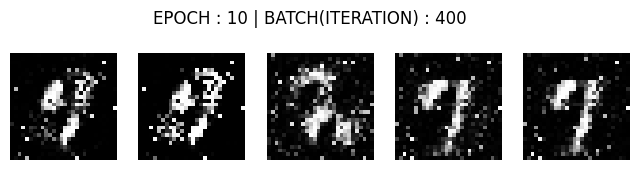

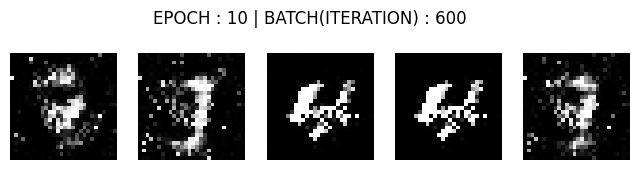

[Epoch: 10/200] [Batch: 657/657] [D loss: 0.324715] [G loss: 1.945106]


  0%|          | 0/657 [00:00<?, ?it/s]

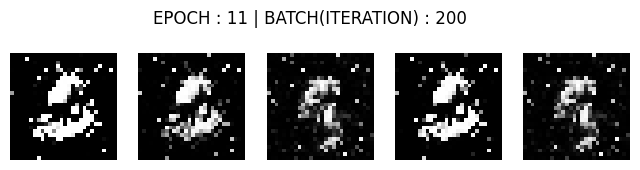

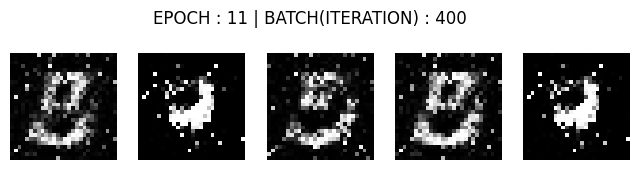

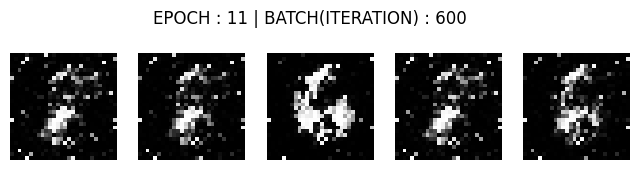

[Epoch: 11/200] [Batch: 657/657] [D loss: 0.094356] [G loss: 2.889652]


  0%|          | 0/657 [00:00<?, ?it/s]

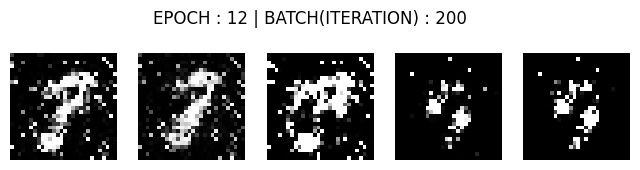

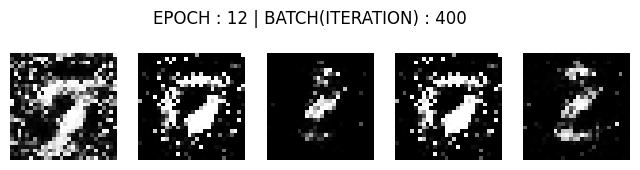

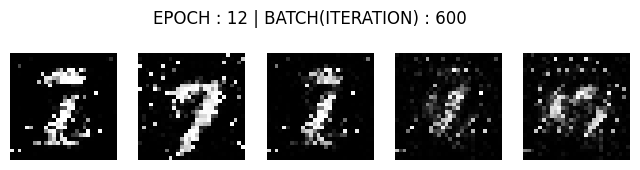

[Epoch: 12/200] [Batch: 657/657] [D loss: 0.133029] [G loss: 2.143324]


  0%|          | 0/657 [00:00<?, ?it/s]

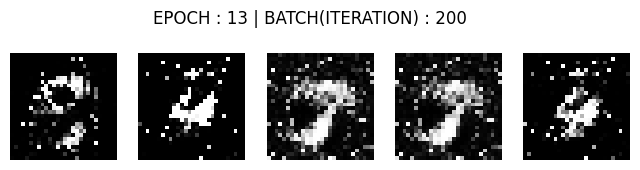

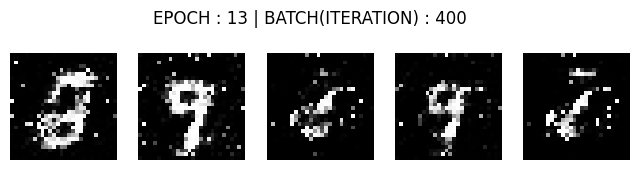

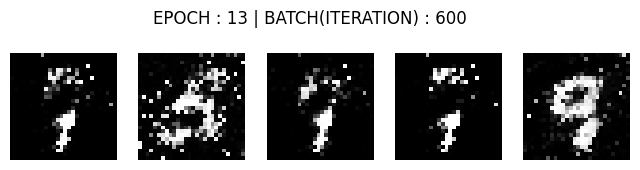

[Epoch: 13/200] [Batch: 657/657] [D loss: 0.667969] [G loss: 0.383552]


  0%|          | 0/657 [00:00<?, ?it/s]

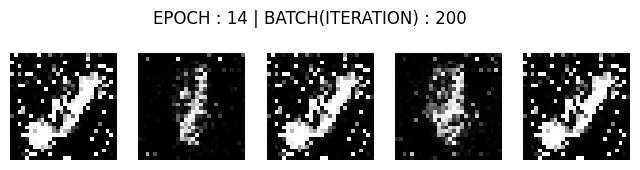

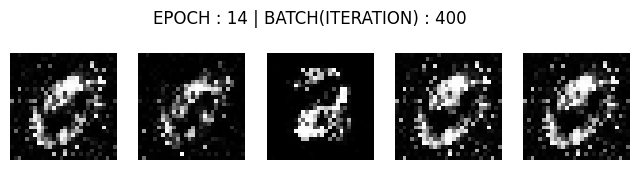

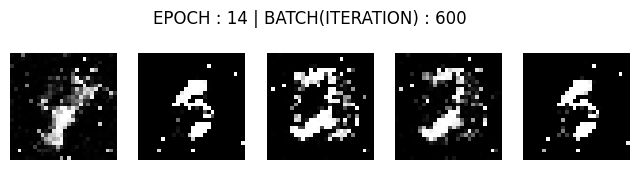

[Epoch: 14/200] [Batch: 657/657] [D loss: 0.275497] [G loss: 1.040218]


  0%|          | 0/657 [00:00<?, ?it/s]

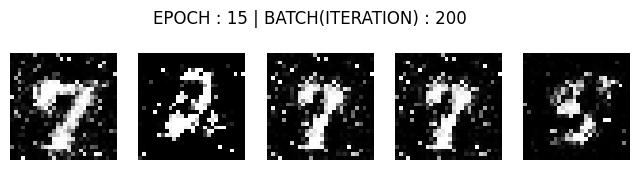

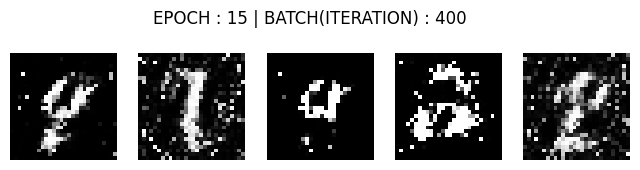

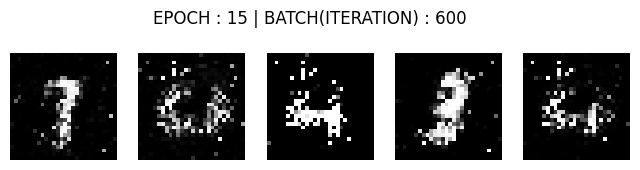

[Epoch: 15/200] [Batch: 657/657] [D loss: 0.244432] [G loss: 3.060253]


  0%|          | 0/657 [00:00<?, ?it/s]

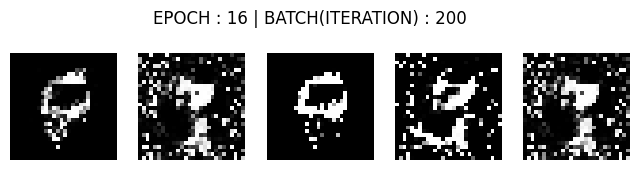

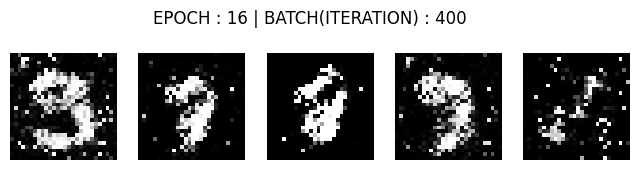

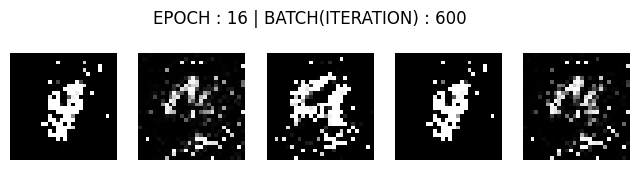

[Epoch: 16/200] [Batch: 657/657] [D loss: 0.397339] [G loss: 0.786539]


  0%|          | 0/657 [00:00<?, ?it/s]

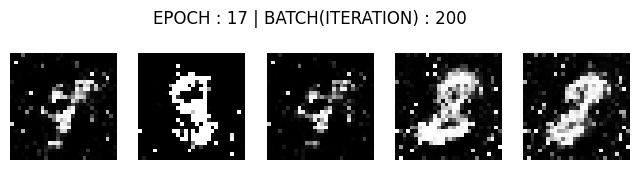

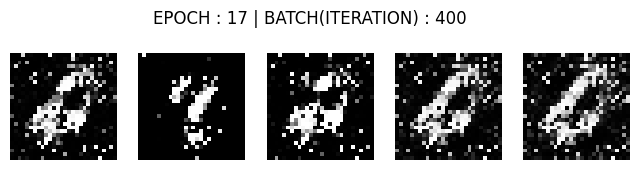

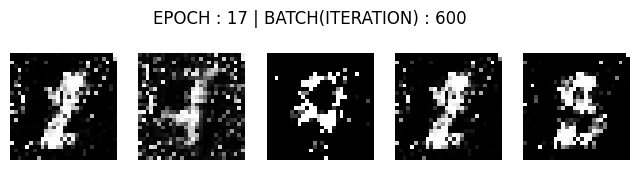

[Epoch: 17/200] [Batch: 657/657] [D loss: 0.158983] [G loss: 1.814391]


  0%|          | 0/657 [00:00<?, ?it/s]

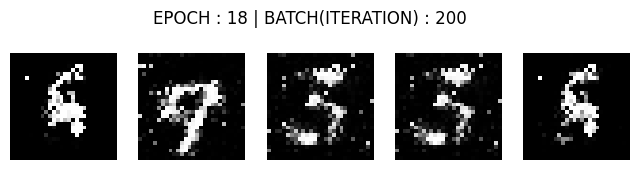

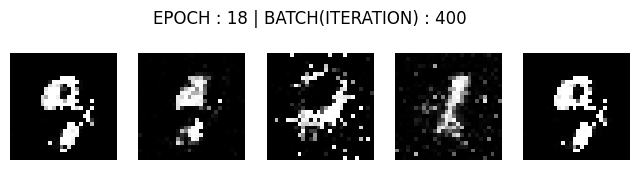

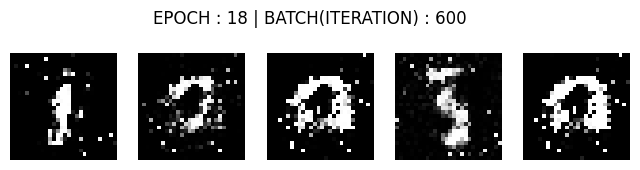

[Epoch: 18/200] [Batch: 657/657] [D loss: 0.273344] [G loss: 2.085323]


  0%|          | 0/657 [00:00<?, ?it/s]

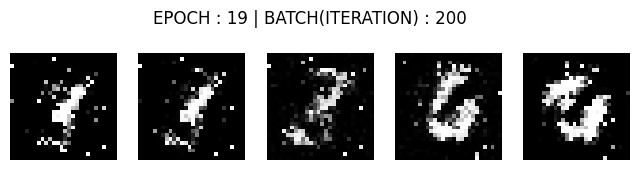

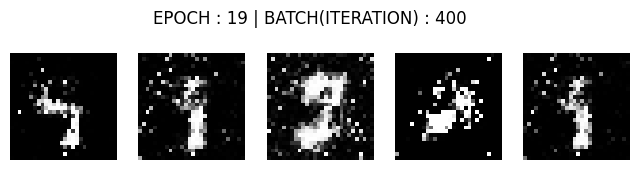

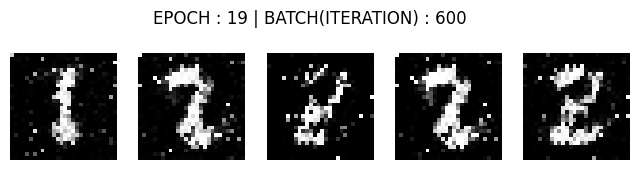

[Epoch: 19/200] [Batch: 657/657] [D loss: 0.398360] [G loss: 3.765217]


  0%|          | 0/657 [00:00<?, ?it/s]

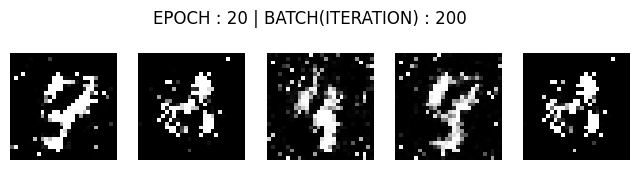

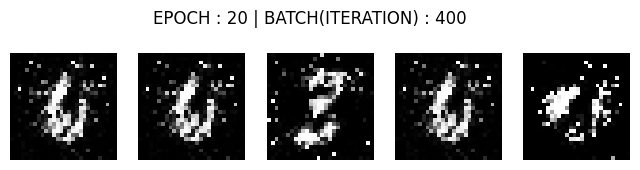

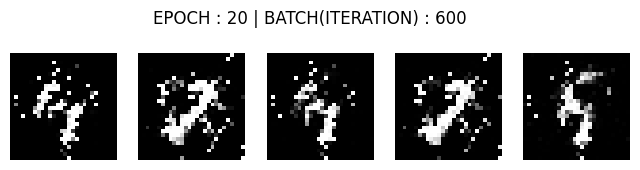

[Epoch: 20/200] [Batch: 657/657] [D loss: 0.112994] [G loss: 2.708084]


  0%|          | 0/657 [00:00<?, ?it/s]

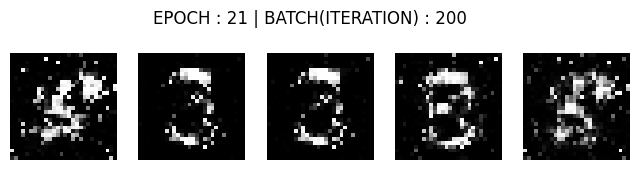

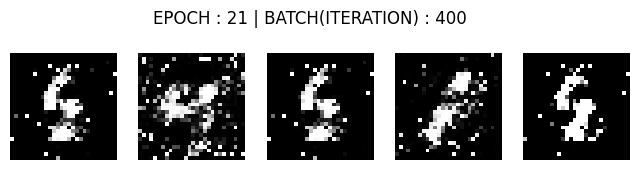

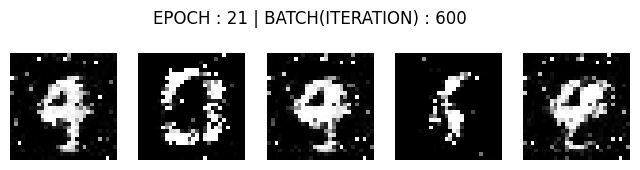

[Epoch: 21/200] [Batch: 657/657] [D loss: 0.149158] [G loss: 2.175846]


  0%|          | 0/657 [00:00<?, ?it/s]

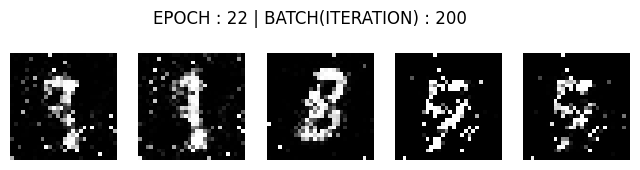

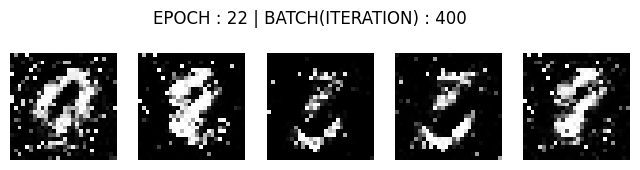

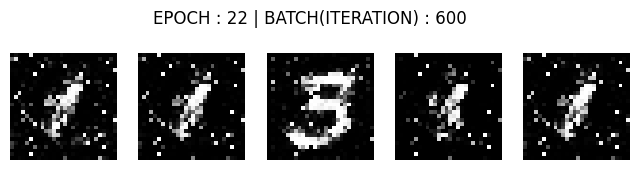

[Epoch: 22/200] [Batch: 657/657] [D loss: 0.178542] [G loss: 2.887684]


  0%|          | 0/657 [00:00<?, ?it/s]

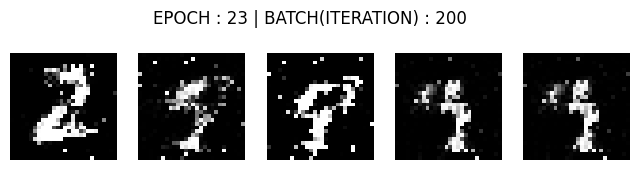

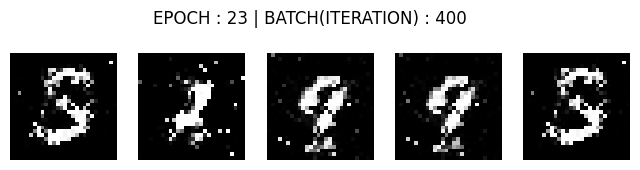

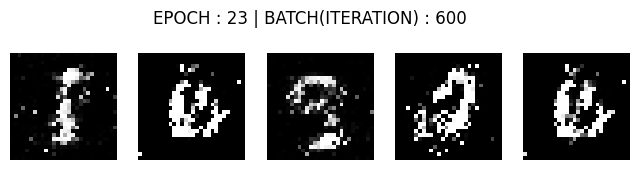

[Epoch: 23/200] [Batch: 657/657] [D loss: 0.337550] [G loss: 3.104504]


  0%|          | 0/657 [00:00<?, ?it/s]

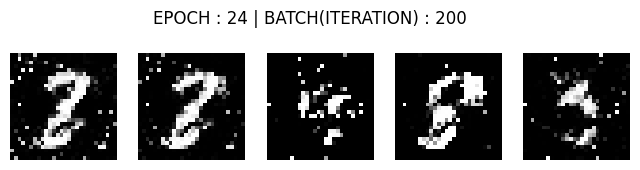

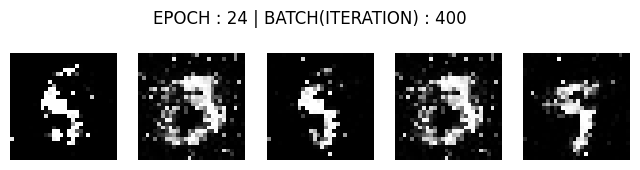

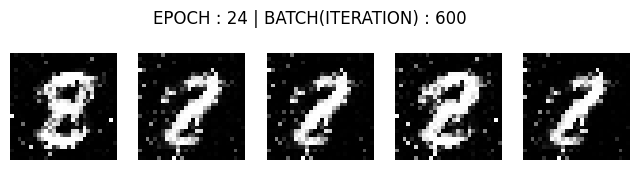

[Epoch: 24/200] [Batch: 657/657] [D loss: 0.113590] [G loss: 2.012681]


  0%|          | 0/657 [00:00<?, ?it/s]

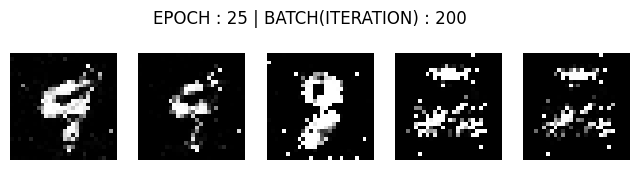

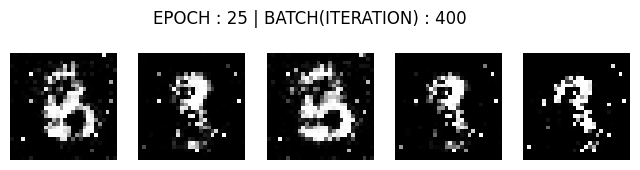

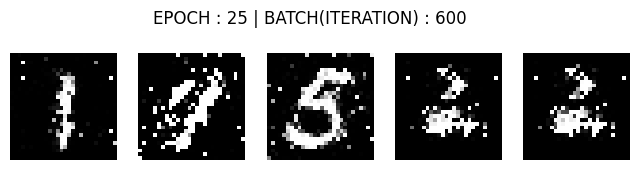

[Epoch: 25/200] [Batch: 657/657] [D loss: 0.163607] [G loss: 3.621884]


  0%|          | 0/657 [00:00<?, ?it/s]

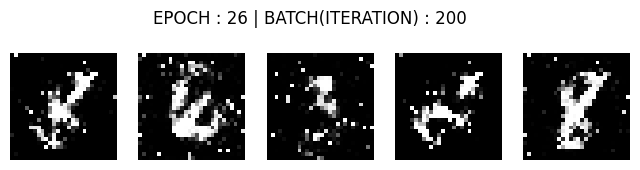

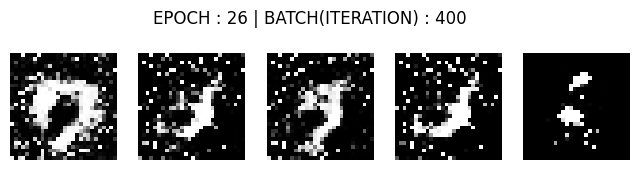

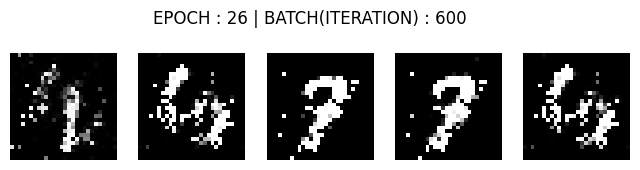

[Epoch: 26/200] [Batch: 657/657] [D loss: 0.074499] [G loss: 2.616348]


  0%|          | 0/657 [00:00<?, ?it/s]

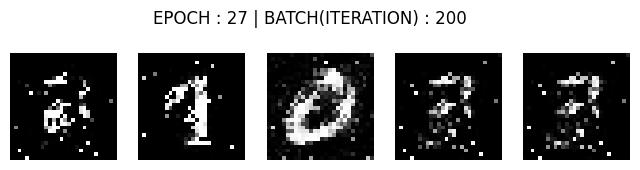

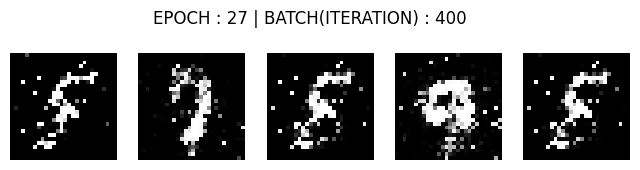

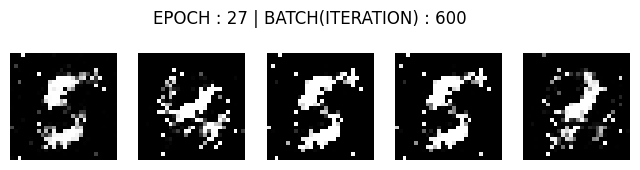

[Epoch: 27/200] [Batch: 657/657] [D loss: 0.227751] [G loss: 2.522776]


  0%|          | 0/657 [00:00<?, ?it/s]

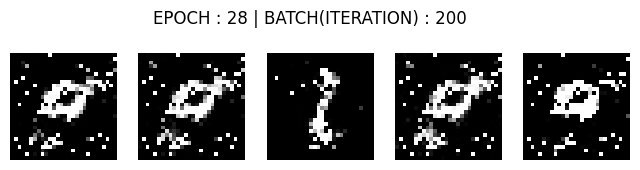

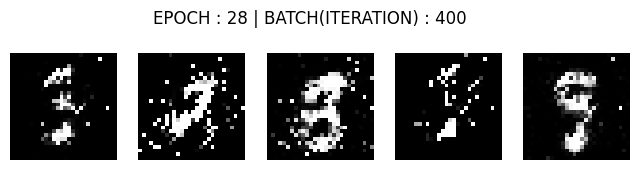

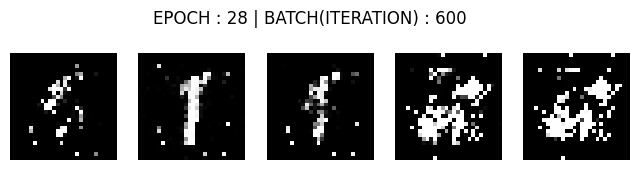

[Epoch: 28/200] [Batch: 657/657] [D loss: 0.426418] [G loss: 5.015402]


  0%|          | 0/657 [00:00<?, ?it/s]

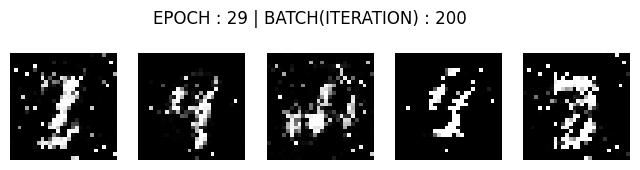

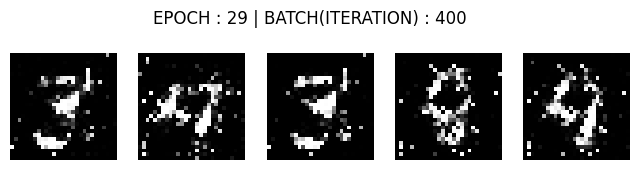

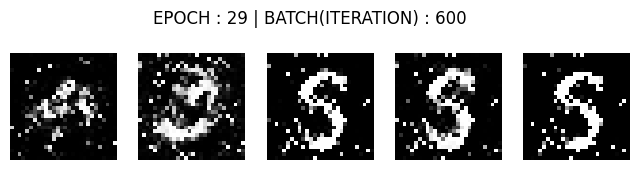

[Epoch: 29/200] [Batch: 657/657] [D loss: 0.144977] [G loss: 3.175924]


  0%|          | 0/657 [00:00<?, ?it/s]

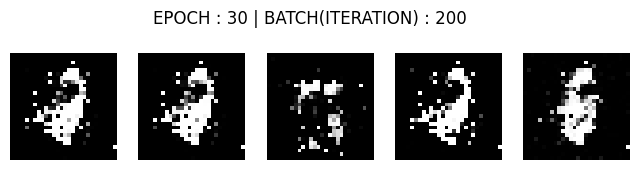

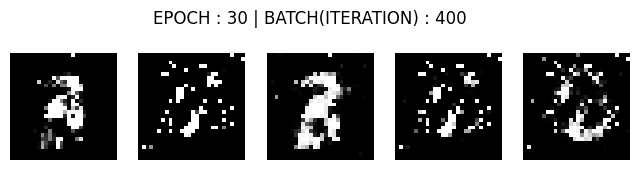

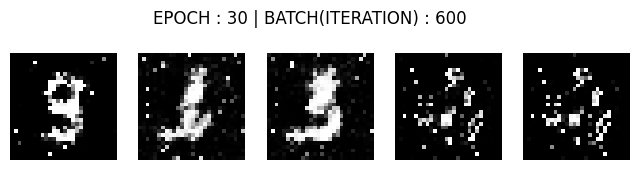

[Epoch: 30/200] [Batch: 657/657] [D loss: 0.594771] [G loss: 7.147563]


  0%|          | 0/657 [00:00<?, ?it/s]

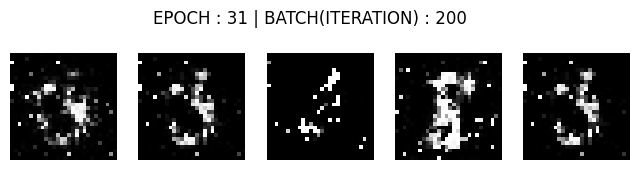

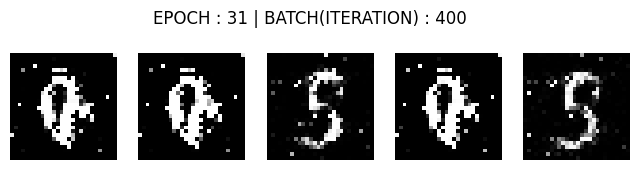

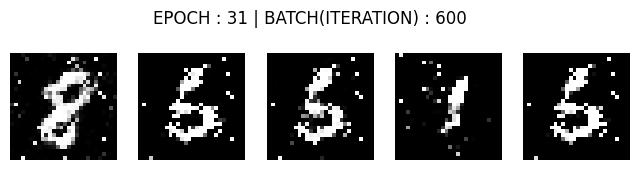

[Epoch: 31/200] [Batch: 657/657] [D loss: 0.086691] [G loss: 2.581695]


  0%|          | 0/657 [00:00<?, ?it/s]

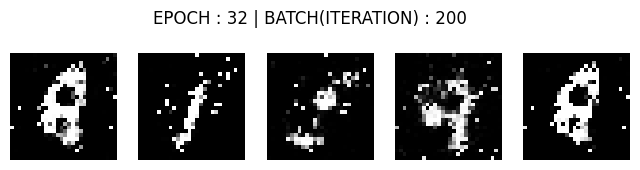

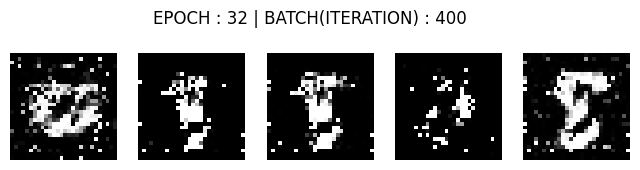

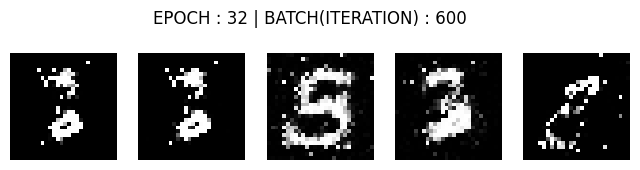

[Epoch: 32/200] [Batch: 657/657] [D loss: 0.102843] [G loss: 2.865365]


  0%|          | 0/657 [00:00<?, ?it/s]

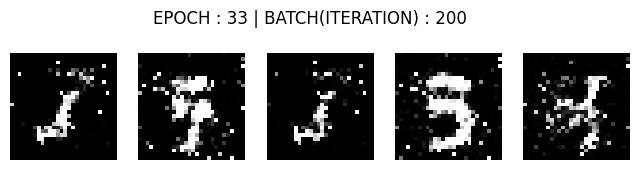

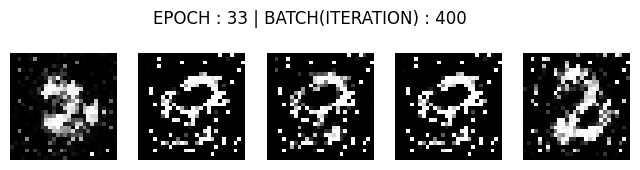

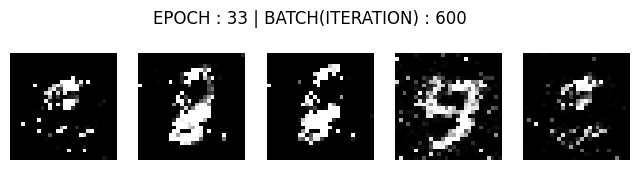

[Epoch: 33/200] [Batch: 657/657] [D loss: 0.118909] [G loss: 3.411813]


  0%|          | 0/657 [00:00<?, ?it/s]

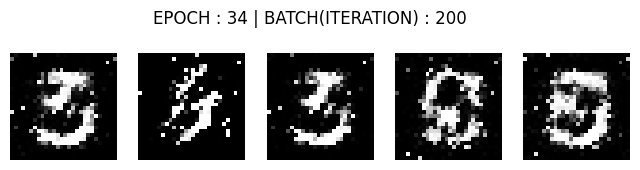

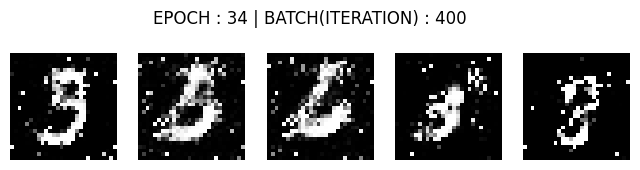

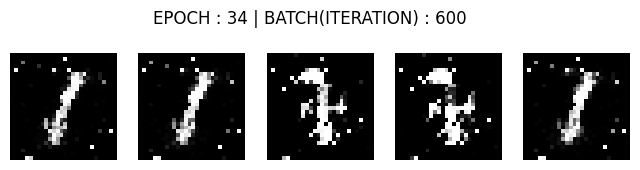

[Epoch: 34/200] [Batch: 657/657] [D loss: 0.138961] [G loss: 1.740022]


  0%|          | 0/657 [00:00<?, ?it/s]

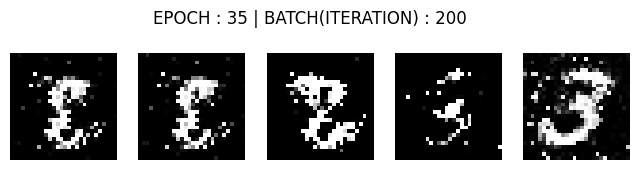

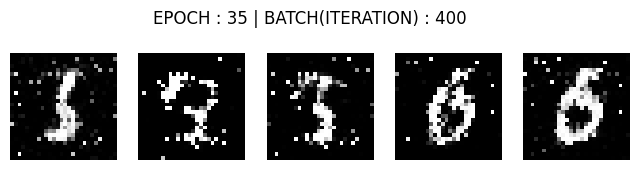

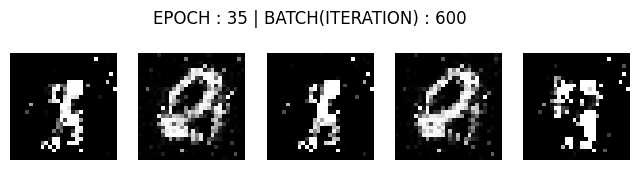

[Epoch: 35/200] [Batch: 657/657] [D loss: 0.056824] [G loss: 2.890183]


  0%|          | 0/657 [00:00<?, ?it/s]

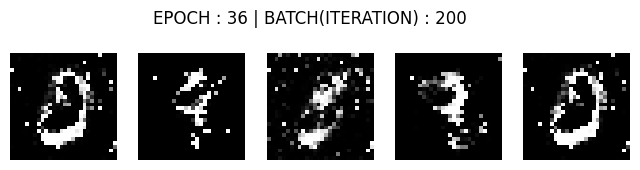

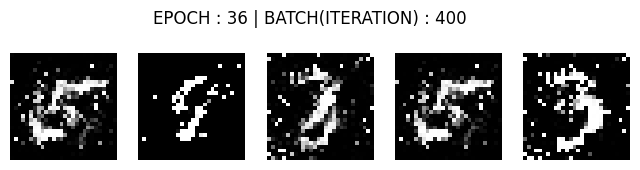

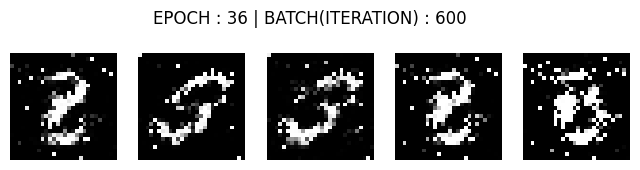

[Epoch: 36/200] [Batch: 657/657] [D loss: 0.254843] [G loss: 3.181777]


  0%|          | 0/657 [00:00<?, ?it/s]

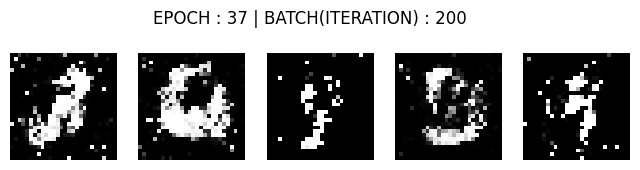

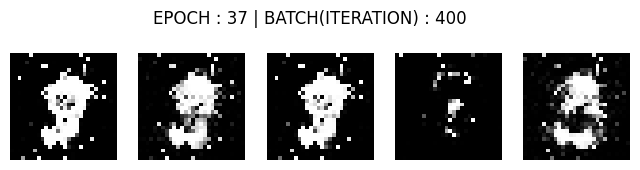

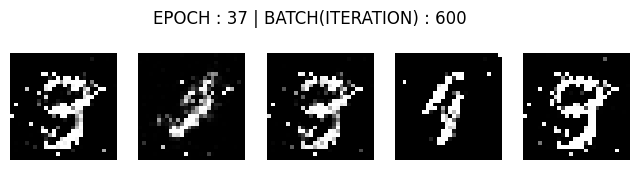

[Epoch: 37/200] [Batch: 657/657] [D loss: 0.157939] [G loss: 3.390646]


  0%|          | 0/657 [00:00<?, ?it/s]

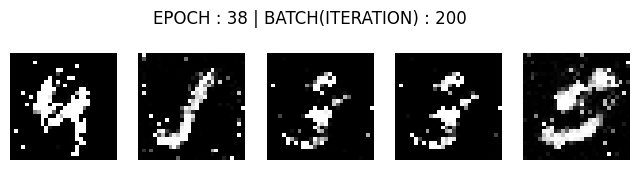

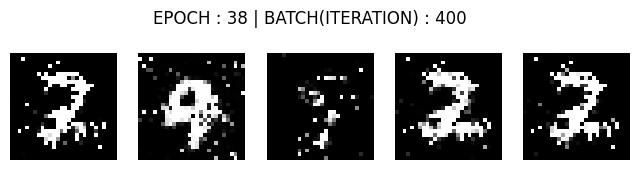

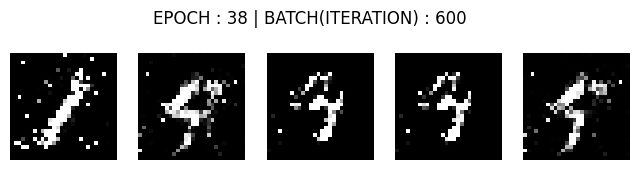

[Epoch: 38/200] [Batch: 657/657] [D loss: 0.452875] [G loss: 5.782287]


  0%|          | 0/657 [00:00<?, ?it/s]

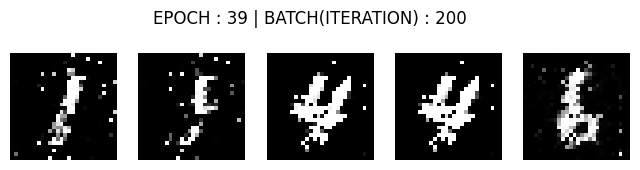

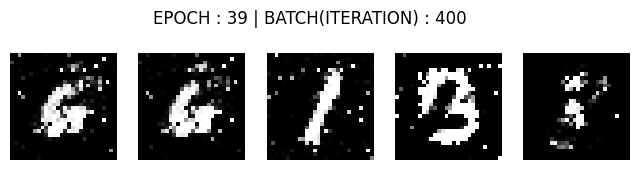

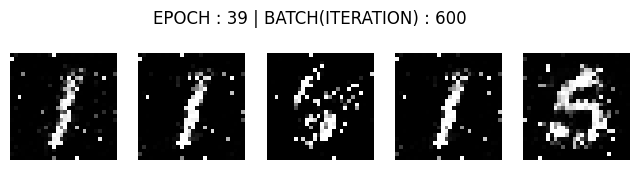

[Epoch: 39/200] [Batch: 657/657] [D loss: 0.055444] [G loss: 2.915676]


  0%|          | 0/657 [00:00<?, ?it/s]

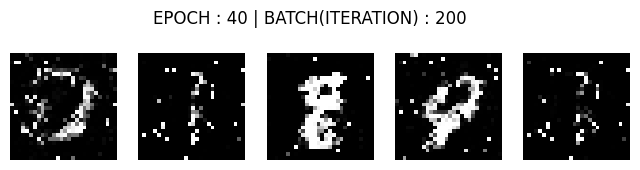

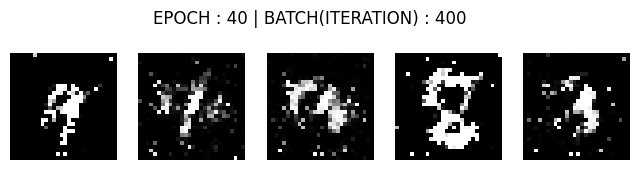

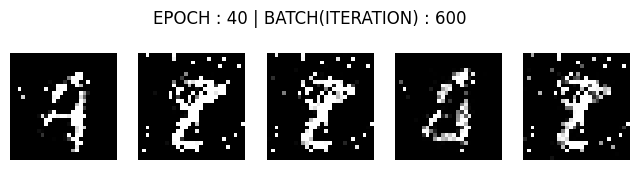

[Epoch: 40/200] [Batch: 657/657] [D loss: 0.145889] [G loss: 2.673082]


  0%|          | 0/657 [00:00<?, ?it/s]

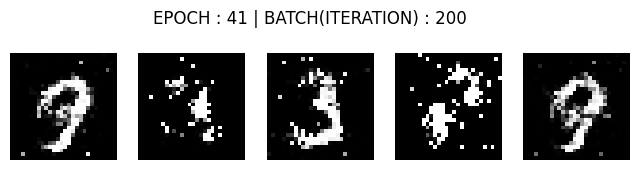

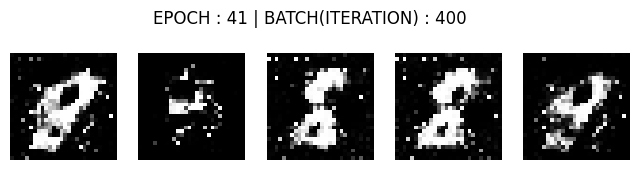

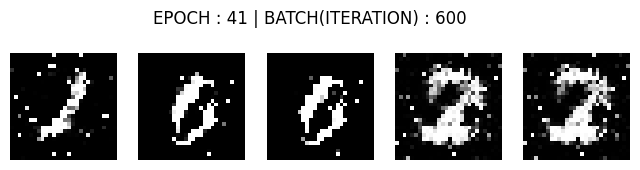

[Epoch: 41/200] [Batch: 657/657] [D loss: 0.030391] [G loss: 3.660718]


  0%|          | 0/657 [00:00<?, ?it/s]

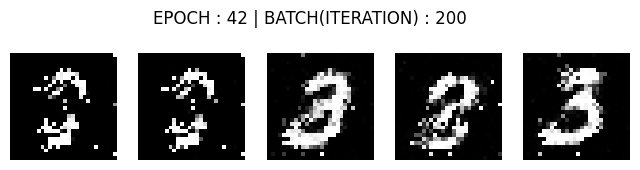

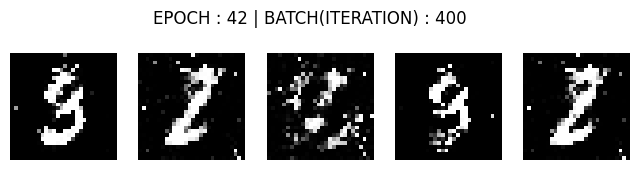

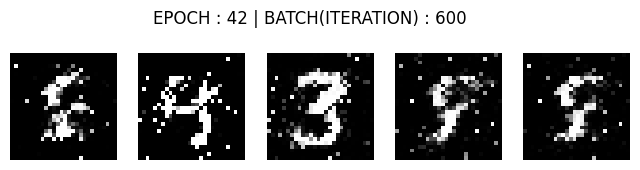

[Epoch: 42/200] [Batch: 657/657] [D loss: 0.085602] [G loss: 3.102890]


  0%|          | 0/657 [00:00<?, ?it/s]

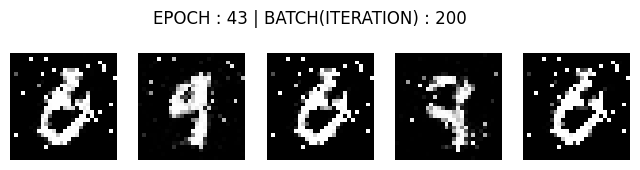

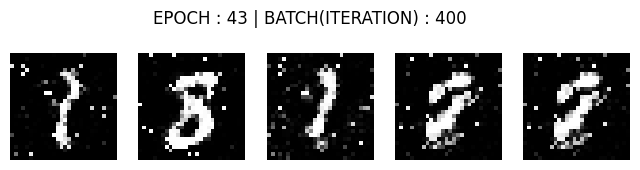

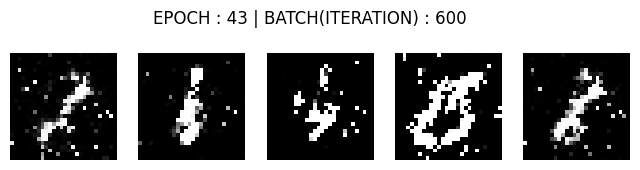

[Epoch: 43/200] [Batch: 657/657] [D loss: 0.367897] [G loss: 1.047266]


  0%|          | 0/657 [00:00<?, ?it/s]

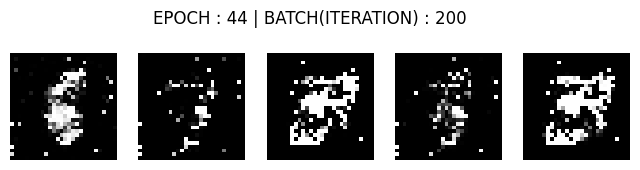

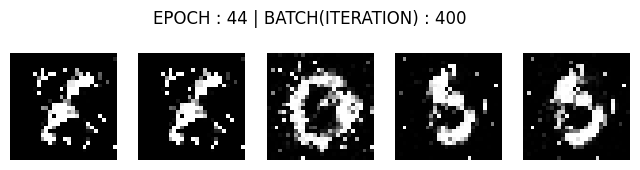

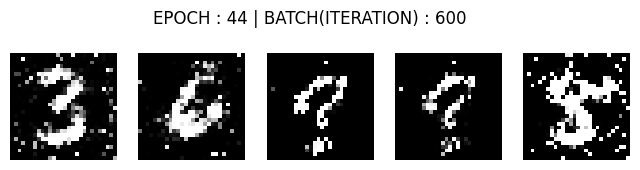

[Epoch: 44/200] [Batch: 657/657] [D loss: 0.052434] [G loss: 3.421188]


  0%|          | 0/657 [00:00<?, ?it/s]

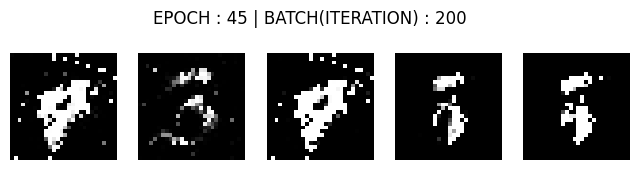

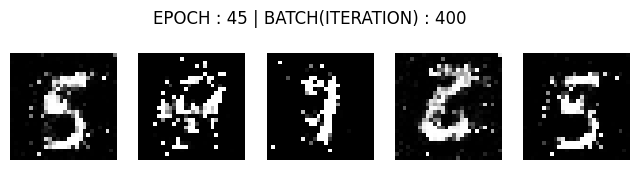

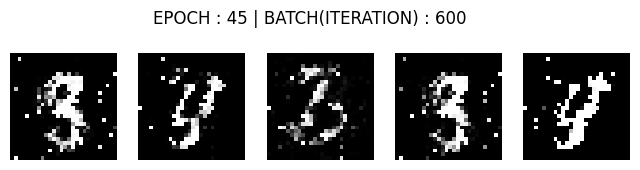

[Epoch: 45/200] [Batch: 657/657] [D loss: 0.047647] [G loss: 2.519337]


  0%|          | 0/657 [00:00<?, ?it/s]

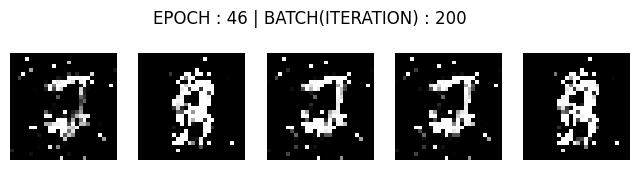

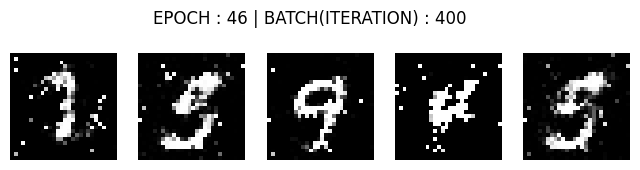

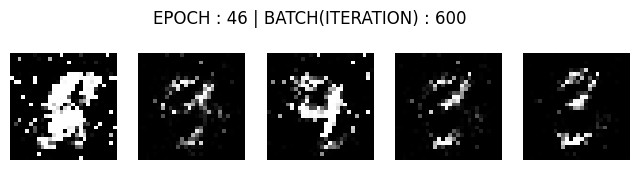

[Epoch: 46/200] [Batch: 657/657] [D loss: 0.124250] [G loss: 1.579402]


  0%|          | 0/657 [00:00<?, ?it/s]

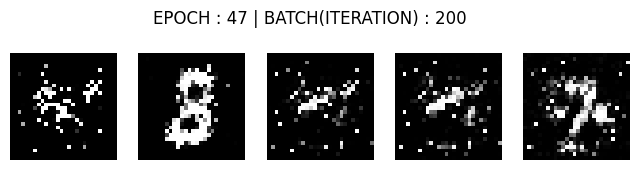

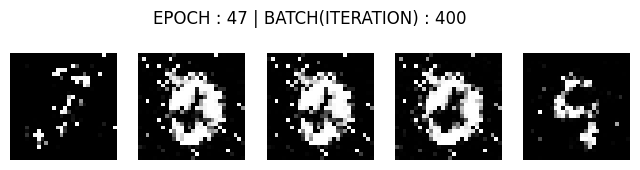

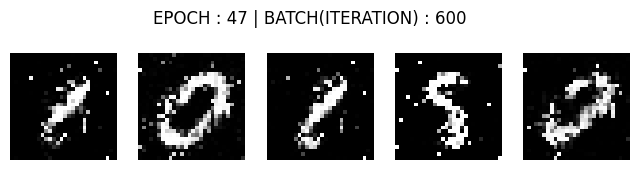

[Epoch: 47/200] [Batch: 657/657] [D loss: 0.239150] [G loss: 3.816679]


  0%|          | 0/657 [00:00<?, ?it/s]

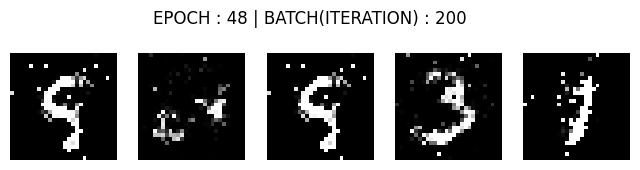

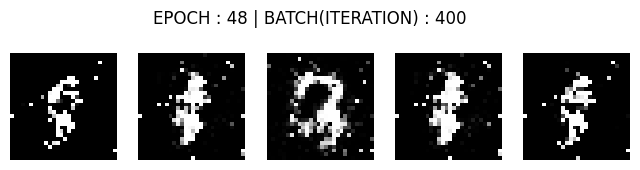

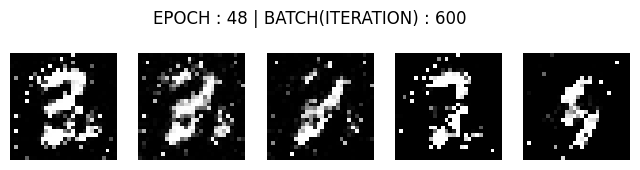

[Epoch: 48/200] [Batch: 657/657] [D loss: 0.081855] [G loss: 3.059344]


  0%|          | 0/657 [00:00<?, ?it/s]

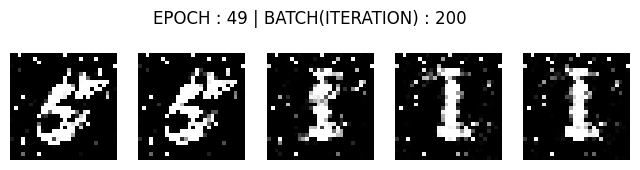

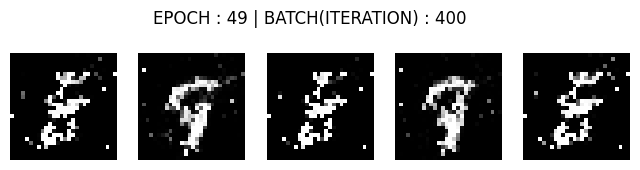

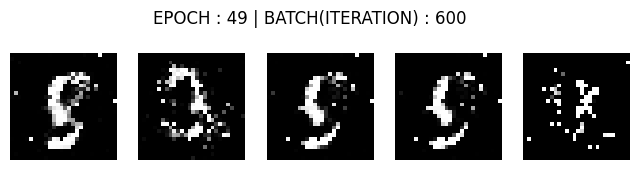

[Epoch: 49/200] [Batch: 657/657] [D loss: 0.199194] [G loss: 3.016768]


  0%|          | 0/657 [00:00<?, ?it/s]

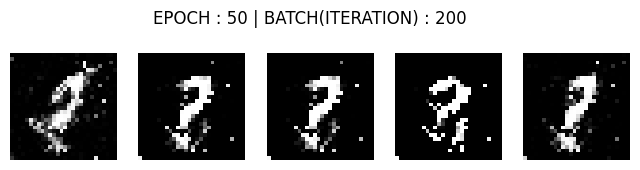

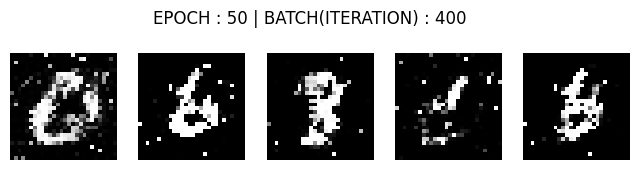

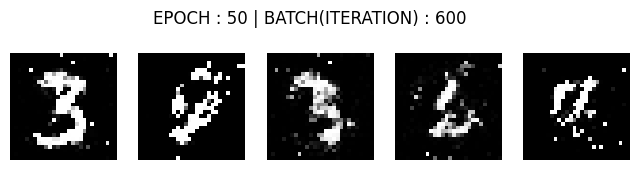

[Epoch: 50/200] [Batch: 657/657] [D loss: 0.051283] [G loss: 3.753153]


  0%|          | 0/657 [00:00<?, ?it/s]

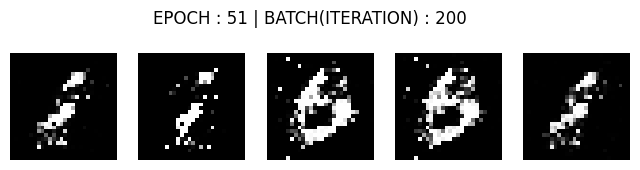

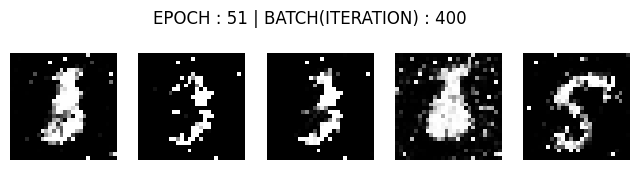

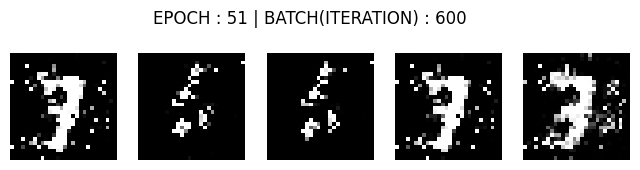

[Epoch: 51/200] [Batch: 657/657] [D loss: 0.098264] [G loss: 2.645294]


  0%|          | 0/657 [00:00<?, ?it/s]

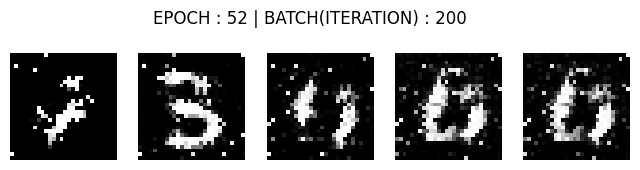

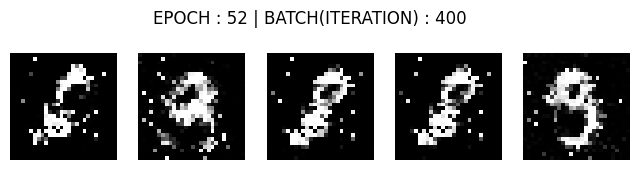

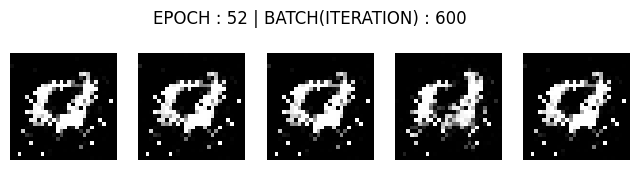

[Epoch: 52/200] [Batch: 657/657] [D loss: 0.233091] [G loss: 2.232921]


  0%|          | 0/657 [00:00<?, ?it/s]

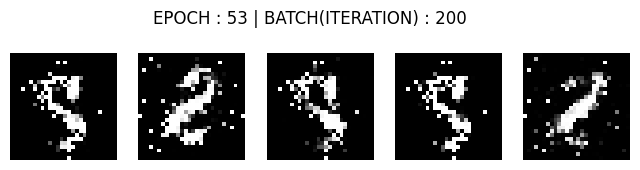

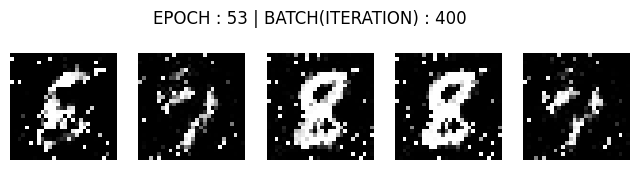

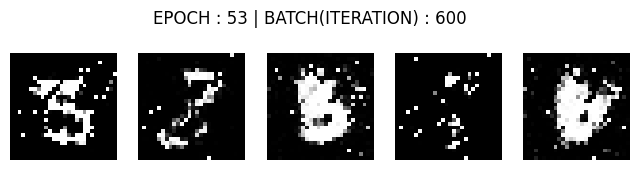

[Epoch: 53/200] [Batch: 657/657] [D loss: 0.164063] [G loss: 2.425728]


  0%|          | 0/657 [00:00<?, ?it/s]

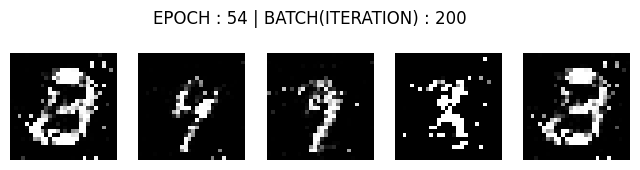

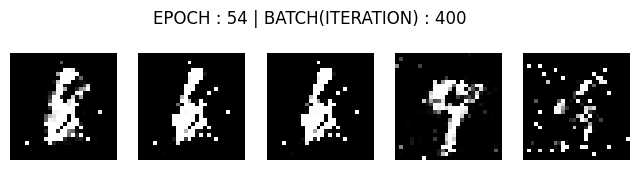

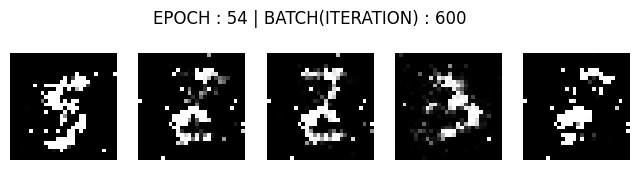

[Epoch: 54/200] [Batch: 657/657] [D loss: 0.094887] [G loss: 3.196939]


  0%|          | 0/657 [00:00<?, ?it/s]

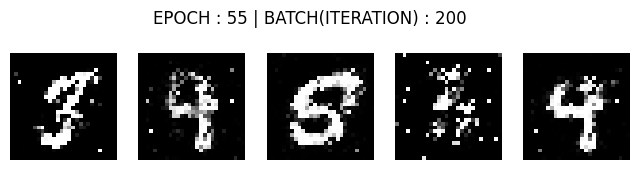

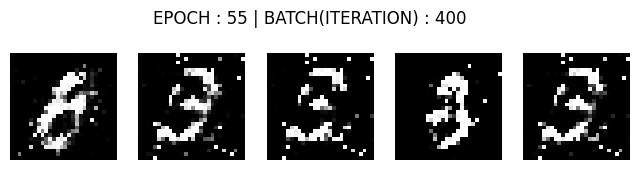

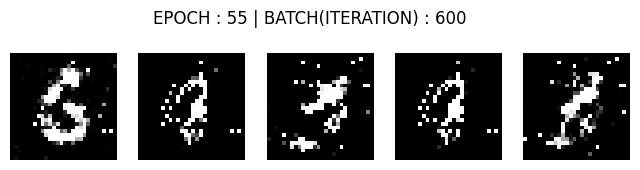

[Epoch: 55/200] [Batch: 657/657] [D loss: 0.061671] [G loss: 2.762481]


  0%|          | 0/657 [00:00<?, ?it/s]

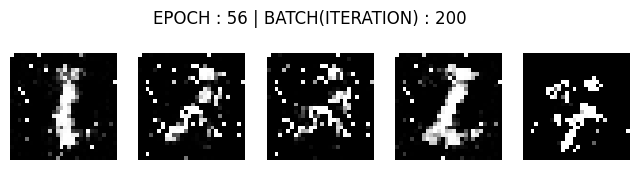

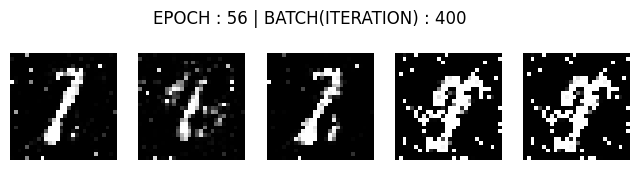

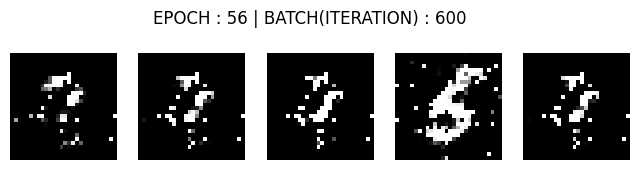

[Epoch: 56/200] [Batch: 657/657] [D loss: 0.064885] [G loss: 2.554515]


  0%|          | 0/657 [00:00<?, ?it/s]

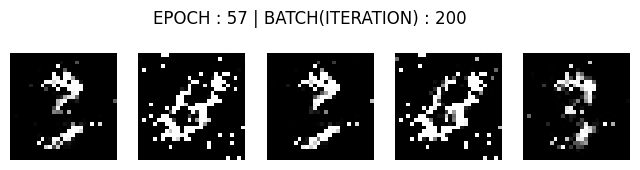

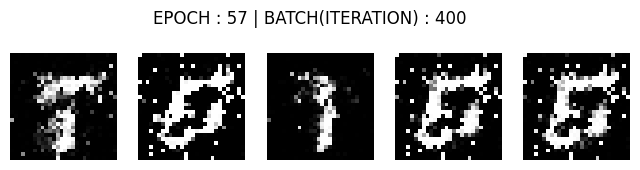

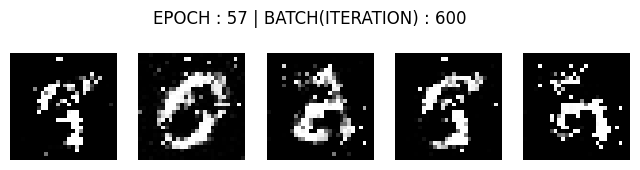

[Epoch: 57/200] [Batch: 657/657] [D loss: 0.095716] [G loss: 2.312700]


  0%|          | 0/657 [00:00<?, ?it/s]

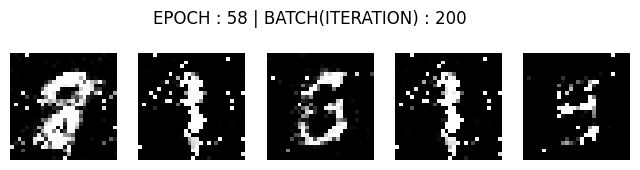

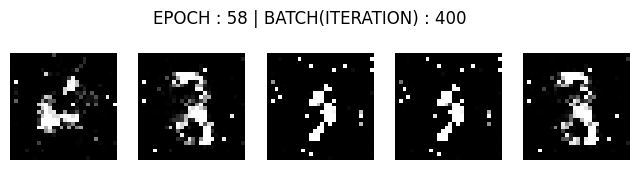

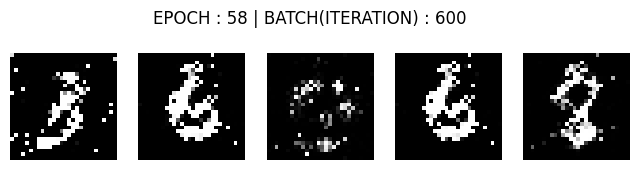

[Epoch: 58/200] [Batch: 657/657] [D loss: 0.128397] [G loss: 3.668130]


  0%|          | 0/657 [00:00<?, ?it/s]

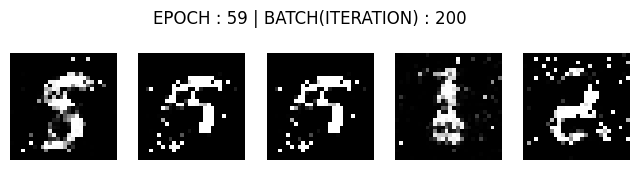

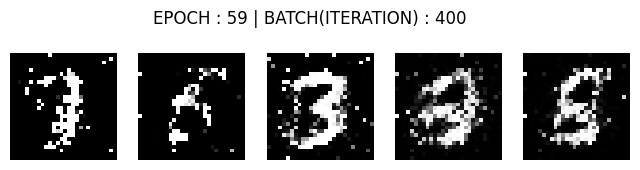

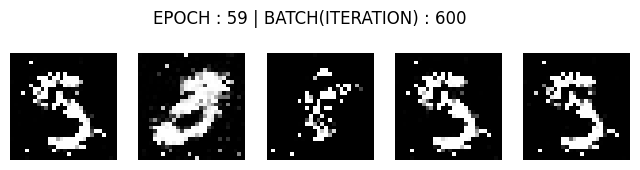

[Epoch: 59/200] [Batch: 657/657] [D loss: 0.126812] [G loss: 2.470056]


  0%|          | 0/657 [00:00<?, ?it/s]

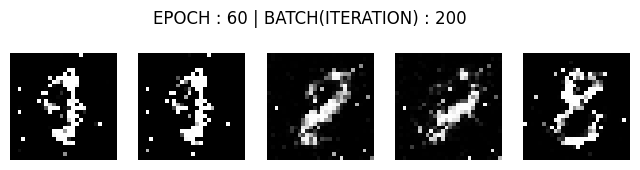

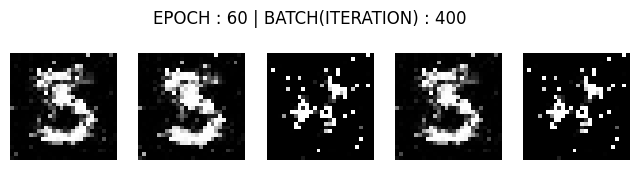

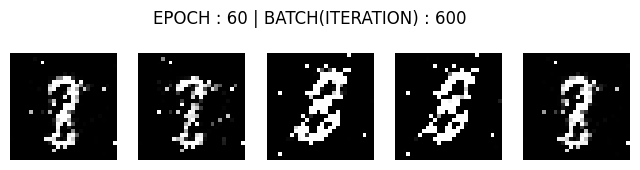

[Epoch: 60/200] [Batch: 657/657] [D loss: 0.021080] [G loss: 4.410488]


  0%|          | 0/657 [00:00<?, ?it/s]

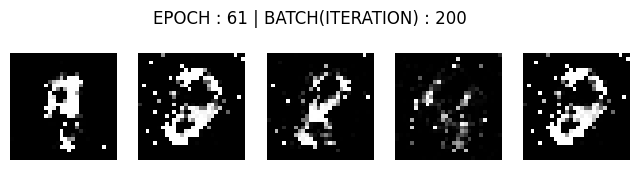

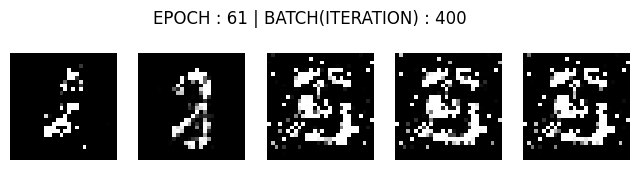

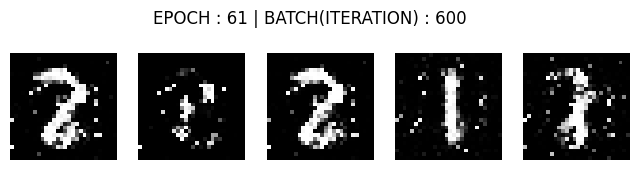

[Epoch: 61/200] [Batch: 657/657] [D loss: 0.093661] [G loss: 2.797769]


  0%|          | 0/657 [00:00<?, ?it/s]

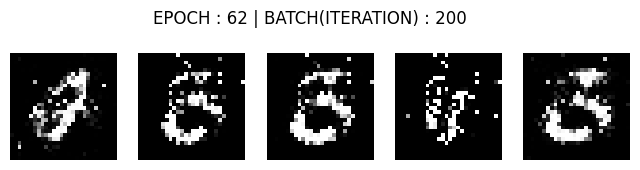

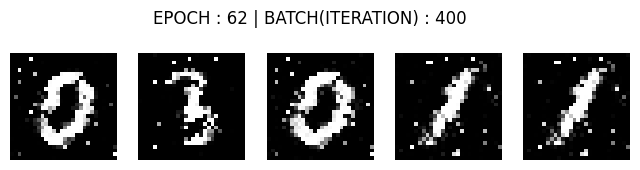

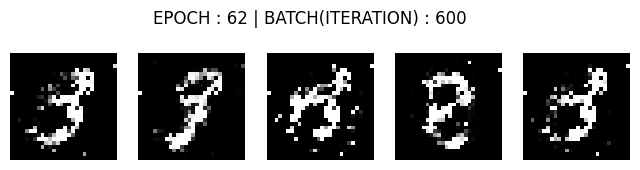

[Epoch: 62/200] [Batch: 657/657] [D loss: 0.011118] [G loss: 4.633708]


  0%|          | 0/657 [00:00<?, ?it/s]

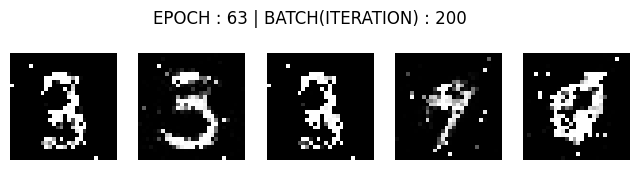

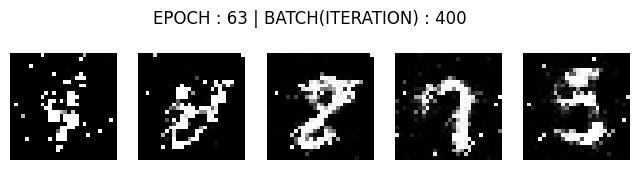

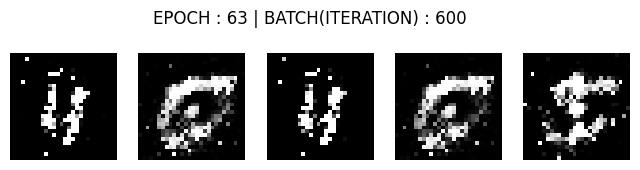

[Epoch: 63/200] [Batch: 657/657] [D loss: 0.082563] [G loss: 2.365818]


  0%|          | 0/657 [00:00<?, ?it/s]

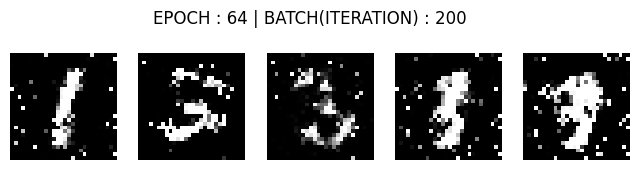

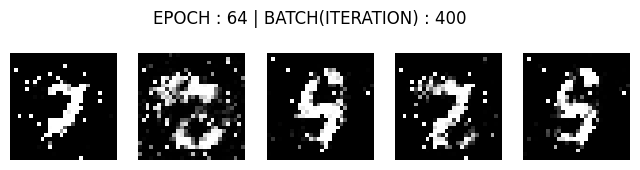

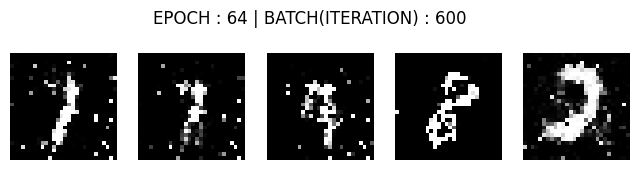

[Epoch: 64/200] [Batch: 657/657] [D loss: 0.202815] [G loss: 3.139502]


  0%|          | 0/657 [00:00<?, ?it/s]

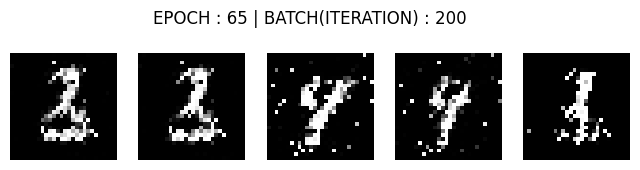

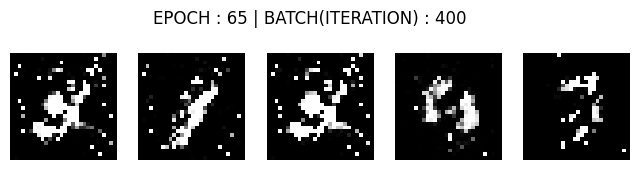

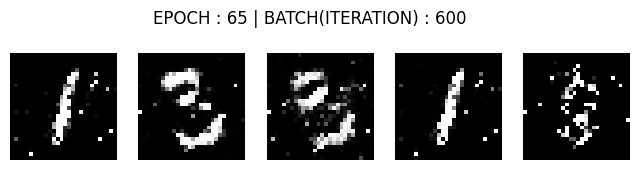

[Epoch: 65/200] [Batch: 657/657] [D loss: 0.137693] [G loss: 3.671397]


  0%|          | 0/657 [00:00<?, ?it/s]

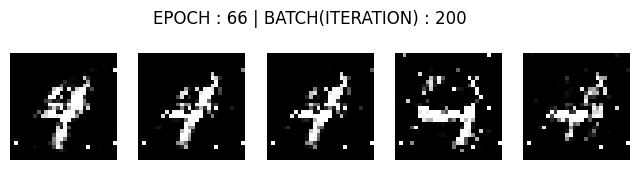

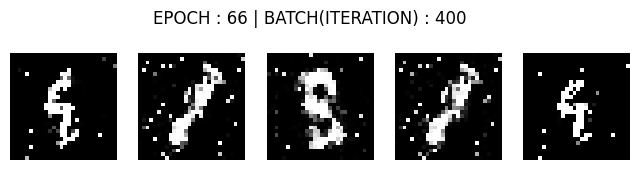

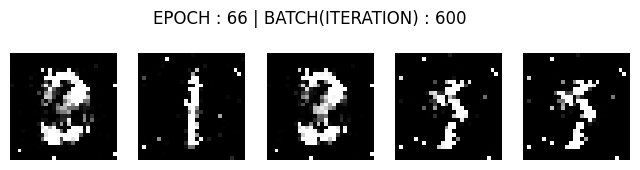

[Epoch: 66/200] [Batch: 657/657] [D loss: 0.266307] [G loss: 3.379584]


  0%|          | 0/657 [00:00<?, ?it/s]

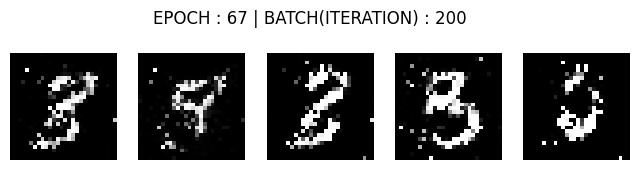

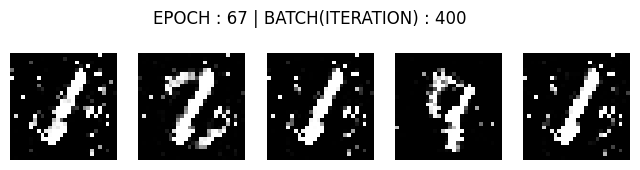

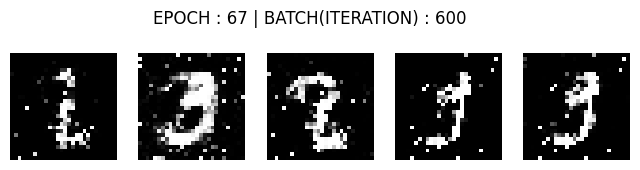

[Epoch: 67/200] [Batch: 657/657] [D loss: 0.029231] [G loss: 3.138416]


  0%|          | 0/657 [00:00<?, ?it/s]

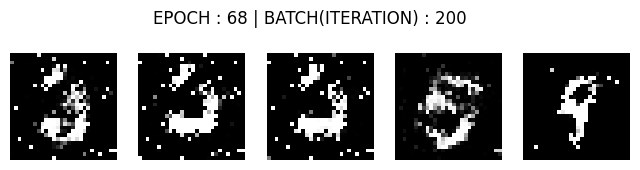

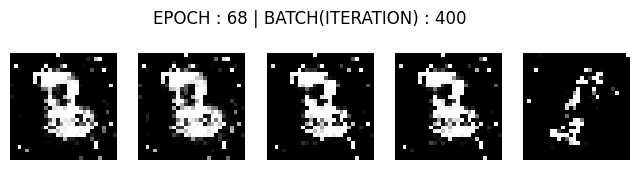

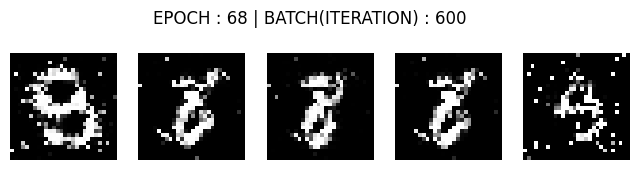

[Epoch: 68/200] [Batch: 657/657] [D loss: 0.089634] [G loss: 4.170259]


  0%|          | 0/657 [00:00<?, ?it/s]

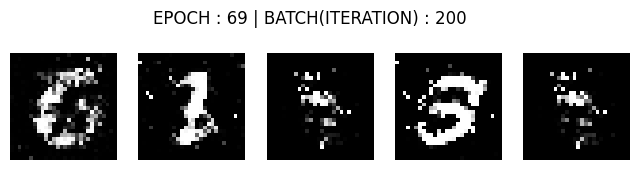

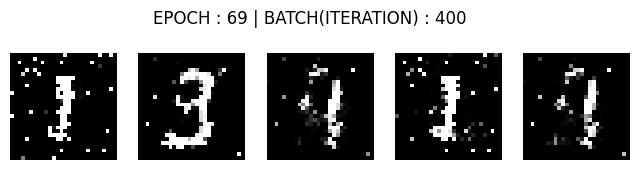

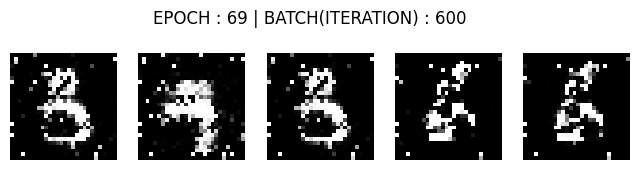

[Epoch: 69/200] [Batch: 657/657] [D loss: 0.053359] [G loss: 3.654252]


  0%|          | 0/657 [00:00<?, ?it/s]

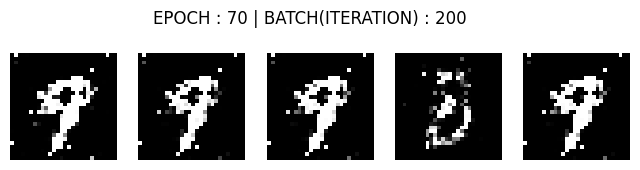

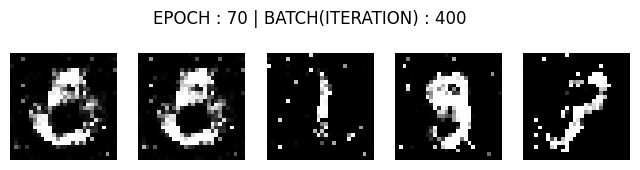

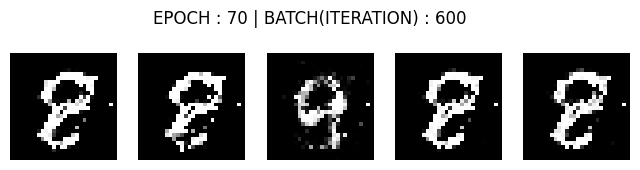

[Epoch: 70/200] [Batch: 657/657] [D loss: 0.169966] [G loss: 3.478589]


  0%|          | 0/657 [00:00<?, ?it/s]

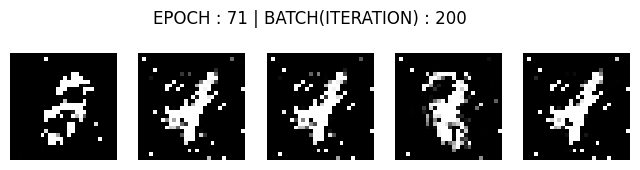

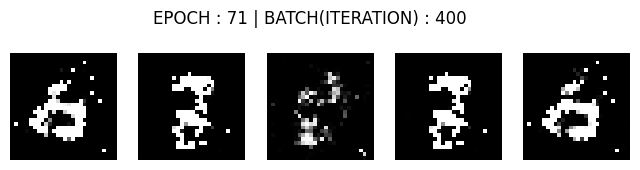

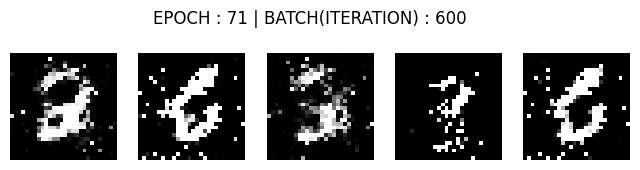

[Epoch: 71/200] [Batch: 657/657] [D loss: 0.095925] [G loss: 3.630691]


  0%|          | 0/657 [00:00<?, ?it/s]

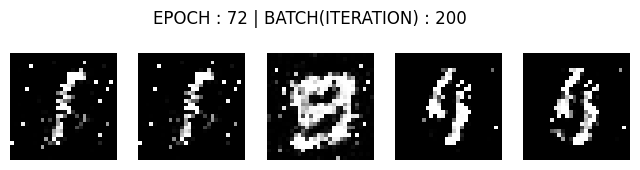

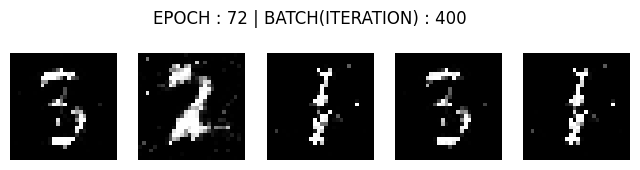

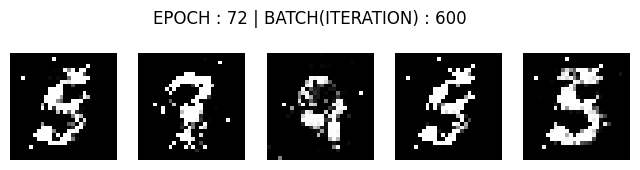

[Epoch: 72/200] [Batch: 657/657] [D loss: 0.100620] [G loss: 3.330041]


  0%|          | 0/657 [00:00<?, ?it/s]

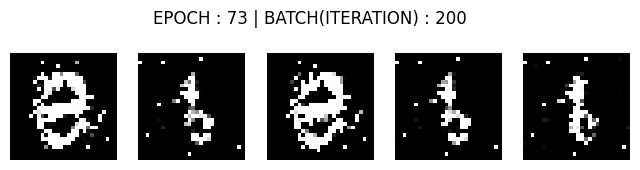

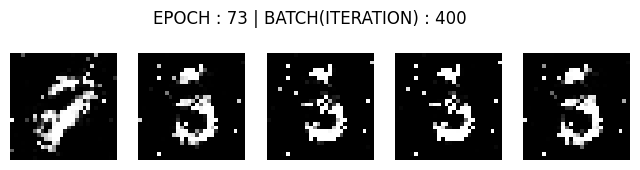

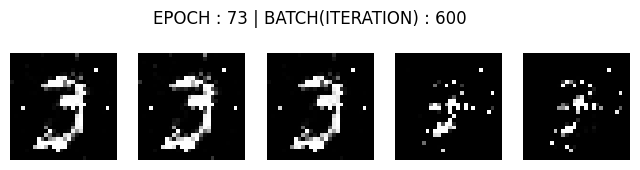

[Epoch: 73/200] [Batch: 657/657] [D loss: 0.073467] [G loss: 4.842468]


  0%|          | 0/657 [00:00<?, ?it/s]

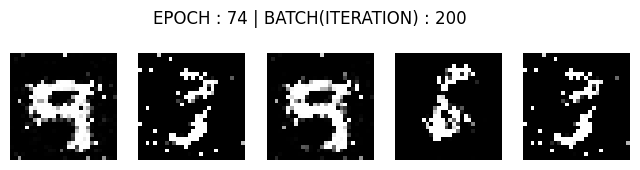

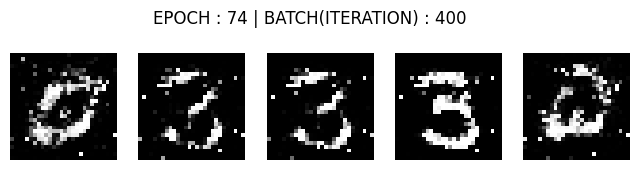

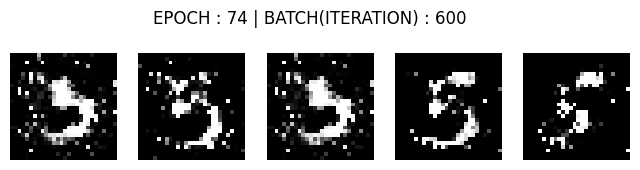

[Epoch: 74/200] [Batch: 657/657] [D loss: 0.114889] [G loss: 6.364221]


  0%|          | 0/657 [00:00<?, ?it/s]

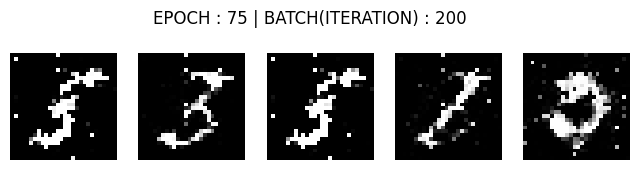

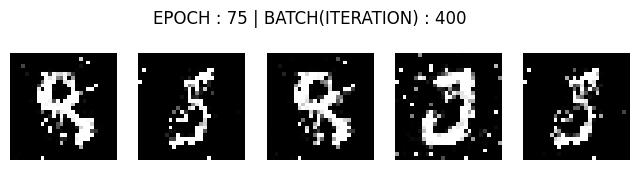

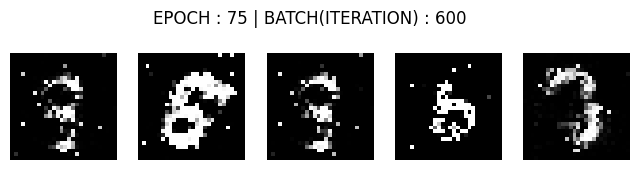

[Epoch: 75/200] [Batch: 657/657] [D loss: 0.040587] [G loss: 2.996814]


  0%|          | 0/657 [00:00<?, ?it/s]

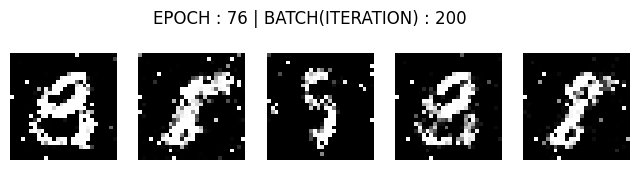

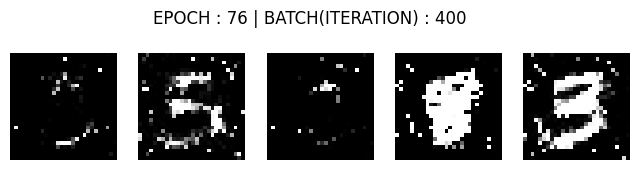

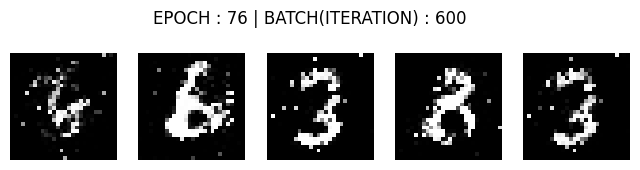

[Epoch: 76/200] [Batch: 657/657] [D loss: 0.065485] [G loss: 2.513530]


  0%|          | 0/657 [00:00<?, ?it/s]

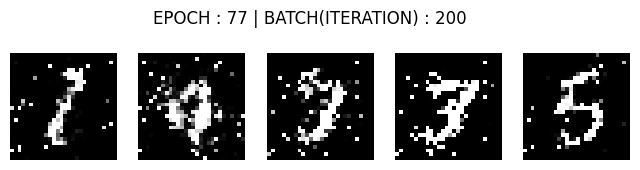

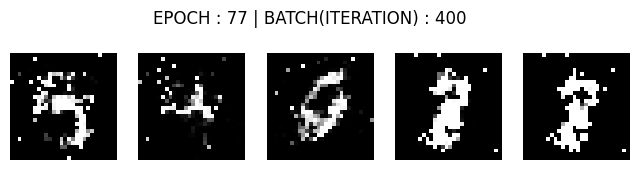

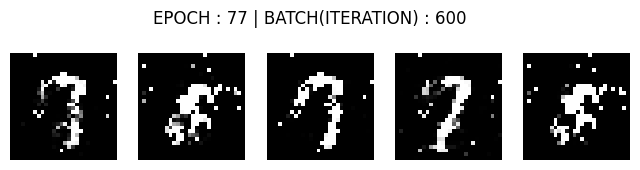

[Epoch: 77/200] [Batch: 657/657] [D loss: 0.044402] [G loss: 3.538756]


  0%|          | 0/657 [00:00<?, ?it/s]

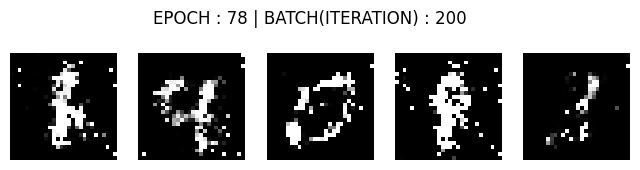

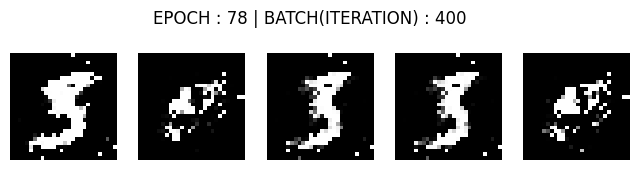

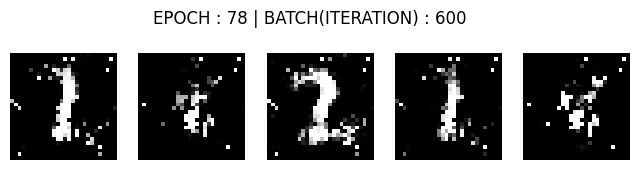

[Epoch: 78/200] [Batch: 657/657] [D loss: 0.050155] [G loss: 3.628687]


  0%|          | 0/657 [00:00<?, ?it/s]

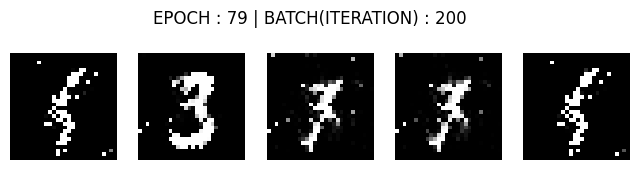

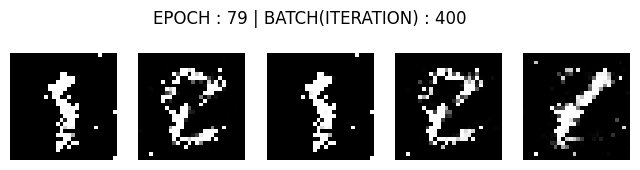

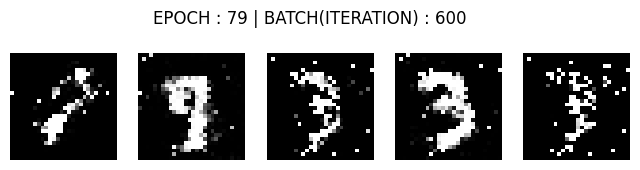

[Epoch: 79/200] [Batch: 657/657] [D loss: 0.251725] [G loss: 4.661610]


  0%|          | 0/657 [00:00<?, ?it/s]

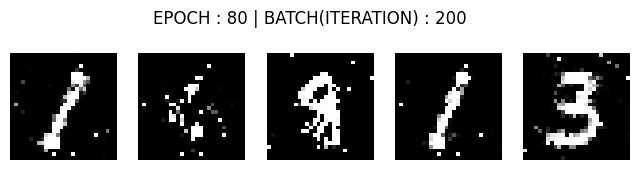

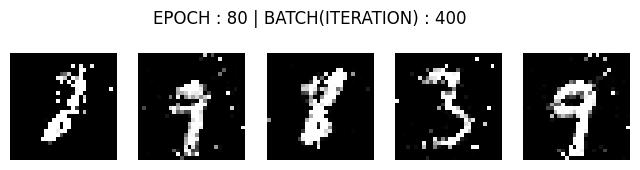

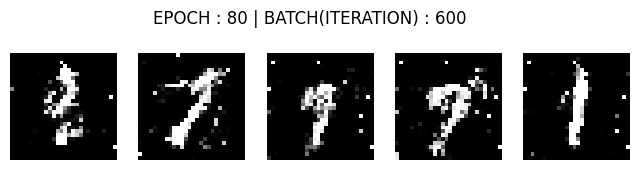

[Epoch: 80/200] [Batch: 657/657] [D loss: 0.106360] [G loss: 3.067237]


  0%|          | 0/657 [00:00<?, ?it/s]

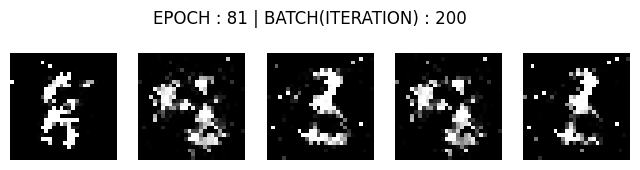

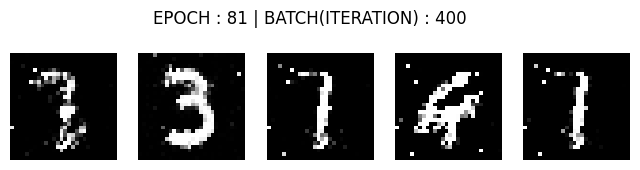

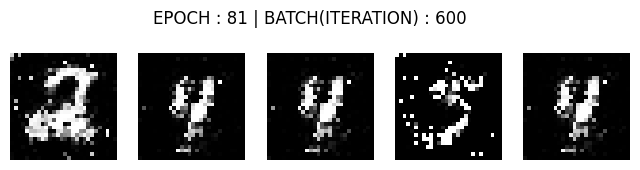

[Epoch: 81/200] [Batch: 657/657] [D loss: 0.287522] [G loss: 2.648253]


  0%|          | 0/657 [00:00<?, ?it/s]

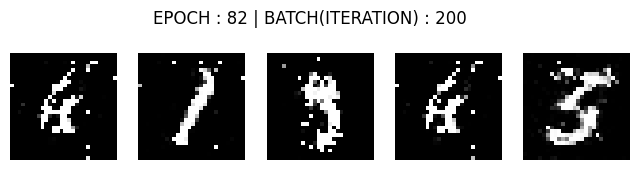

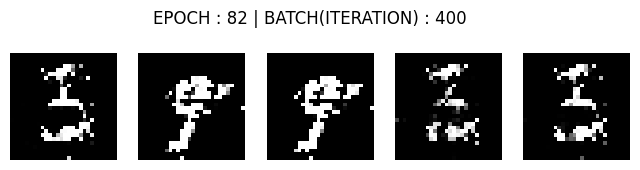

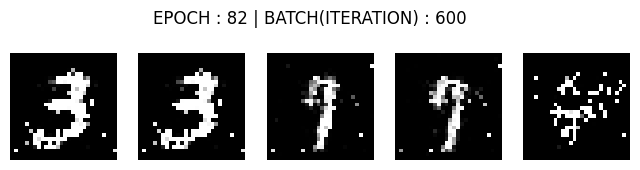

[Epoch: 82/200] [Batch: 657/657] [D loss: 0.169903] [G loss: 7.171988]


  0%|          | 0/657 [00:00<?, ?it/s]

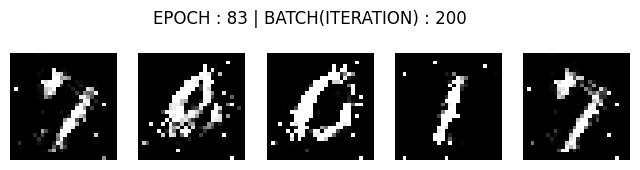

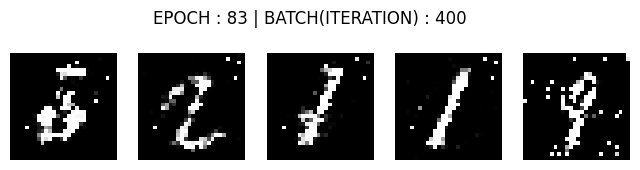

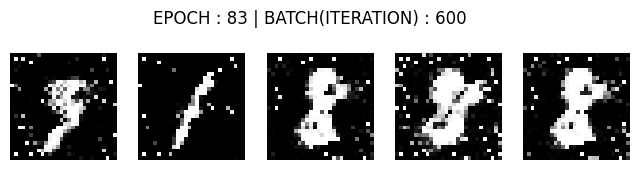

[Epoch: 83/200] [Batch: 657/657] [D loss: 0.129732] [G loss: 2.596097]


  0%|          | 0/657 [00:00<?, ?it/s]

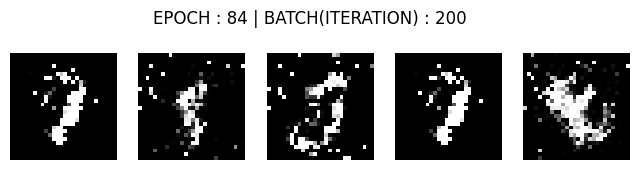

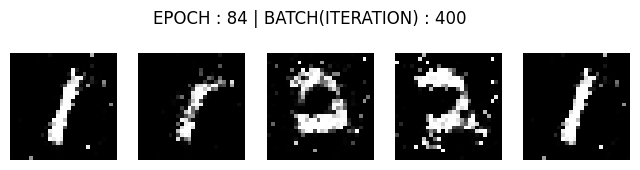

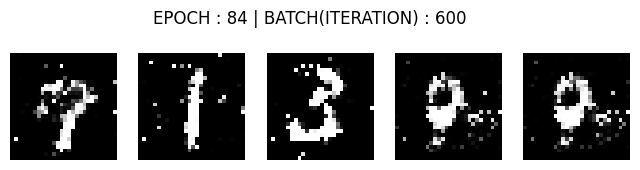

[Epoch: 84/200] [Batch: 657/657] [D loss: 0.072354] [G loss: 2.176631]


  0%|          | 0/657 [00:00<?, ?it/s]

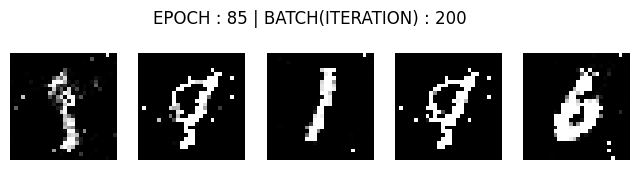

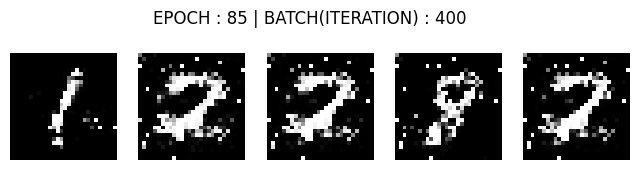

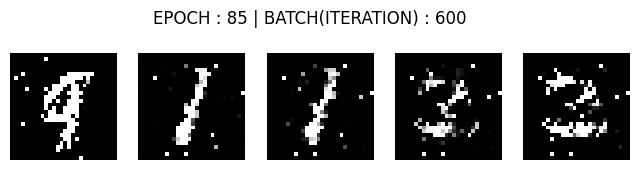

[Epoch: 85/200] [Batch: 657/657] [D loss: 0.097241] [G loss: 2.480441]


  0%|          | 0/657 [00:00<?, ?it/s]

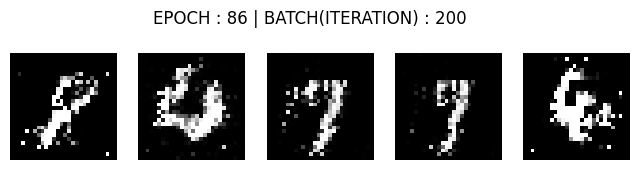

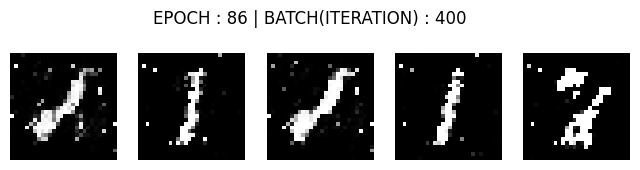

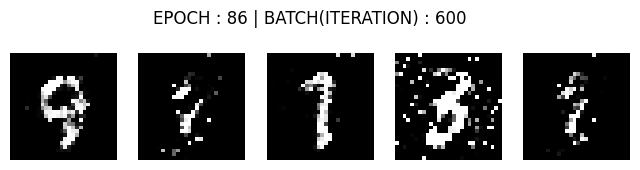

[Epoch: 86/200] [Batch: 657/657] [D loss: 0.161297] [G loss: 3.174486]


  0%|          | 0/657 [00:00<?, ?it/s]

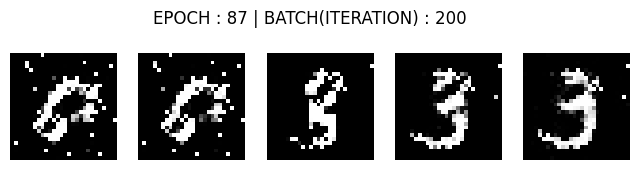

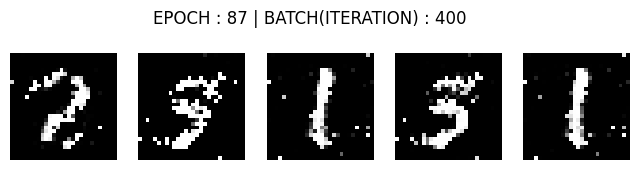

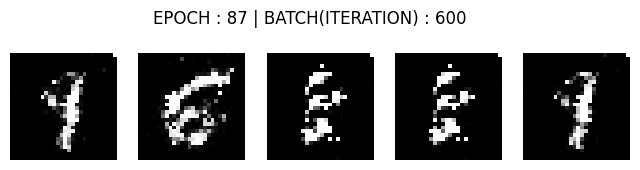

[Epoch: 87/200] [Batch: 657/657] [D loss: 0.049728] [G loss: 3.383796]


  0%|          | 0/657 [00:00<?, ?it/s]

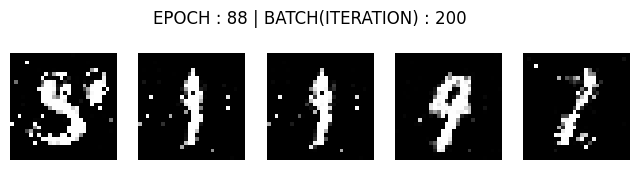

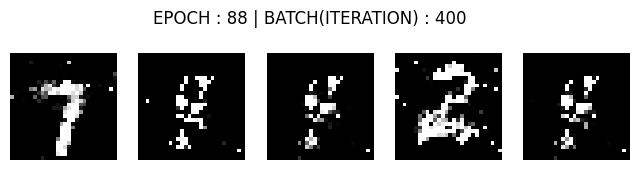

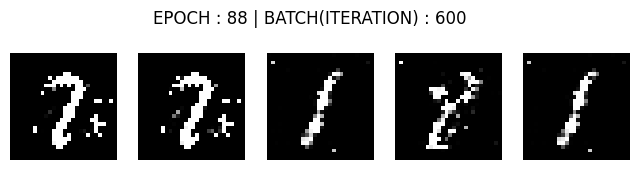

[Epoch: 88/200] [Batch: 657/657] [D loss: 0.044036] [G loss: 5.448777]


  0%|          | 0/657 [00:00<?, ?it/s]

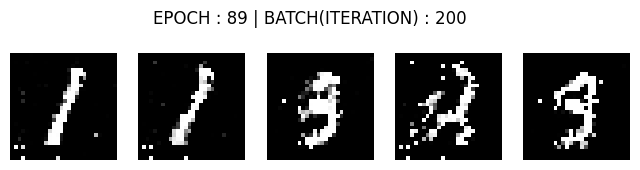

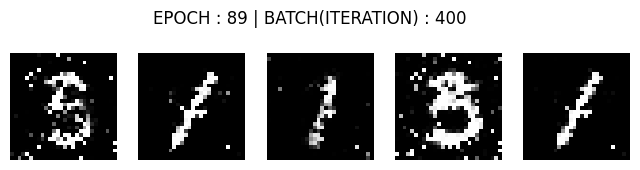

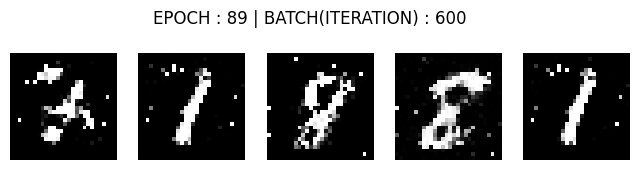

[Epoch: 89/200] [Batch: 657/657] [D loss: 0.102553] [G loss: 2.918214]


  0%|          | 0/657 [00:00<?, ?it/s]

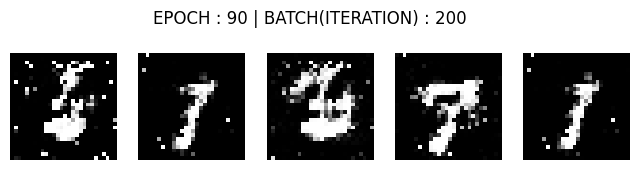

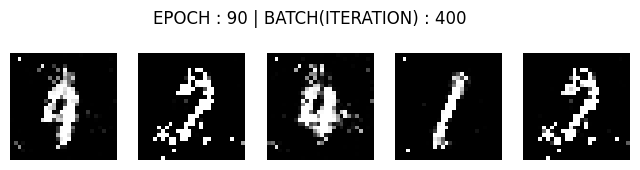

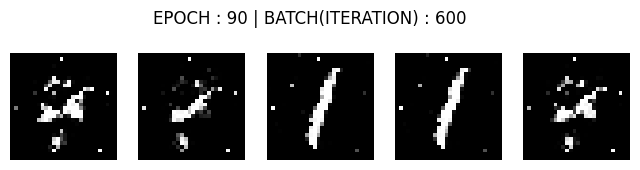

[Epoch: 90/200] [Batch: 657/657] [D loss: 0.294704] [G loss: 5.923131]


  0%|          | 0/657 [00:00<?, ?it/s]

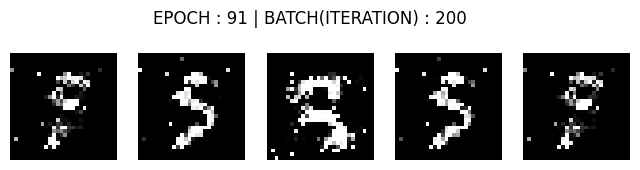

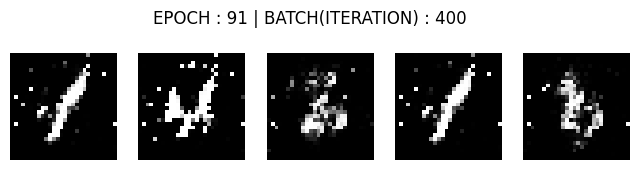

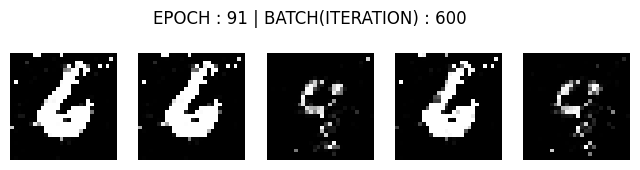

[Epoch: 91/200] [Batch: 657/657] [D loss: 0.072907] [G loss: 3.718974]


  0%|          | 0/657 [00:00<?, ?it/s]

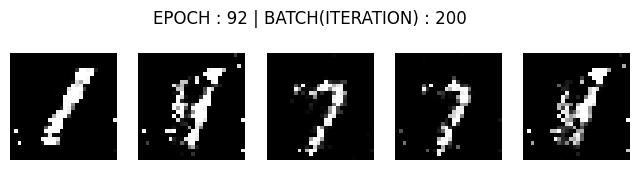

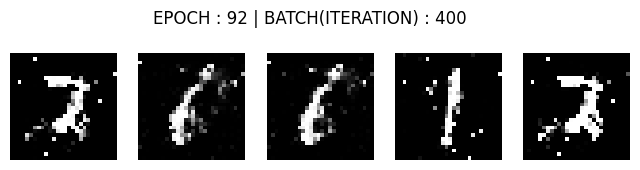

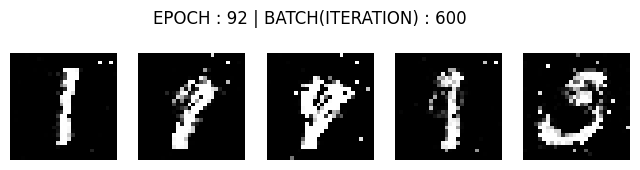

[Epoch: 92/200] [Batch: 657/657] [D loss: 0.071668] [G loss: 4.683090]


  0%|          | 0/657 [00:00<?, ?it/s]

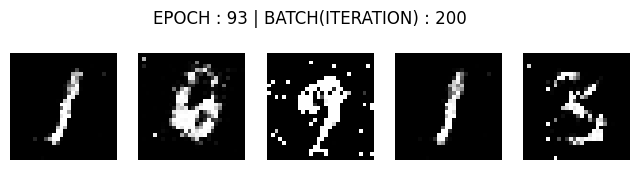

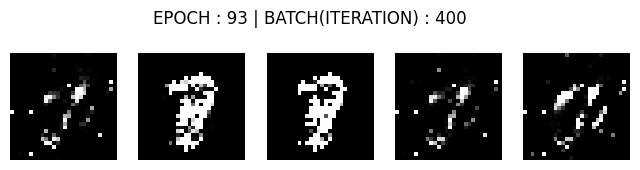

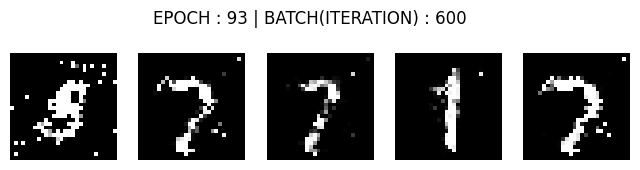

[Epoch: 93/200] [Batch: 657/657] [D loss: 0.055578] [G loss: 2.705379]


  0%|          | 0/657 [00:00<?, ?it/s]

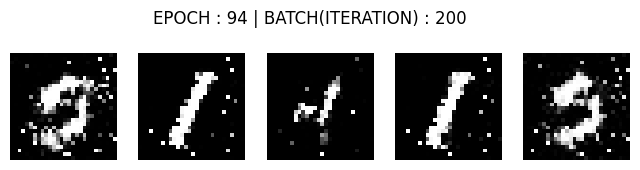

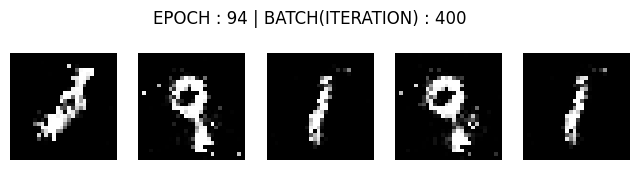

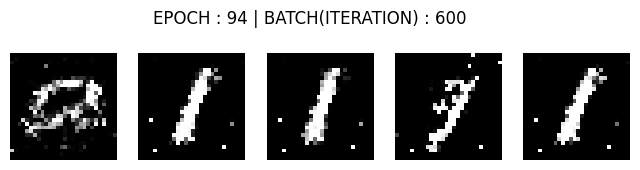

[Epoch: 94/200] [Batch: 657/657] [D loss: 0.293881] [G loss: 2.016761]


  0%|          | 0/657 [00:00<?, ?it/s]

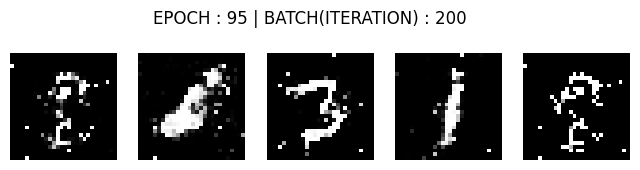

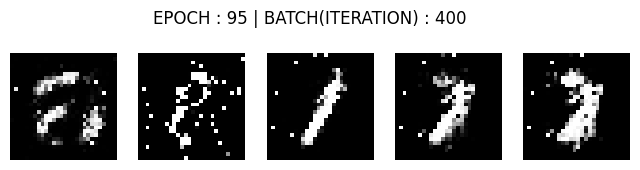

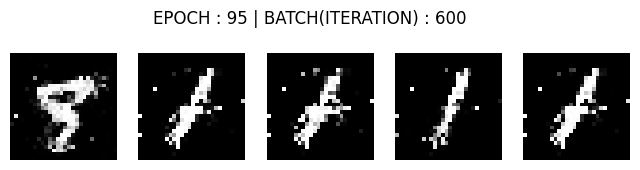

[Epoch: 95/200] [Batch: 657/657] [D loss: 0.228403] [G loss: 3.666122]


  0%|          | 0/657 [00:00<?, ?it/s]

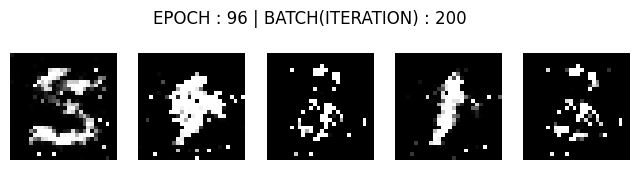

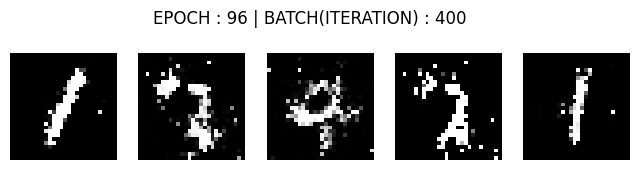

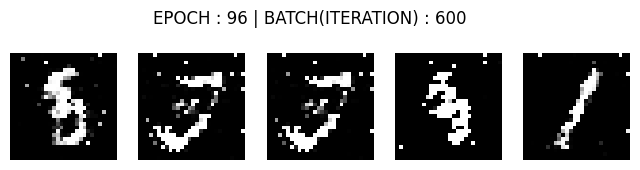

[Epoch: 96/200] [Batch: 657/657] [D loss: 0.122080] [G loss: 2.238149]


  0%|          | 0/657 [00:00<?, ?it/s]

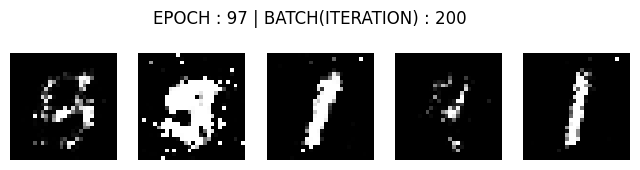

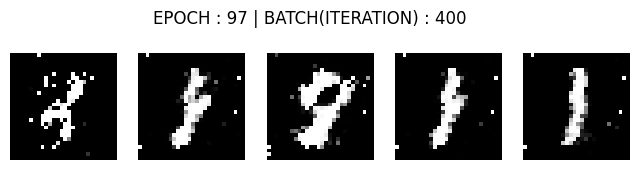

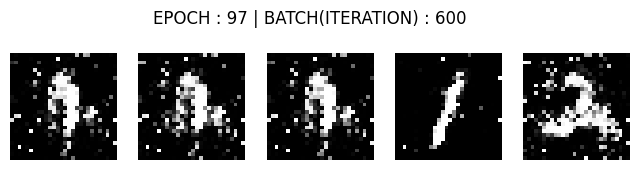

[Epoch: 97/200] [Batch: 657/657] [D loss: 0.016805] [G loss: 4.542474]


  0%|          | 0/657 [00:00<?, ?it/s]

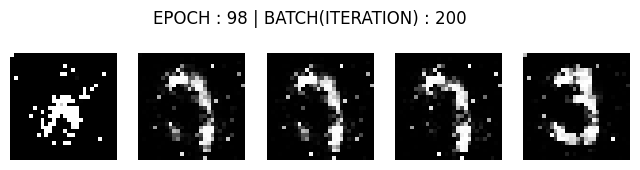

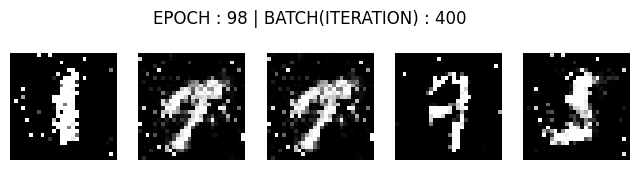

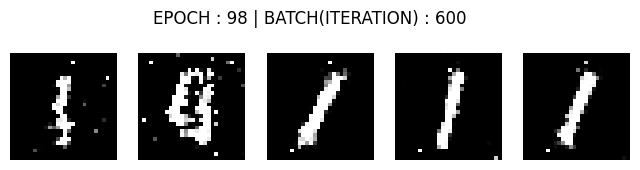

[Epoch: 98/200] [Batch: 657/657] [D loss: 0.143537] [G loss: 2.636078]


  0%|          | 0/657 [00:00<?, ?it/s]

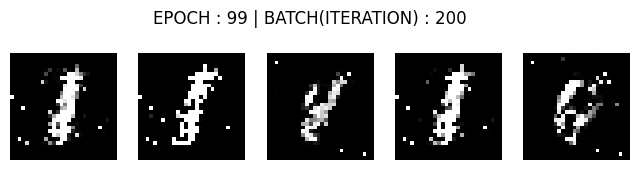

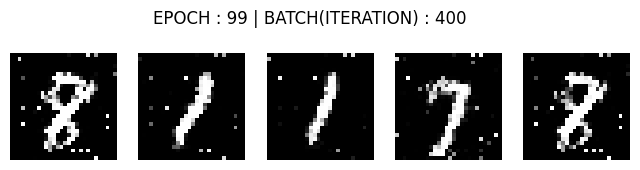

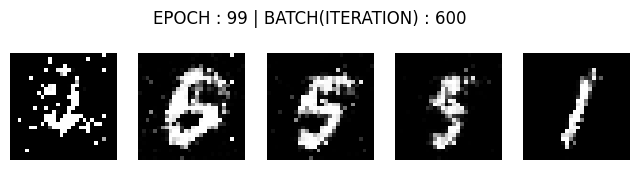

[Epoch: 99/200] [Batch: 657/657] [D loss: 0.213644] [G loss: 2.602157]


  0%|          | 0/657 [00:00<?, ?it/s]

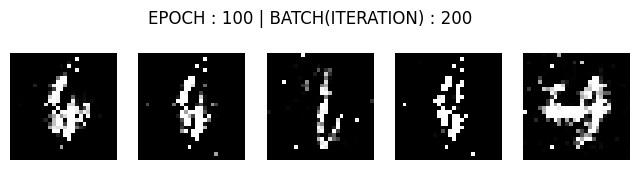

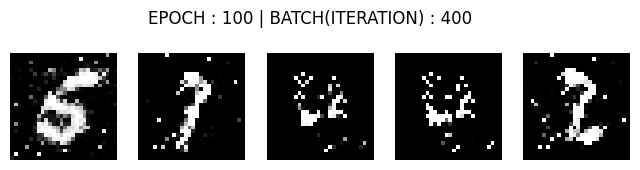

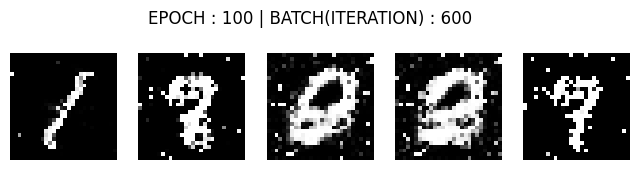

[Epoch: 100/200] [Batch: 657/657] [D loss: 0.060424] [G loss: 3.177124]


  0%|          | 0/657 [00:00<?, ?it/s]

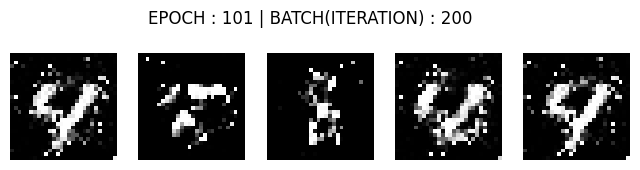

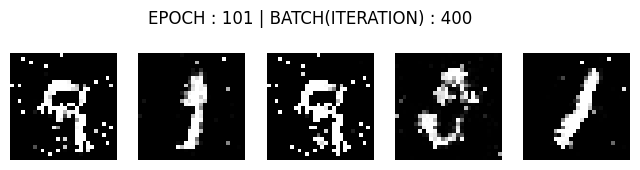

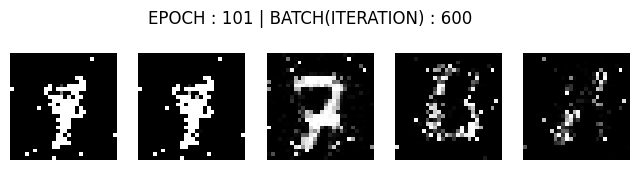

[Epoch: 101/200] [Batch: 657/657] [D loss: 0.115221] [G loss: 2.957827]


  0%|          | 0/657 [00:00<?, ?it/s]

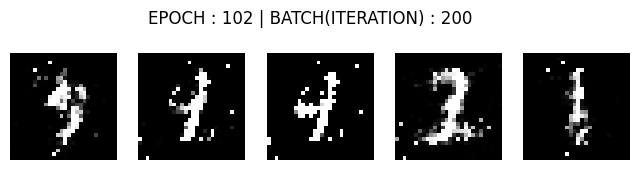

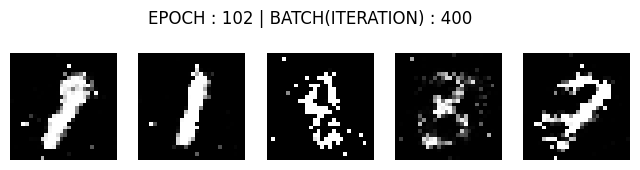

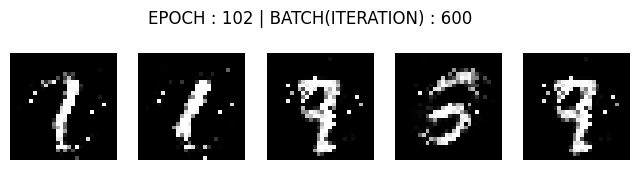

[Epoch: 102/200] [Batch: 657/657] [D loss: 0.224736] [G loss: 4.296373]


  0%|          | 0/657 [00:00<?, ?it/s]

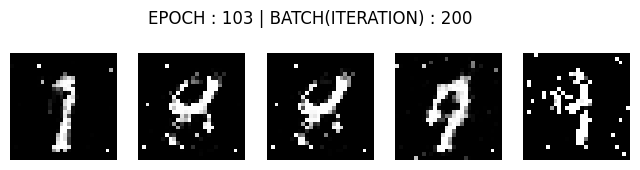

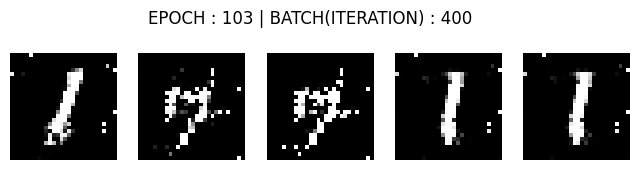

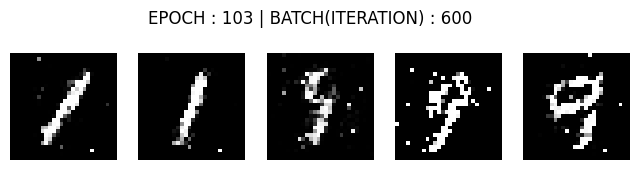

[Epoch: 103/200] [Batch: 657/657] [D loss: 0.139496] [G loss: 1.932015]


  0%|          | 0/657 [00:00<?, ?it/s]

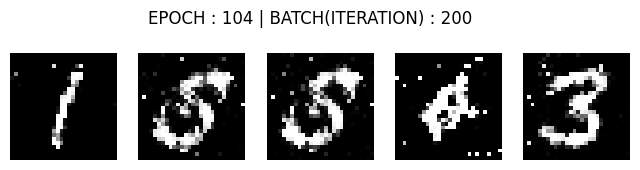

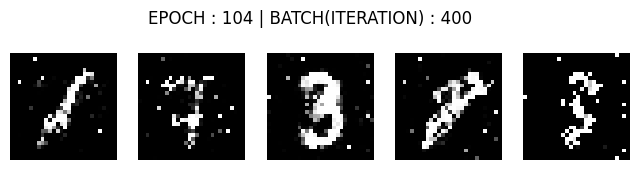

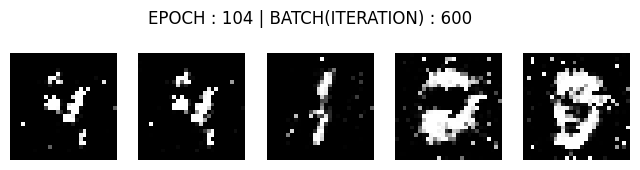

[Epoch: 104/200] [Batch: 657/657] [D loss: 0.045560] [G loss: 6.114877]


  0%|          | 0/657 [00:00<?, ?it/s]

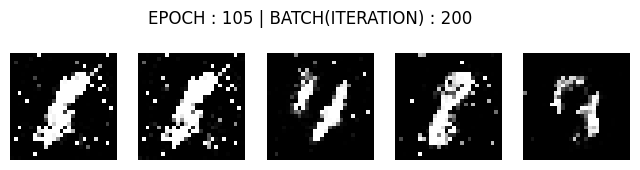

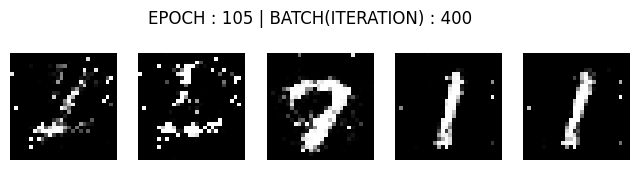

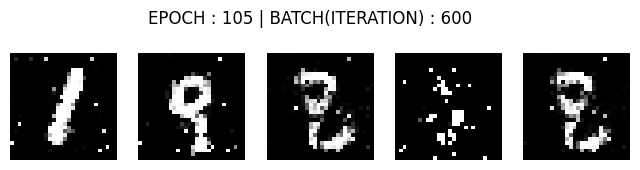

[Epoch: 105/200] [Batch: 657/657] [D loss: 0.508601] [G loss: 5.643747]


  0%|          | 0/657 [00:00<?, ?it/s]

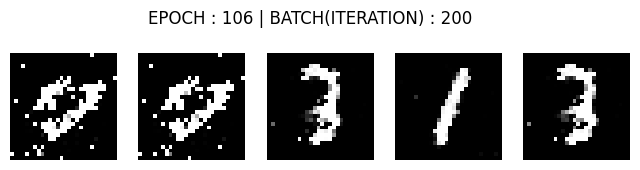

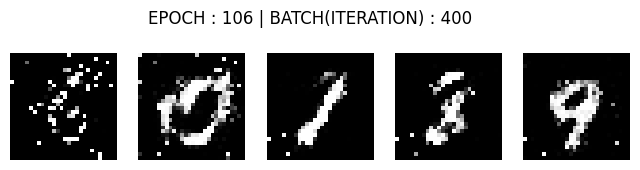

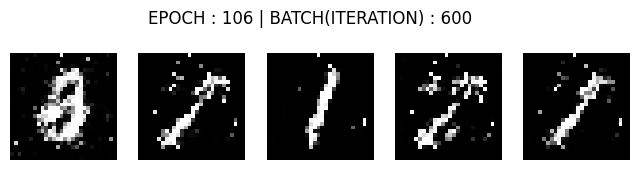

[Epoch: 106/200] [Batch: 657/657] [D loss: 0.023741] [G loss: 5.033346]


  0%|          | 0/657 [00:00<?, ?it/s]

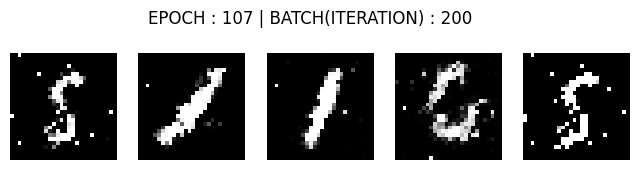

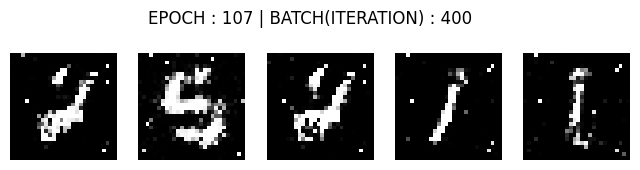

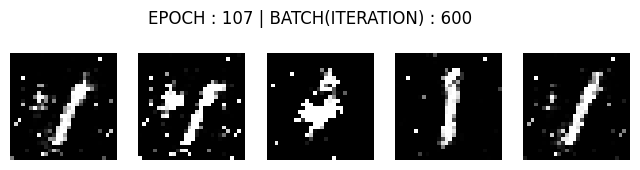

[Epoch: 107/200] [Batch: 657/657] [D loss: 0.295775] [G loss: 4.180664]


  0%|          | 0/657 [00:00<?, ?it/s]

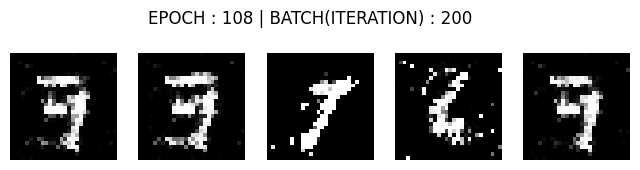

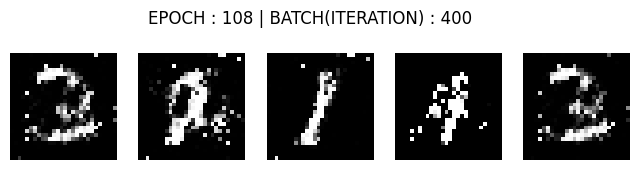

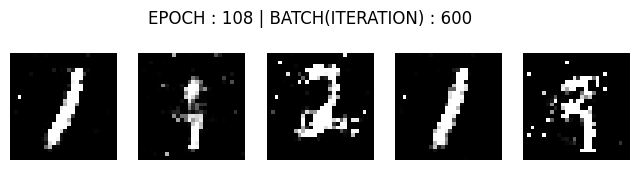

[Epoch: 108/200] [Batch: 657/657] [D loss: 0.249726] [G loss: 2.493390]


  0%|          | 0/657 [00:00<?, ?it/s]

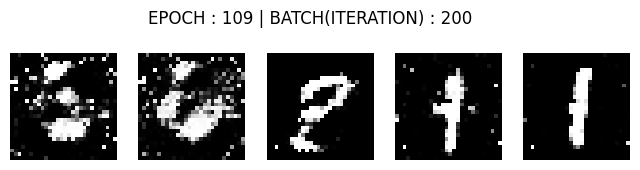

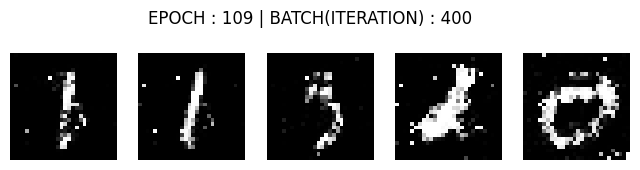

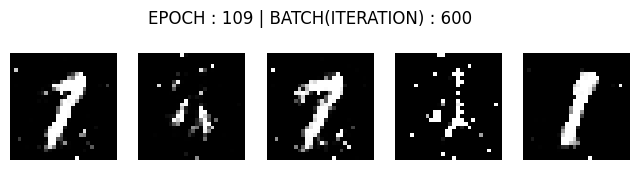

[Epoch: 109/200] [Batch: 657/657] [D loss: 0.248077] [G loss: 1.330397]


  0%|          | 0/657 [00:00<?, ?it/s]

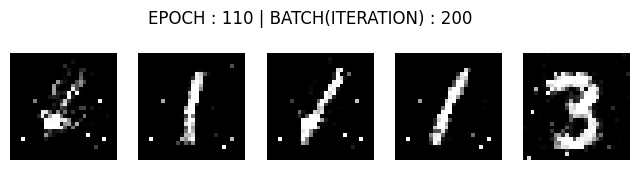

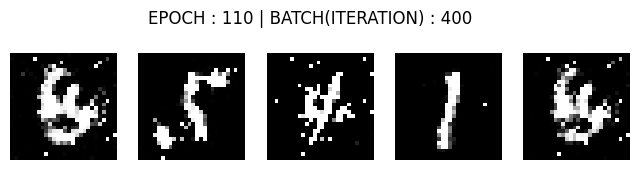

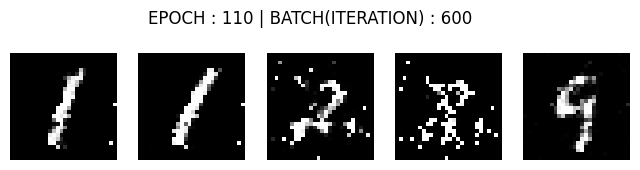

[Epoch: 110/200] [Batch: 657/657] [D loss: 0.173928] [G loss: 4.403410]


  0%|          | 0/657 [00:00<?, ?it/s]

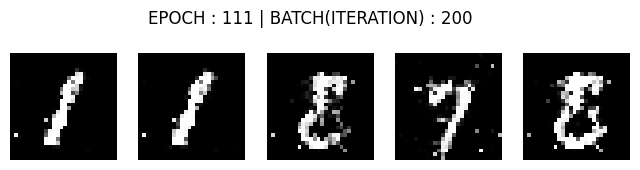

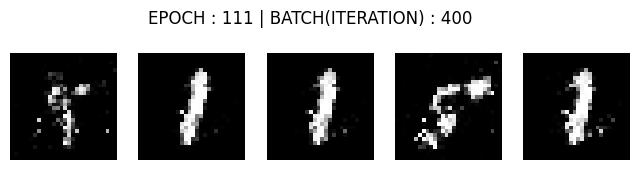

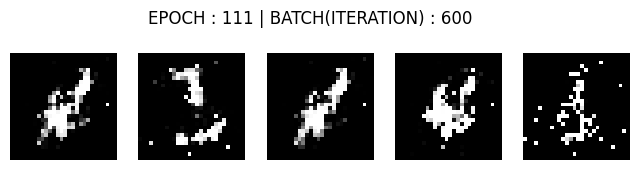

[Epoch: 111/200] [Batch: 657/657] [D loss: 0.076872] [G loss: 2.132823]


  0%|          | 0/657 [00:00<?, ?it/s]

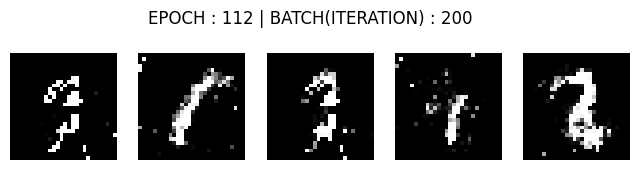

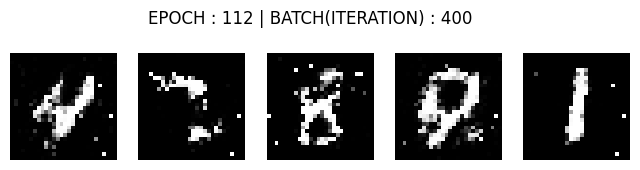

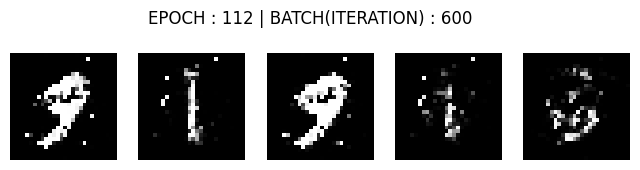

[Epoch: 112/200] [Batch: 657/657] [D loss: 0.071715] [G loss: 3.960653]


  0%|          | 0/657 [00:00<?, ?it/s]

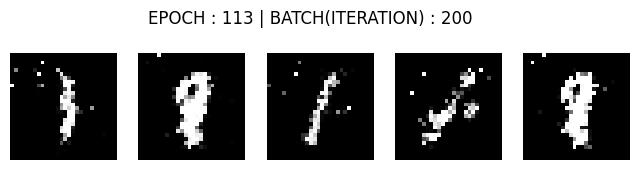

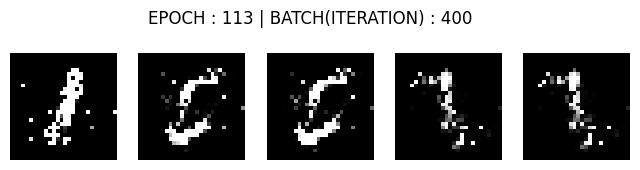

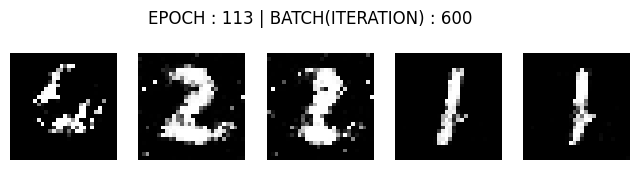

[Epoch: 113/200] [Batch: 657/657] [D loss: 0.110426] [G loss: 2.109754]


  0%|          | 0/657 [00:00<?, ?it/s]

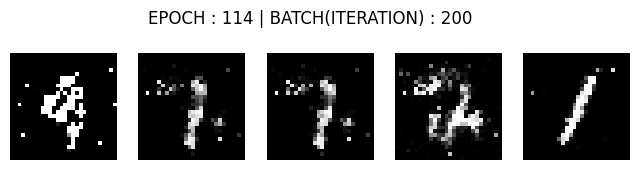

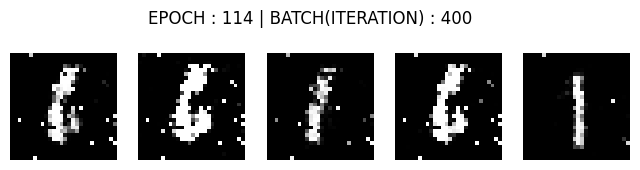

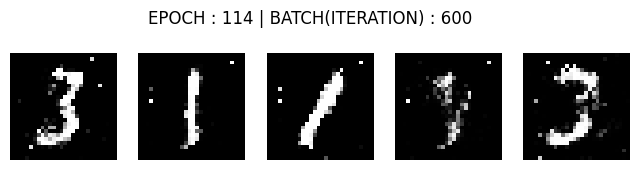

[Epoch: 114/200] [Batch: 657/657] [D loss: 0.221452] [G loss: 1.122918]


  0%|          | 0/657 [00:00<?, ?it/s]

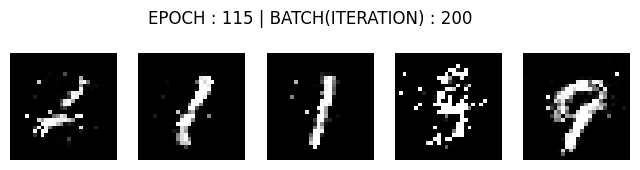

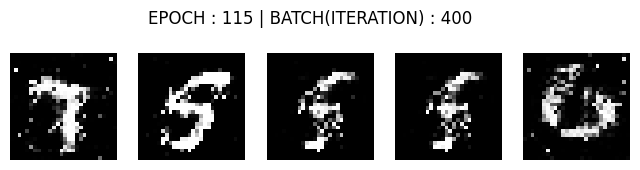

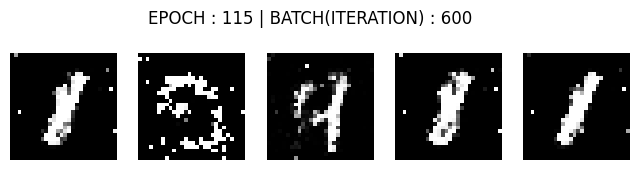

[Epoch: 115/200] [Batch: 657/657] [D loss: 0.170317] [G loss: 2.965934]


  0%|          | 0/657 [00:00<?, ?it/s]

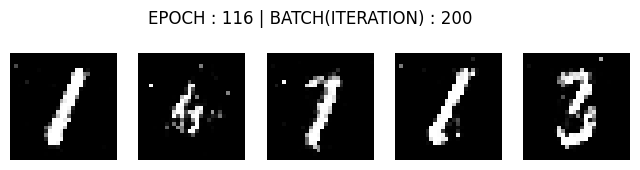

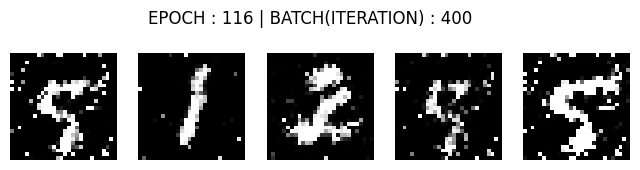

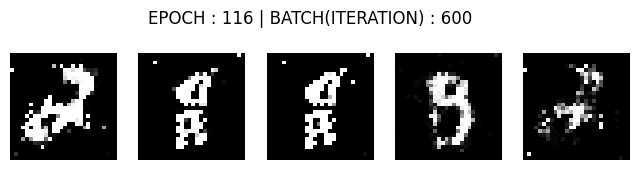

[Epoch: 116/200] [Batch: 657/657] [D loss: 0.060246] [G loss: 4.065400]


  0%|          | 0/657 [00:00<?, ?it/s]

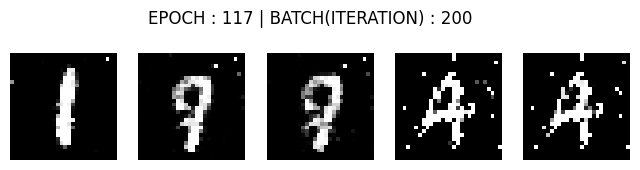

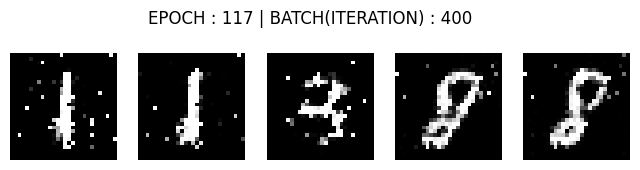

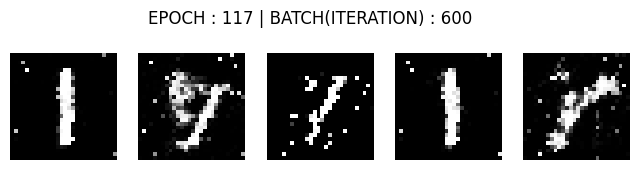

[Epoch: 117/200] [Batch: 657/657] [D loss: 0.417216] [G loss: 2.949649]


  0%|          | 0/657 [00:00<?, ?it/s]

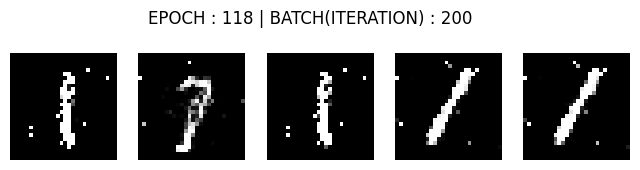

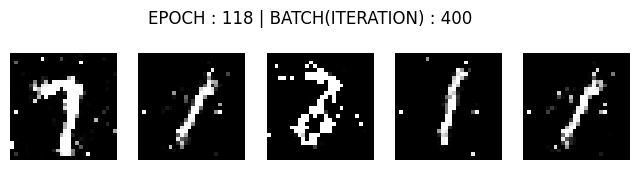

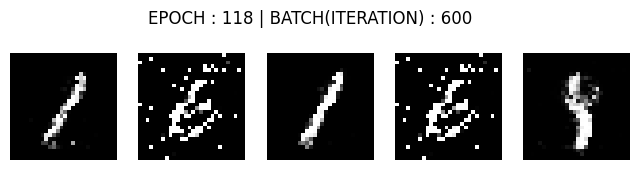

[Epoch: 118/200] [Batch: 657/657] [D loss: 0.068830] [G loss: 3.931255]


  0%|          | 0/657 [00:00<?, ?it/s]

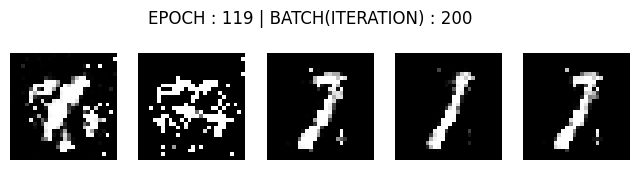

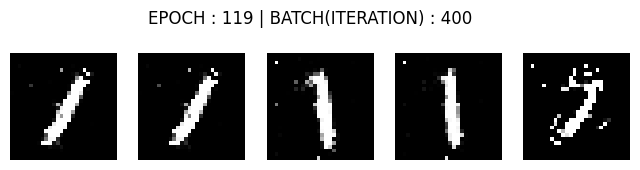

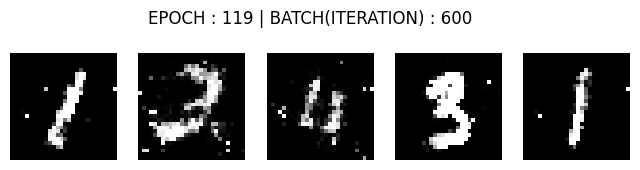

[Epoch: 119/200] [Batch: 657/657] [D loss: 0.102721] [G loss: 3.323835]


  0%|          | 0/657 [00:00<?, ?it/s]

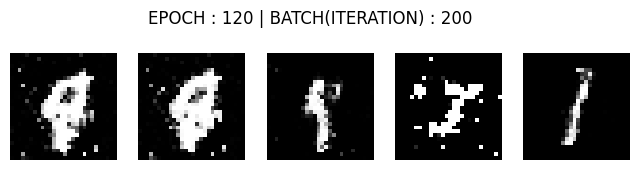

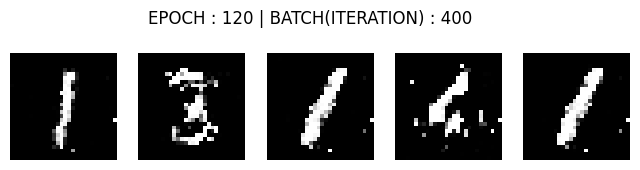

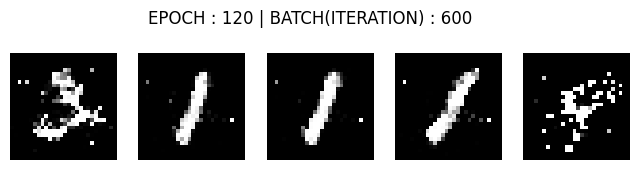

[Epoch: 120/200] [Batch: 657/657] [D loss: 0.165885] [G loss: 2.258525]


  0%|          | 0/657 [00:00<?, ?it/s]

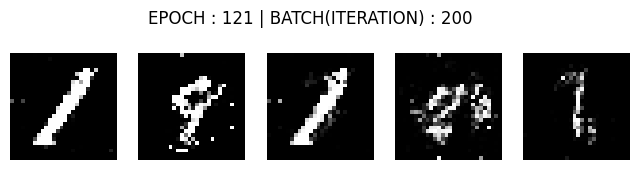

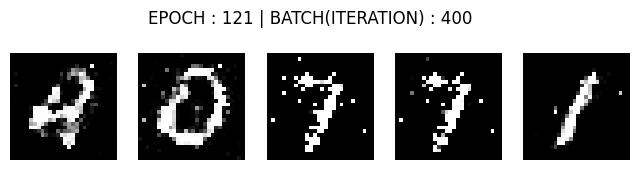

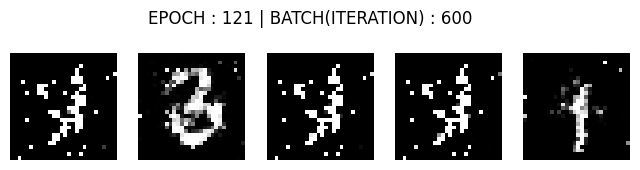

[Epoch: 121/200] [Batch: 657/657] [D loss: 0.416687] [G loss: 4.683523]


  0%|          | 0/657 [00:00<?, ?it/s]

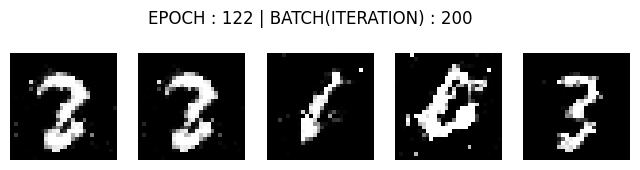

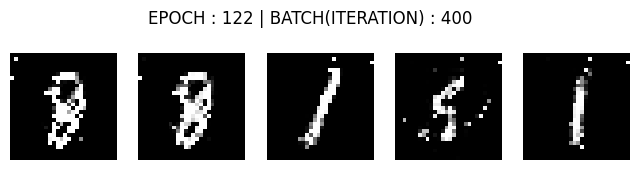

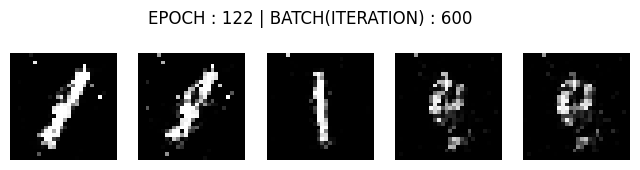

[Epoch: 122/200] [Batch: 657/657] [D loss: 0.108288] [G loss: 2.551880]


  0%|          | 0/657 [00:00<?, ?it/s]

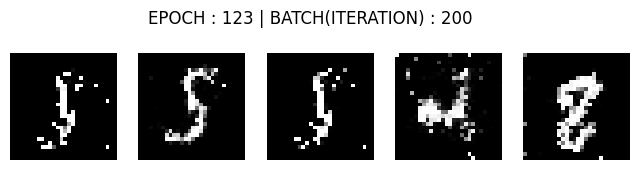

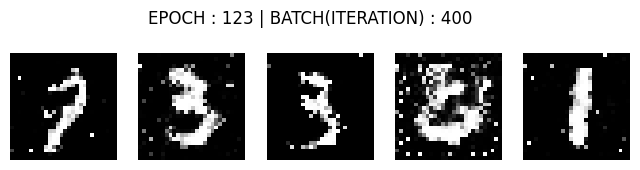

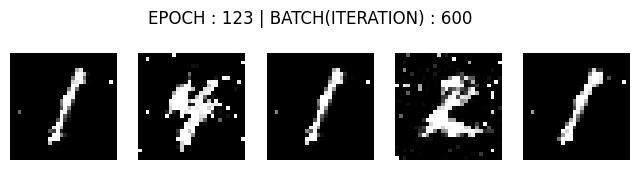

[Epoch: 123/200] [Batch: 657/657] [D loss: 0.068359] [G loss: 2.832734]


  0%|          | 0/657 [00:00<?, ?it/s]

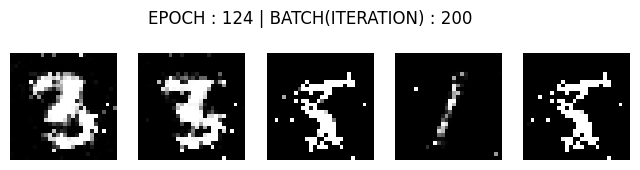

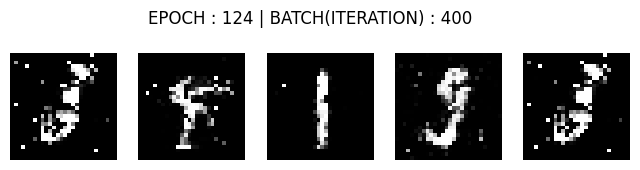

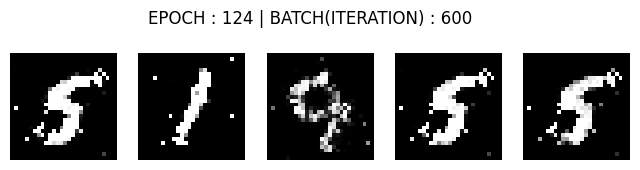

[Epoch: 124/200] [Batch: 657/657] [D loss: 0.155753] [G loss: 2.423594]


  0%|          | 0/657 [00:00<?, ?it/s]

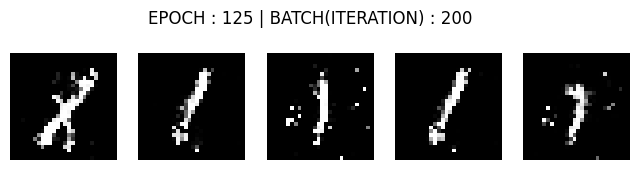

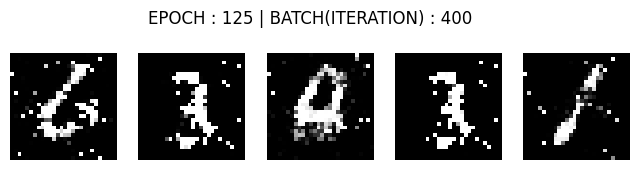

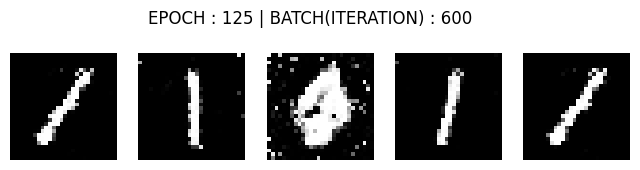

[Epoch: 125/200] [Batch: 657/657] [D loss: 0.163602] [G loss: 4.272732]


  0%|          | 0/657 [00:00<?, ?it/s]

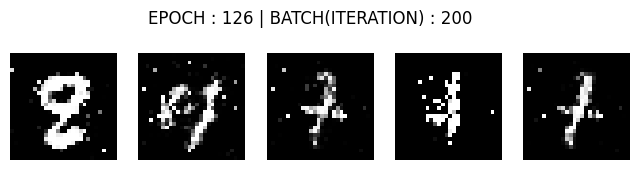

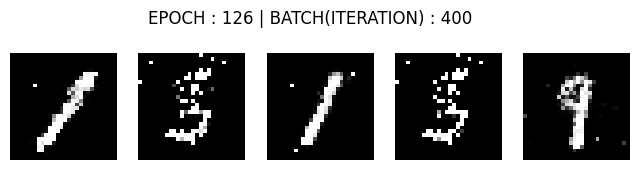

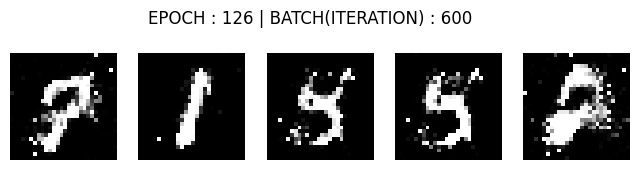

[Epoch: 126/200] [Batch: 657/657] [D loss: 0.179479] [G loss: 2.620741]


  0%|          | 0/657 [00:00<?, ?it/s]

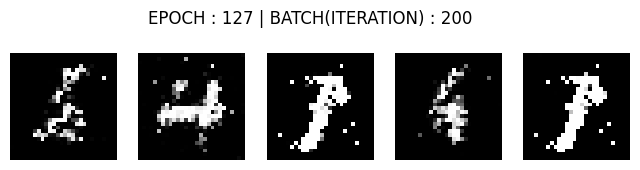

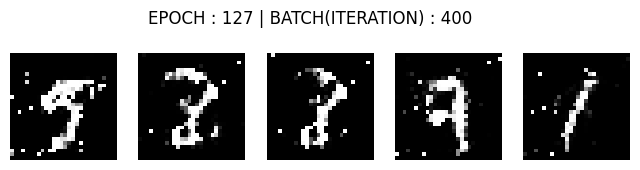

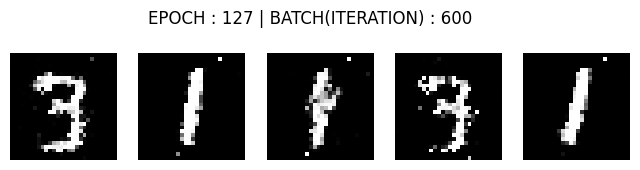

[Epoch: 127/200] [Batch: 657/657] [D loss: 0.116357] [G loss: 2.479892]


  0%|          | 0/657 [00:00<?, ?it/s]

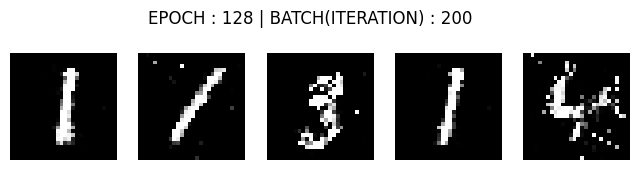

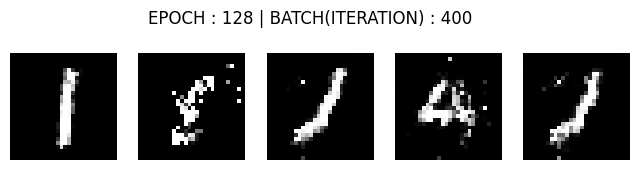

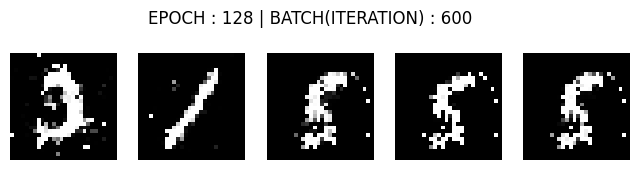

[Epoch: 128/200] [Batch: 657/657] [D loss: 0.187404] [G loss: 2.991363]


  0%|          | 0/657 [00:00<?, ?it/s]

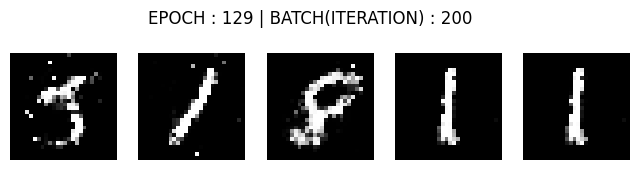

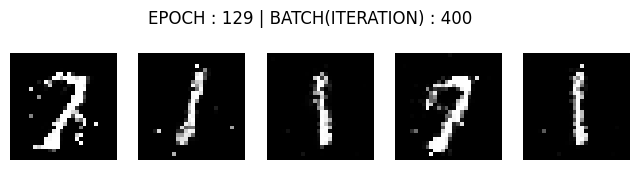

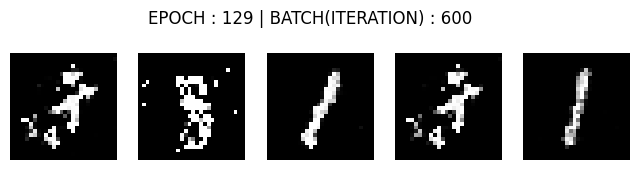

[Epoch: 129/200] [Batch: 657/657] [D loss: 0.222411] [G loss: 2.641166]


  0%|          | 0/657 [00:00<?, ?it/s]

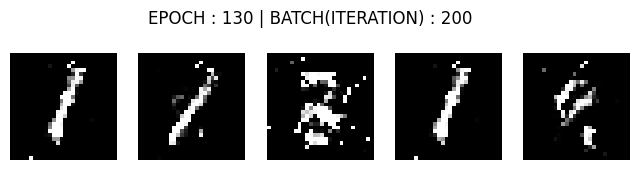

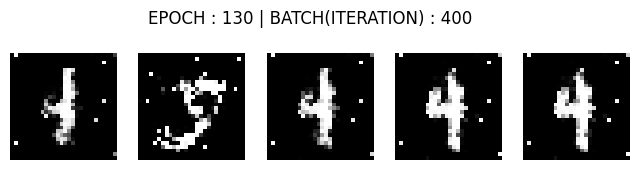

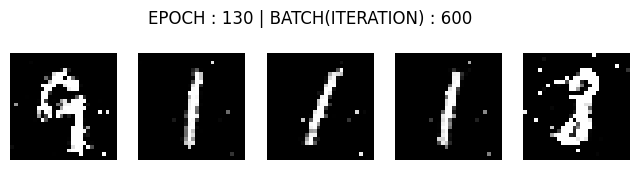

[Epoch: 130/200] [Batch: 657/657] [D loss: 0.105466] [G loss: 2.486185]


  0%|          | 0/657 [00:00<?, ?it/s]

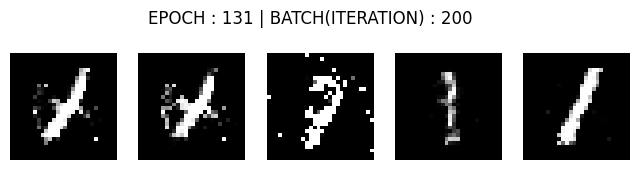

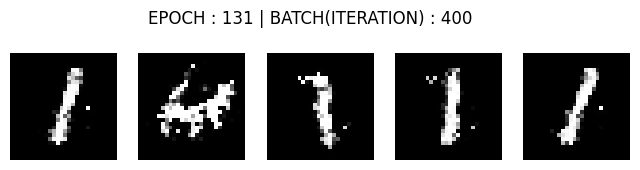

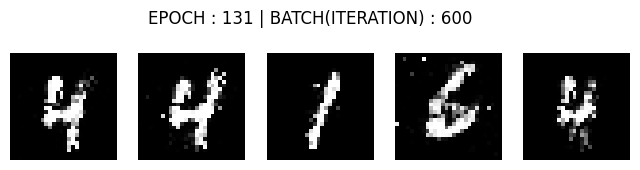

[Epoch: 131/200] [Batch: 657/657] [D loss: 0.141414] [G loss: 2.460904]


  0%|          | 0/657 [00:00<?, ?it/s]

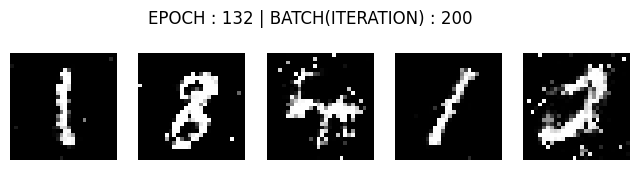

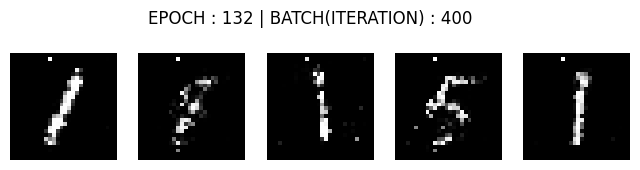

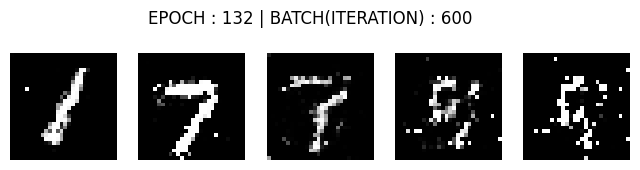

[Epoch: 132/200] [Batch: 657/657] [D loss: 0.171544] [G loss: 1.740292]


  0%|          | 0/657 [00:00<?, ?it/s]

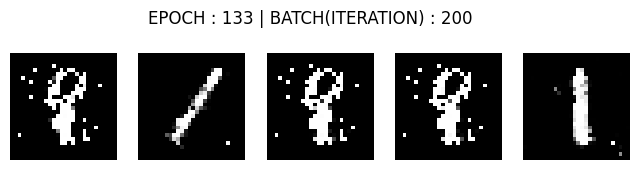

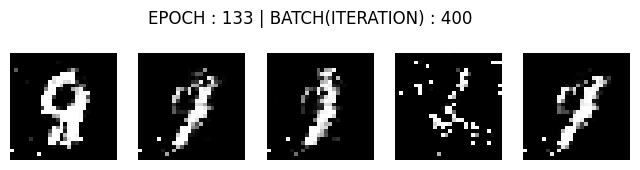

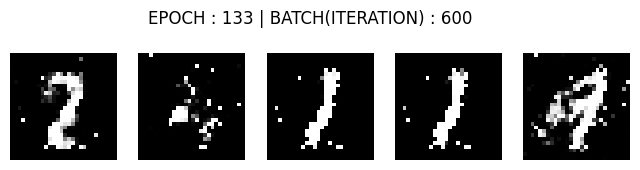

[Epoch: 133/200] [Batch: 657/657] [D loss: 0.058894] [G loss: 2.607430]


  0%|          | 0/657 [00:00<?, ?it/s]

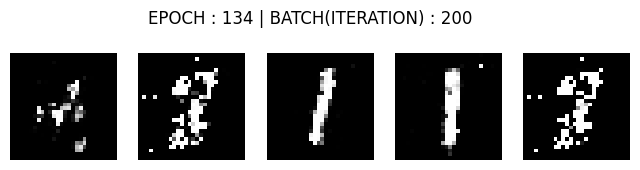

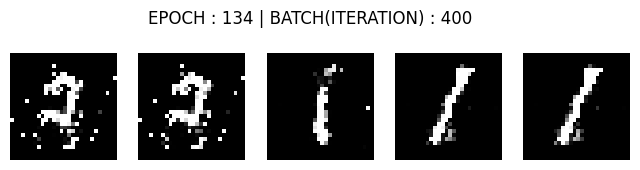

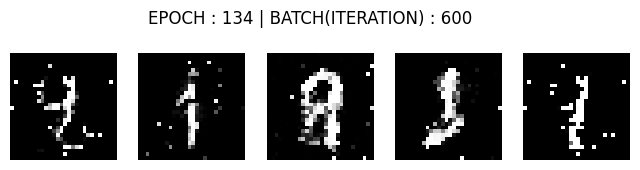

[Epoch: 134/200] [Batch: 657/657] [D loss: 0.088821] [G loss: 4.510022]


  0%|          | 0/657 [00:00<?, ?it/s]

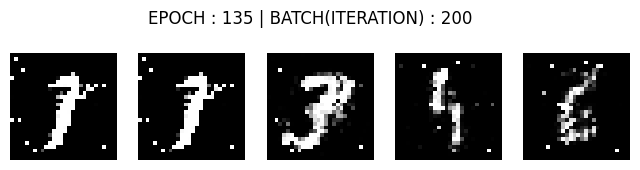

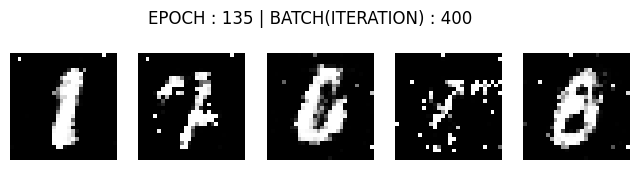

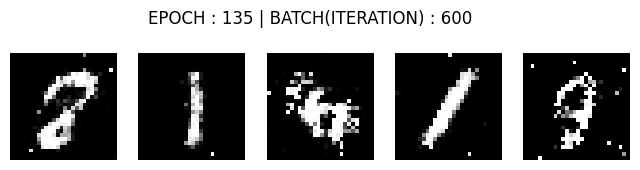

[Epoch: 135/200] [Batch: 657/657] [D loss: 0.191749] [G loss: 2.802150]


  0%|          | 0/657 [00:00<?, ?it/s]

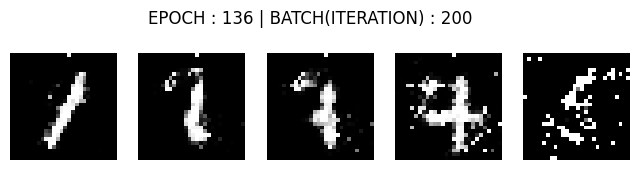

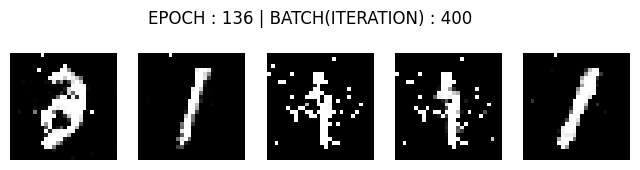

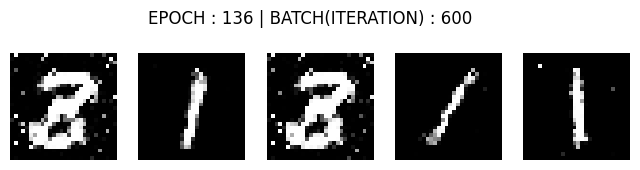

[Epoch: 136/200] [Batch: 657/657] [D loss: 0.249585] [G loss: 3.486235]


  0%|          | 0/657 [00:00<?, ?it/s]

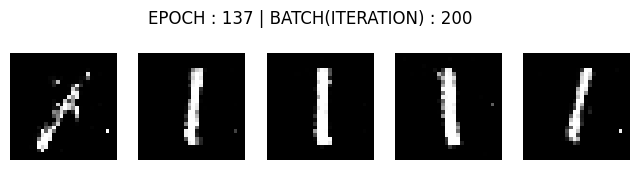

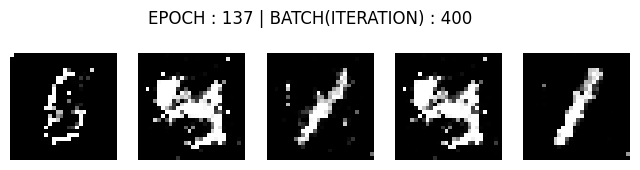

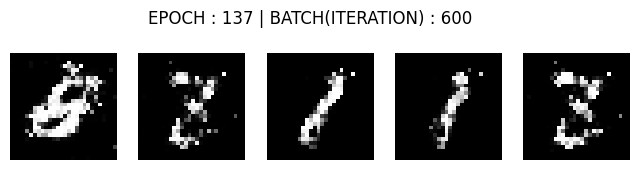

[Epoch: 137/200] [Batch: 657/657] [D loss: 0.171466] [G loss: 2.660062]


  0%|          | 0/657 [00:00<?, ?it/s]

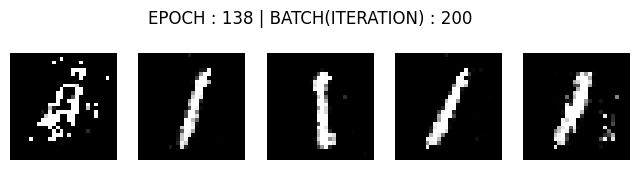

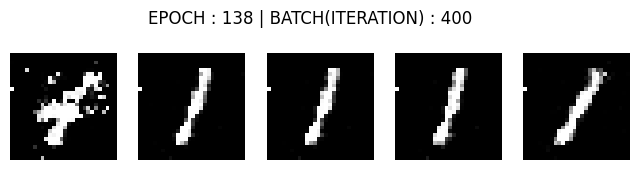

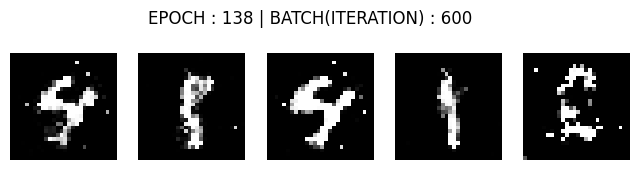

[Epoch: 138/200] [Batch: 657/657] [D loss: 0.068526] [G loss: 3.041510]


  0%|          | 0/657 [00:00<?, ?it/s]

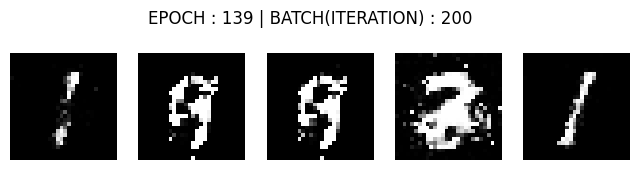

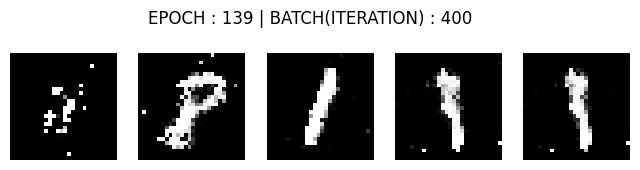

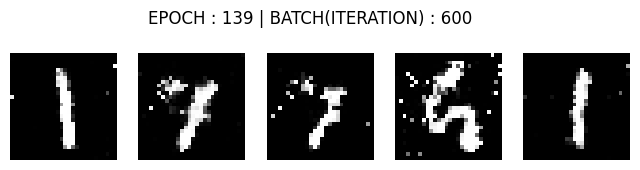

[Epoch: 139/200] [Batch: 657/657] [D loss: 0.228348] [G loss: 2.614168]


  0%|          | 0/657 [00:00<?, ?it/s]

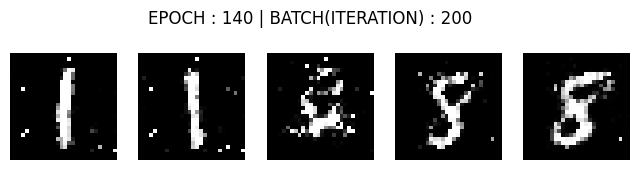

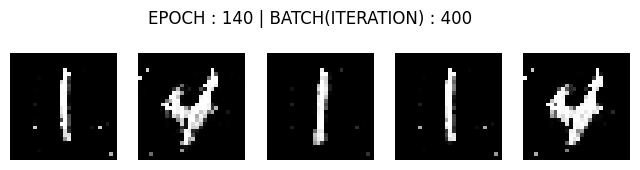

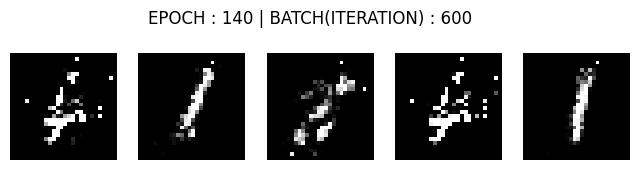

[Epoch: 140/200] [Batch: 657/657] [D loss: 0.219105] [G loss: 1.863699]


  0%|          | 0/657 [00:00<?, ?it/s]

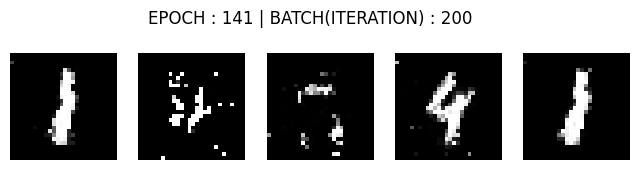

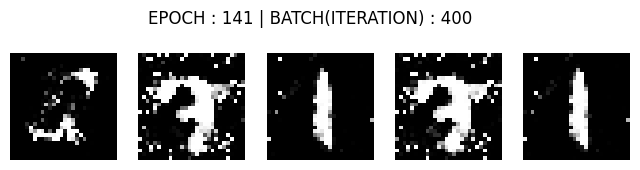

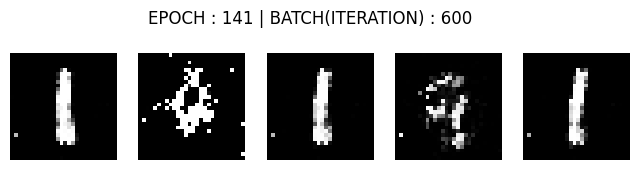

[Epoch: 141/200] [Batch: 657/657] [D loss: 0.069890] [G loss: 3.397673]


  0%|          | 0/657 [00:00<?, ?it/s]

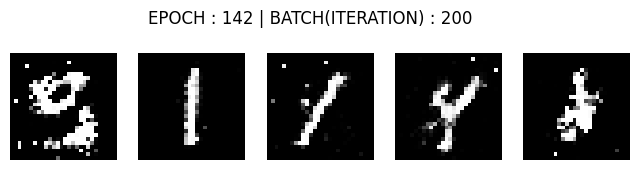

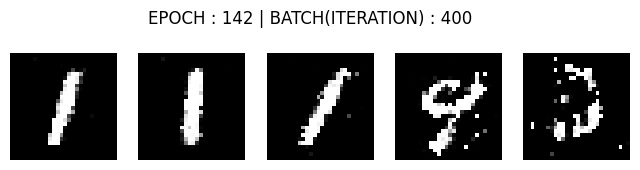

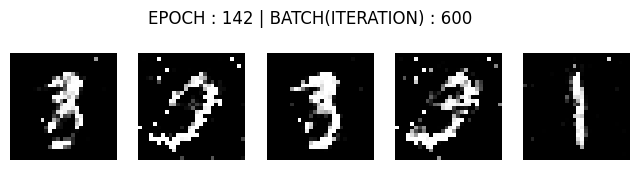

[Epoch: 142/200] [Batch: 657/657] [D loss: 0.032610] [G loss: 4.009448]


  0%|          | 0/657 [00:00<?, ?it/s]

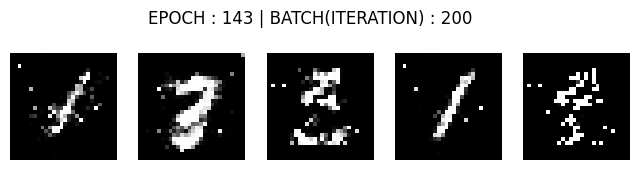

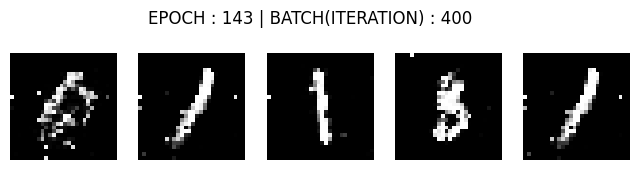

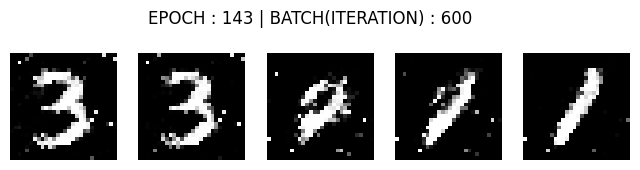

[Epoch: 143/200] [Batch: 657/657] [D loss: 0.119428] [G loss: 2.821719]


  0%|          | 0/657 [00:00<?, ?it/s]

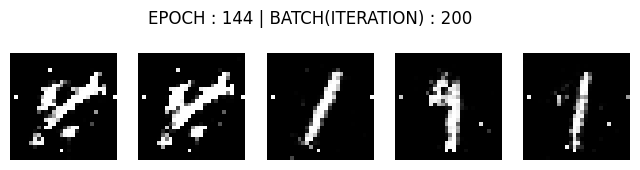

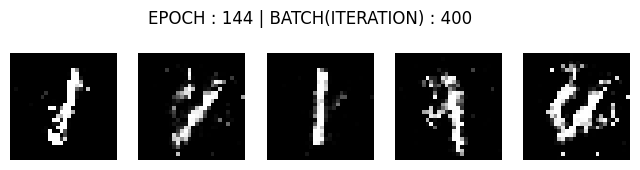

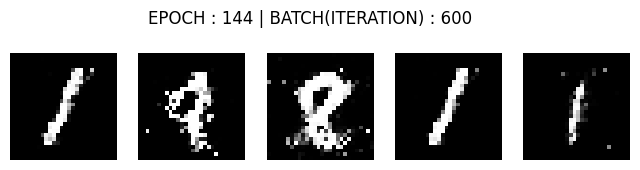

[Epoch: 144/200] [Batch: 657/657] [D loss: 0.373791] [G loss: 1.341709]


  0%|          | 0/657 [00:00<?, ?it/s]

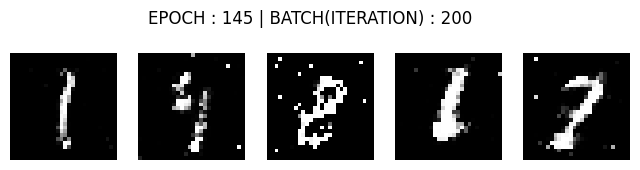

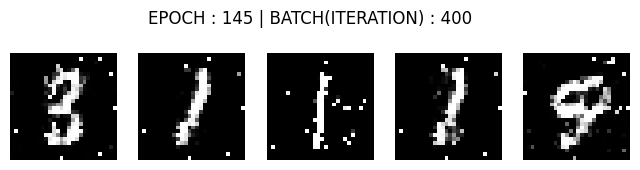

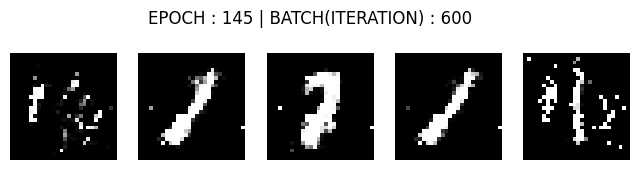

[Epoch: 145/200] [Batch: 657/657] [D loss: 0.246768] [G loss: 2.706406]


  0%|          | 0/657 [00:00<?, ?it/s]

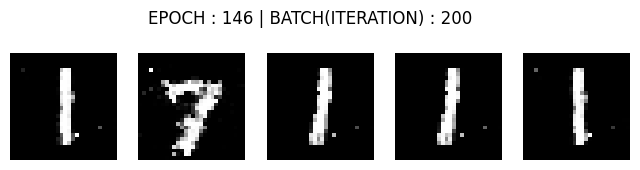

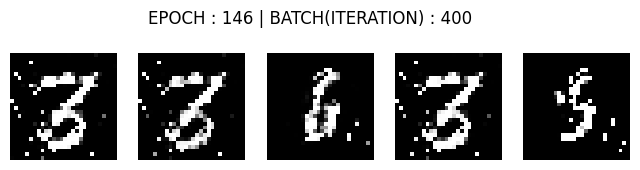

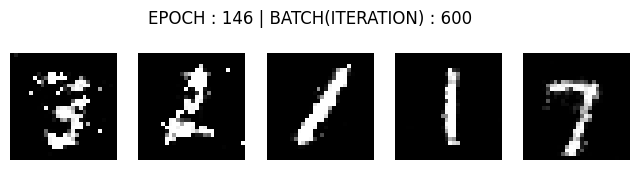

[Epoch: 146/200] [Batch: 657/657] [D loss: 0.096940] [G loss: 3.899129]


  0%|          | 0/657 [00:00<?, ?it/s]

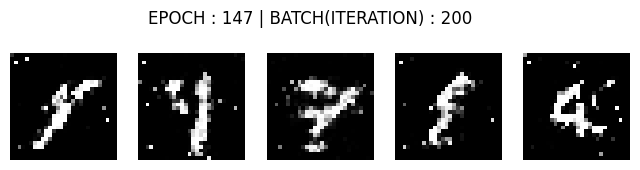

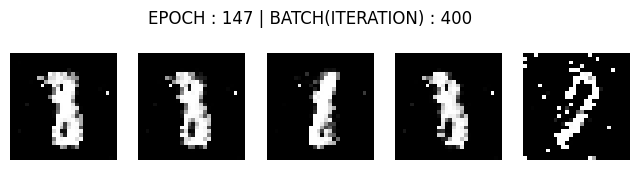

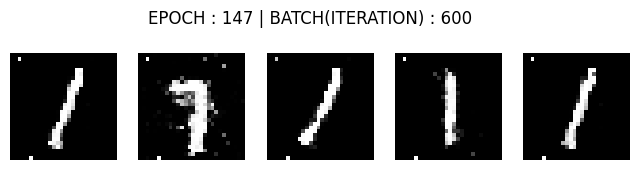

[Epoch: 147/200] [Batch: 657/657] [D loss: 0.079481] [G loss: 2.892379]


  0%|          | 0/657 [00:00<?, ?it/s]

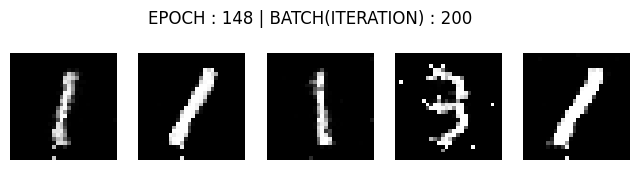

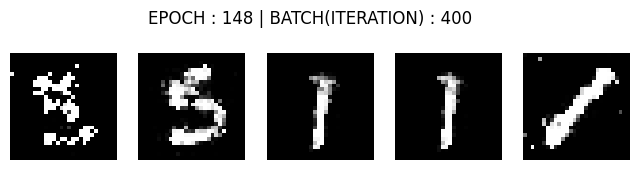

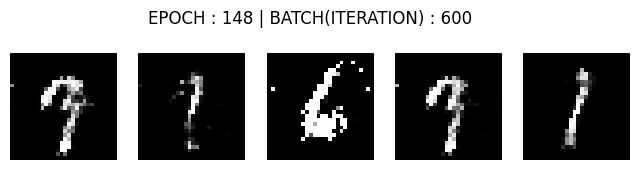

[Epoch: 148/200] [Batch: 657/657] [D loss: 0.167755] [G loss: 1.825499]


  0%|          | 0/657 [00:00<?, ?it/s]

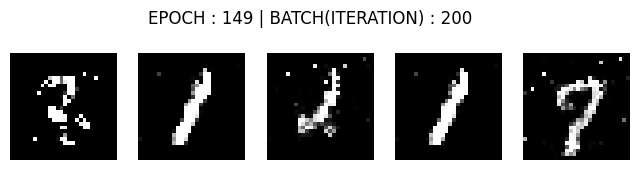

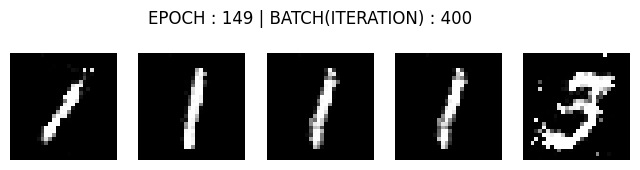

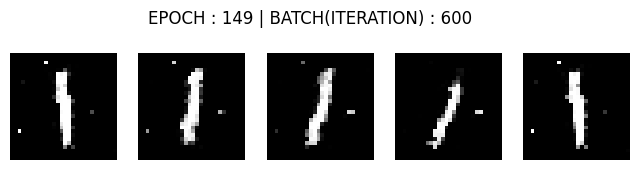

[Epoch: 149/200] [Batch: 657/657] [D loss: 0.281403] [G loss: 2.681542]


  0%|          | 0/657 [00:00<?, ?it/s]

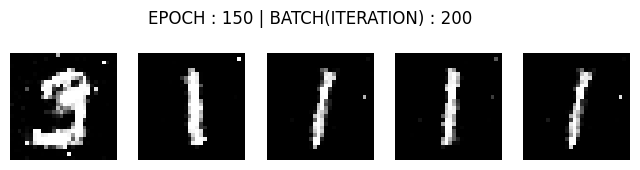

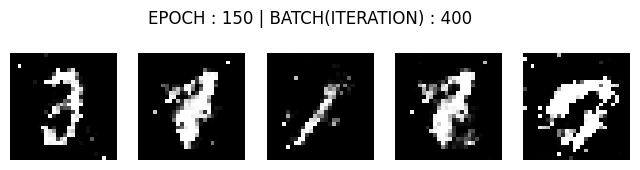

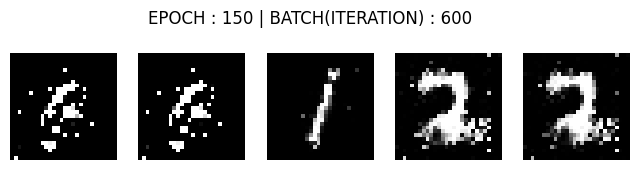

[Epoch: 150/200] [Batch: 657/657] [D loss: 0.136125] [G loss: 3.232926]


  0%|          | 0/657 [00:00<?, ?it/s]

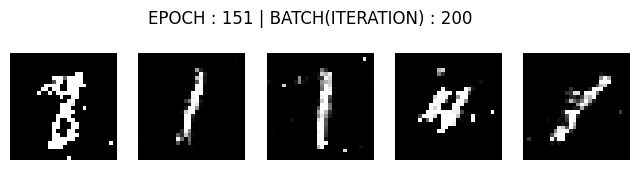

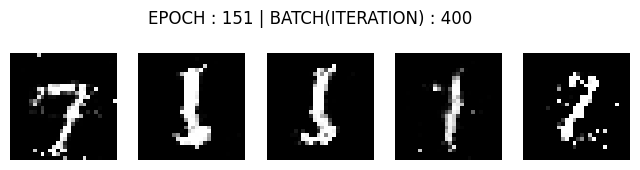

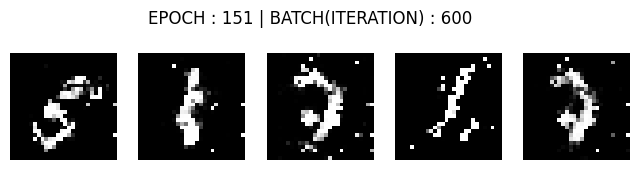

[Epoch: 151/200] [Batch: 657/657] [D loss: 0.118306] [G loss: 3.496575]


  0%|          | 0/657 [00:00<?, ?it/s]

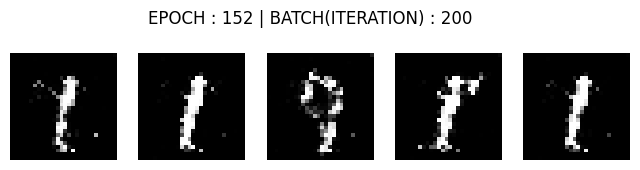

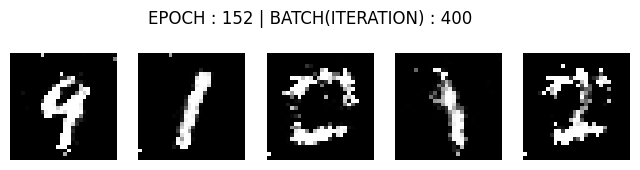

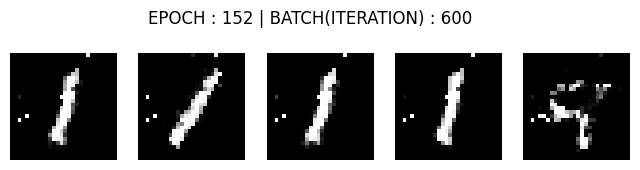

[Epoch: 152/200] [Batch: 657/657] [D loss: 0.175419] [G loss: 3.373789]


  0%|          | 0/657 [00:00<?, ?it/s]

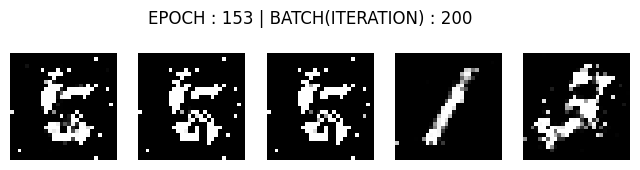

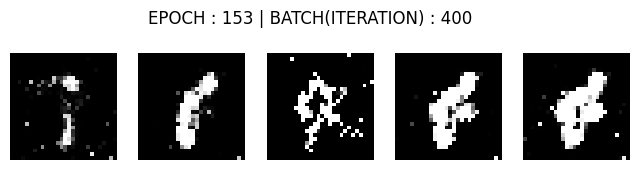

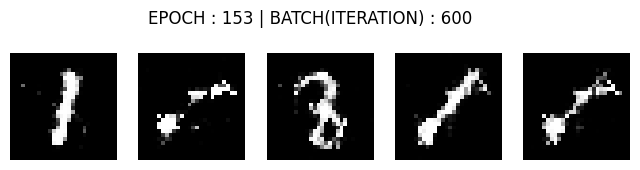

[Epoch: 153/200] [Batch: 657/657] [D loss: 0.129332] [G loss: 3.201638]


  0%|          | 0/657 [00:00<?, ?it/s]

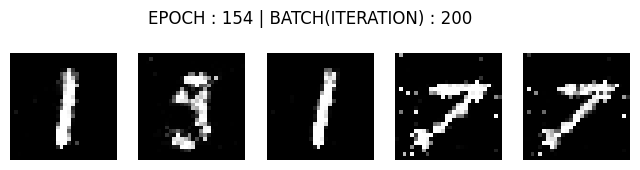

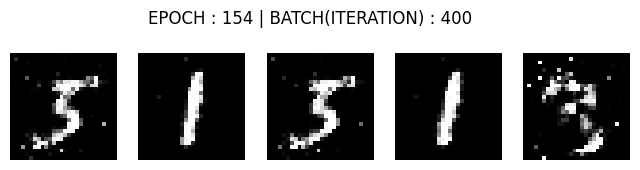

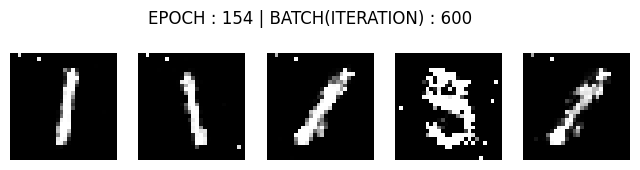

[Epoch: 154/200] [Batch: 657/657] [D loss: 0.042401] [G loss: 3.416486]


  0%|          | 0/657 [00:00<?, ?it/s]

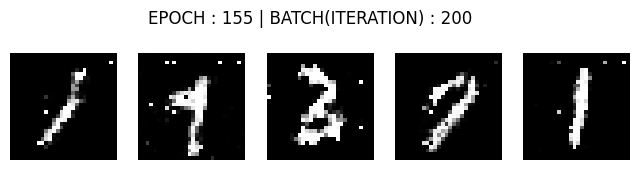

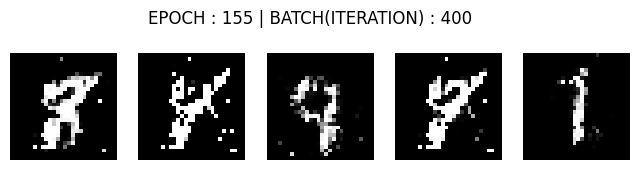

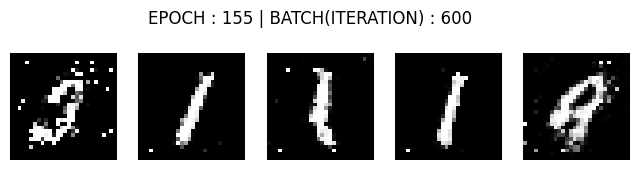

[Epoch: 155/200] [Batch: 657/657] [D loss: 0.084501] [G loss: 2.145742]


  0%|          | 0/657 [00:00<?, ?it/s]

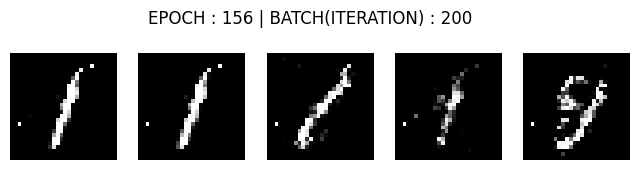

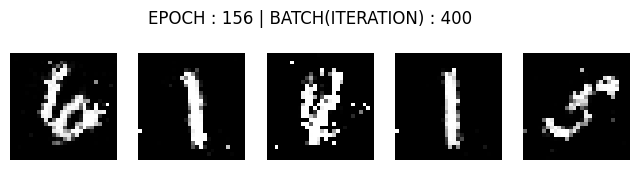

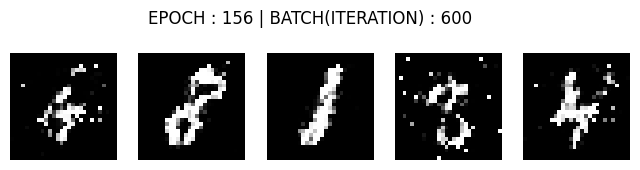

[Epoch: 156/200] [Batch: 657/657] [D loss: 0.364054] [G loss: 3.658742]


  0%|          | 0/657 [00:00<?, ?it/s]

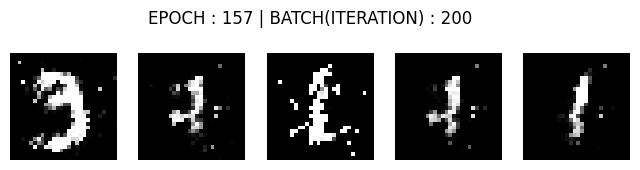

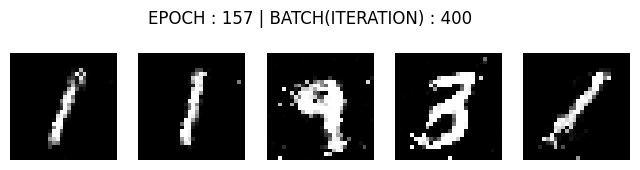

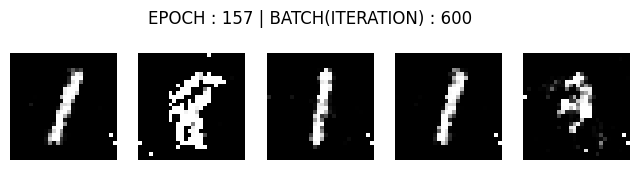

[Epoch: 157/200] [Batch: 657/657] [D loss: 0.426190] [G loss: 6.066316]


  0%|          | 0/657 [00:00<?, ?it/s]

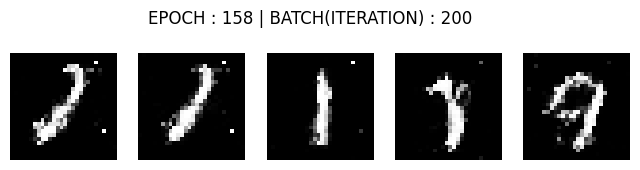

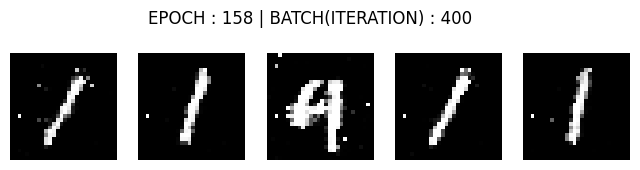

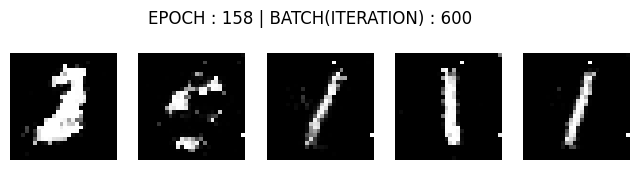

[Epoch: 158/200] [Batch: 657/657] [D loss: 0.070935] [G loss: 2.770126]


  0%|          | 0/657 [00:00<?, ?it/s]

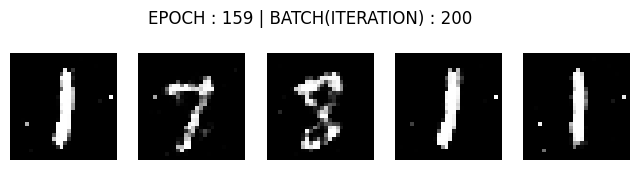

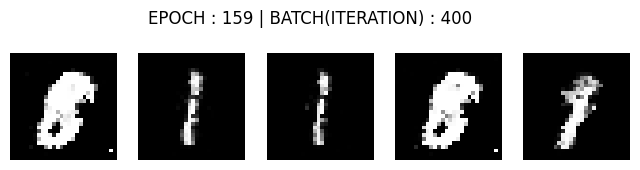

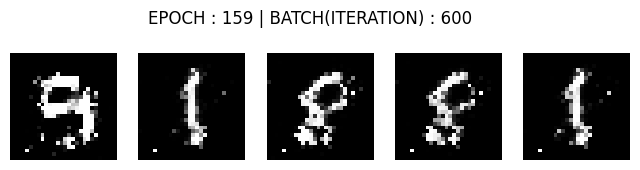

[Epoch: 159/200] [Batch: 657/657] [D loss: 0.334345] [G loss: 2.461680]


  0%|          | 0/657 [00:00<?, ?it/s]

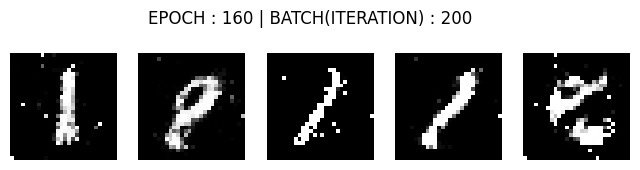

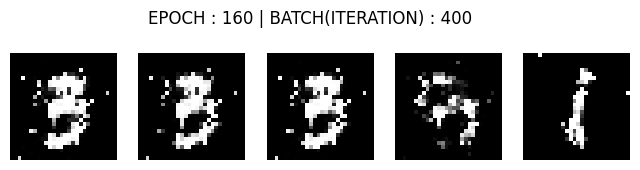

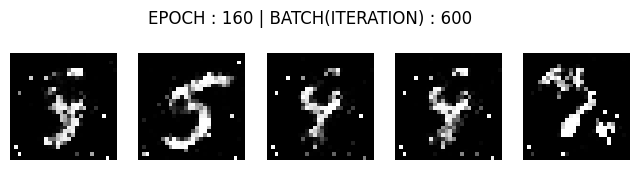

[Epoch: 160/200] [Batch: 657/657] [D loss: 0.272740] [G loss: 2.747655]


  0%|          | 0/657 [00:00<?, ?it/s]

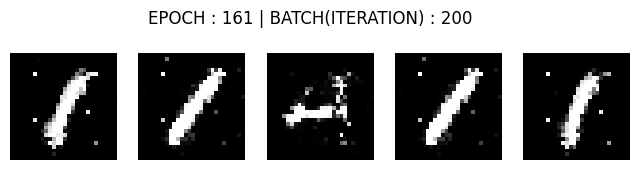

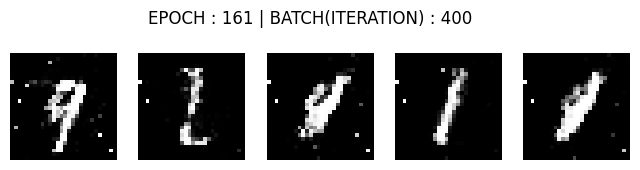

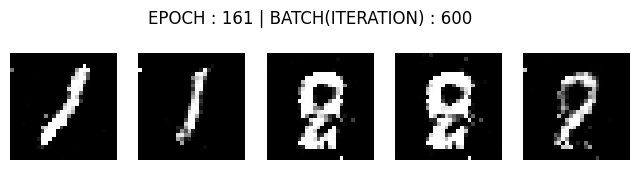

[Epoch: 161/200] [Batch: 657/657] [D loss: 0.123588] [G loss: 3.368560]


  0%|          | 0/657 [00:00<?, ?it/s]

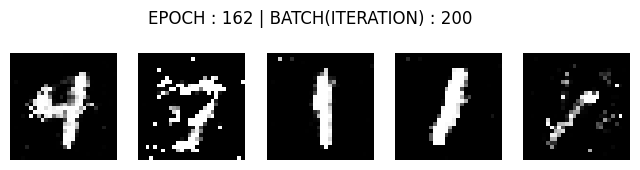

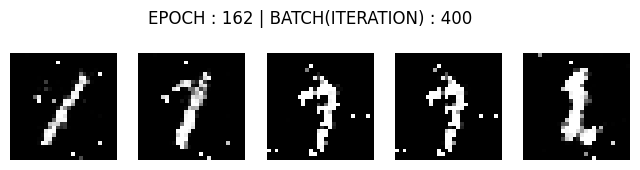

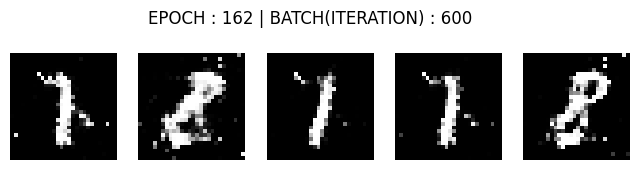

[Epoch: 162/200] [Batch: 657/657] [D loss: 0.535897] [G loss: 5.174267]


  0%|          | 0/657 [00:00<?, ?it/s]

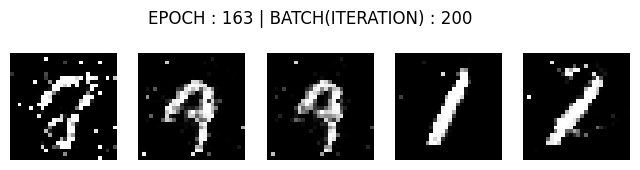

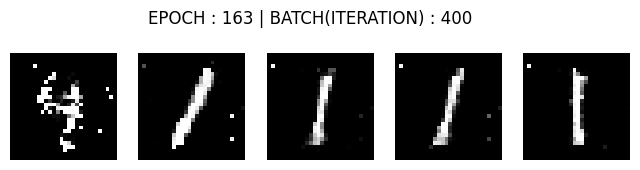

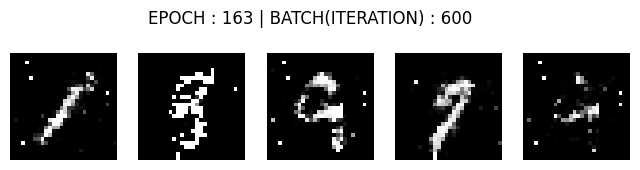

[Epoch: 163/200] [Batch: 657/657] [D loss: 0.211784] [G loss: 2.158199]


  0%|          | 0/657 [00:00<?, ?it/s]

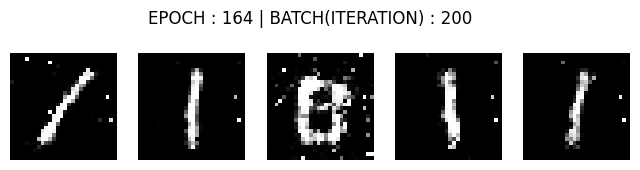

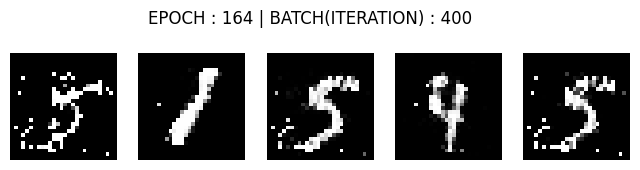

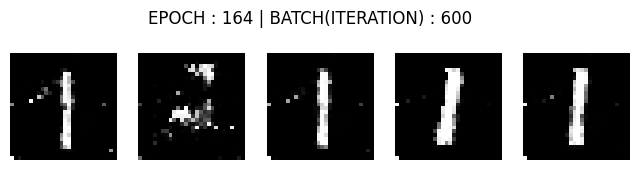

[Epoch: 164/200] [Batch: 657/657] [D loss: 0.031389] [G loss: 2.942660]


  0%|          | 0/657 [00:00<?, ?it/s]

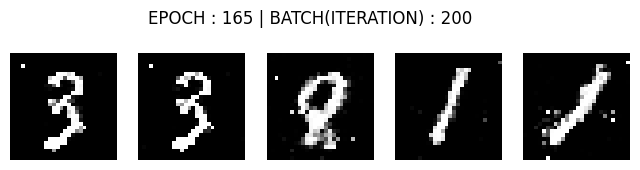

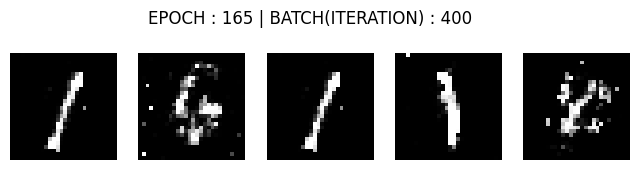

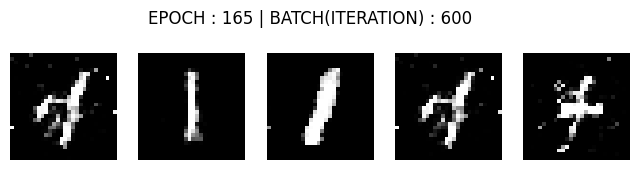

[Epoch: 165/200] [Batch: 657/657] [D loss: 0.140076] [G loss: 5.315747]


  0%|          | 0/657 [00:00<?, ?it/s]

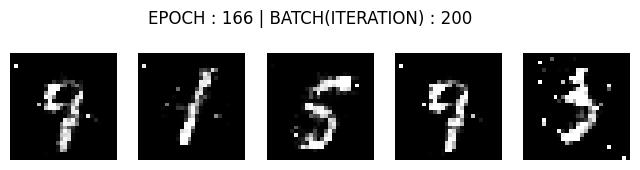

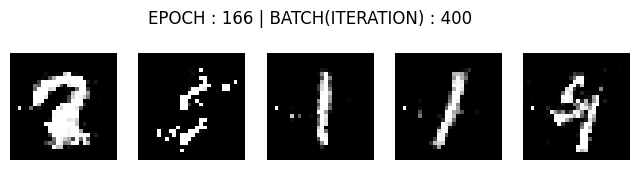

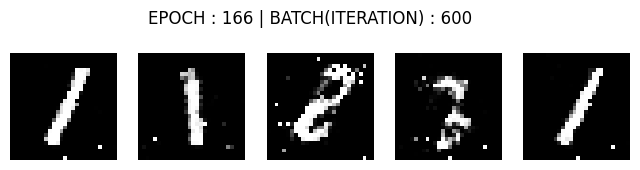

[Epoch: 166/200] [Batch: 657/657] [D loss: 0.059410] [G loss: 2.772503]


  0%|          | 0/657 [00:00<?, ?it/s]

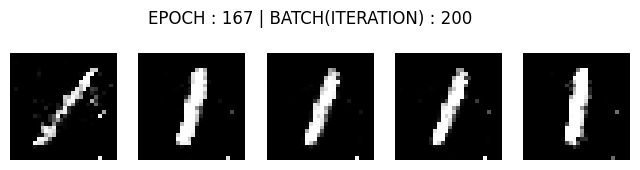

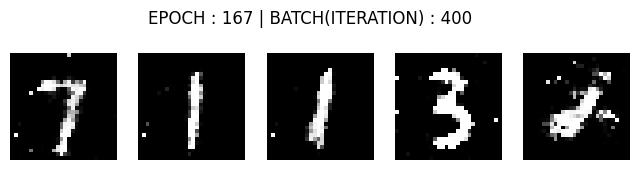

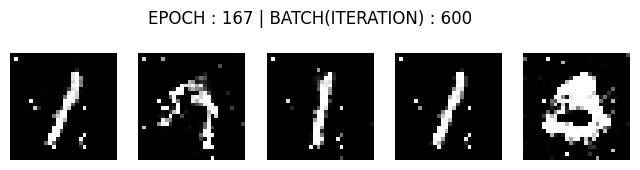

[Epoch: 167/200] [Batch: 657/657] [D loss: 0.164024] [G loss: 2.640415]


  0%|          | 0/657 [00:00<?, ?it/s]

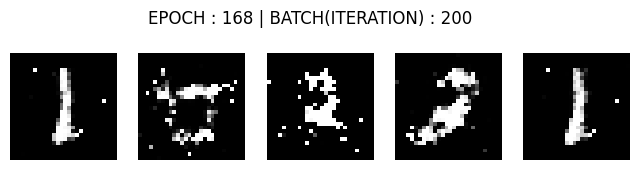

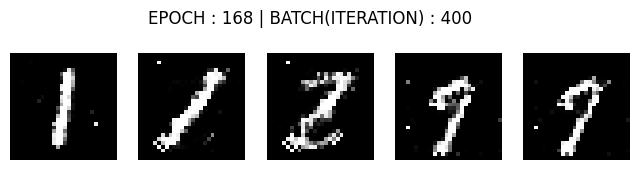

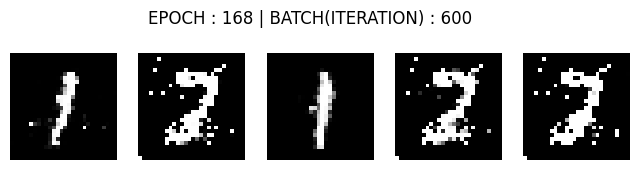

[Epoch: 168/200] [Batch: 657/657] [D loss: 0.099906] [G loss: 2.632854]


  0%|          | 0/657 [00:00<?, ?it/s]

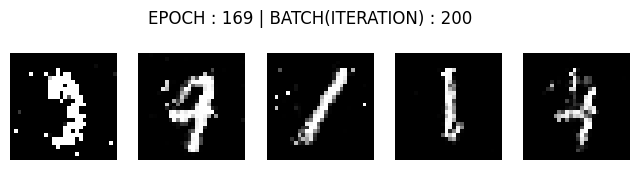

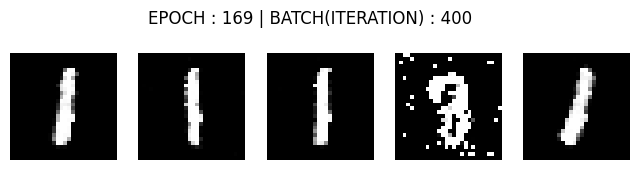

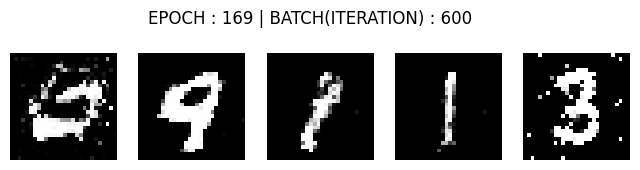

[Epoch: 169/200] [Batch: 657/657] [D loss: 0.106320] [G loss: 2.967469]


  0%|          | 0/657 [00:00<?, ?it/s]

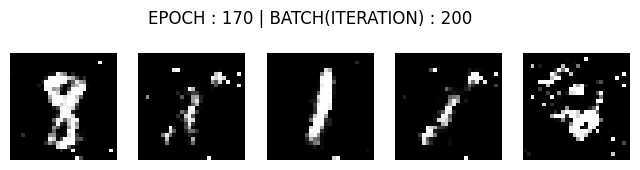

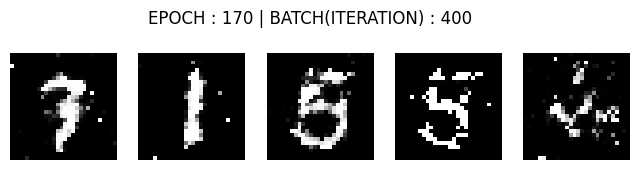

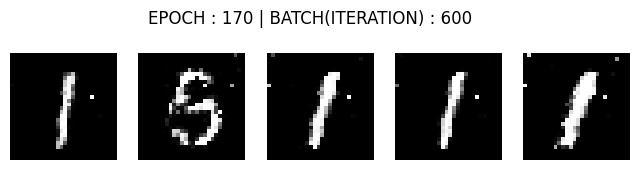

[Epoch: 170/200] [Batch: 657/657] [D loss: 0.025314] [G loss: 4.175128]


  0%|          | 0/657 [00:00<?, ?it/s]

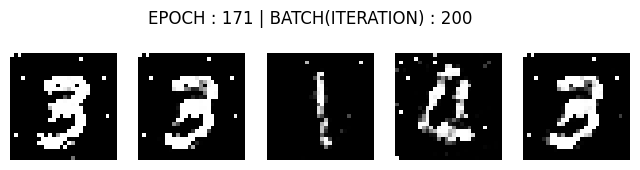

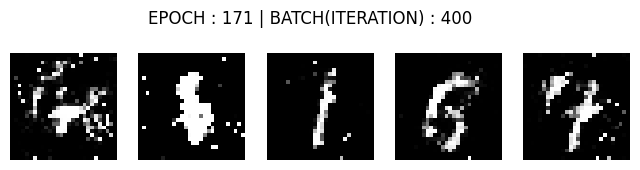

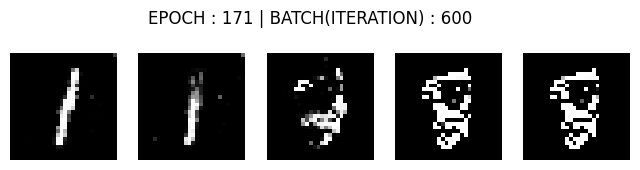

[Epoch: 171/200] [Batch: 657/657] [D loss: 0.182655] [G loss: 3.701216]


  0%|          | 0/657 [00:00<?, ?it/s]

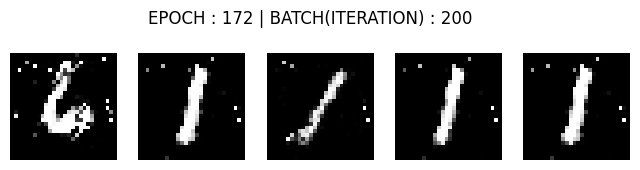

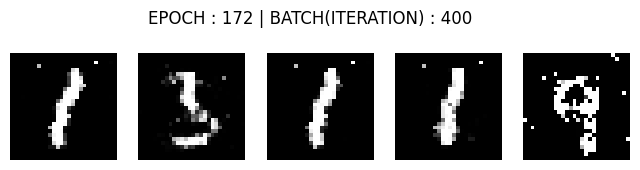

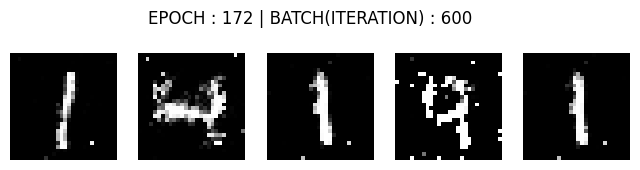

[Epoch: 172/200] [Batch: 657/657] [D loss: 0.137576] [G loss: 3.082911]


  0%|          | 0/657 [00:00<?, ?it/s]

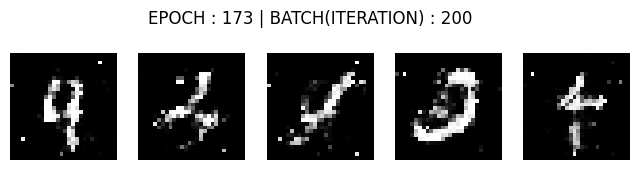

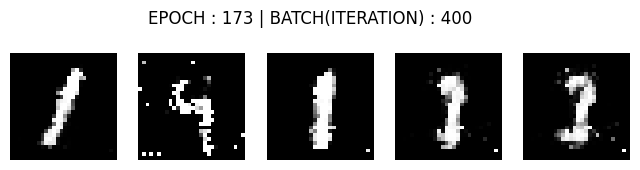

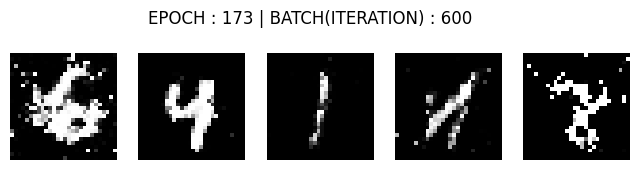

[Epoch: 173/200] [Batch: 657/657] [D loss: 0.286590] [G loss: 4.032964]


  0%|          | 0/657 [00:00<?, ?it/s]

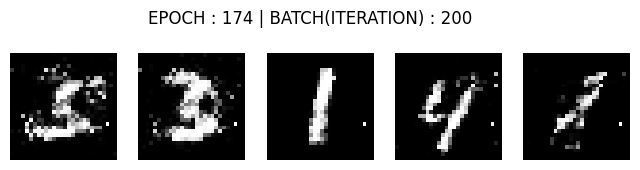

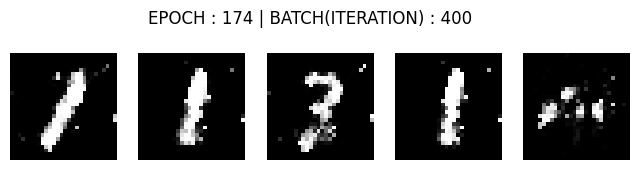

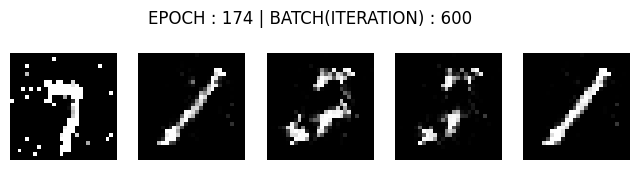

[Epoch: 174/200] [Batch: 657/657] [D loss: 0.153956] [G loss: 3.706875]


  0%|          | 0/657 [00:00<?, ?it/s]

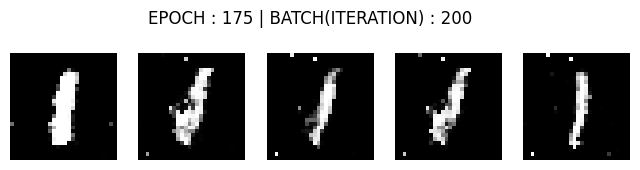

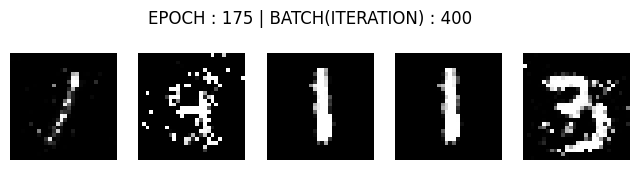

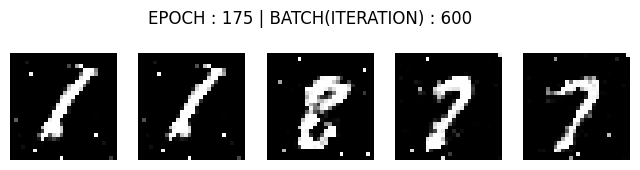

[Epoch: 175/200] [Batch: 657/657] [D loss: 0.177668] [G loss: 2.380947]


  0%|          | 0/657 [00:00<?, ?it/s]

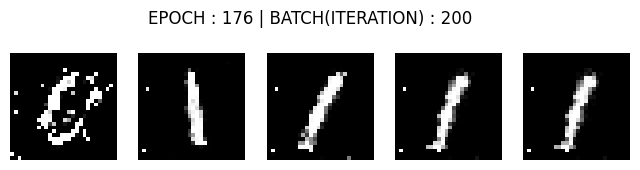

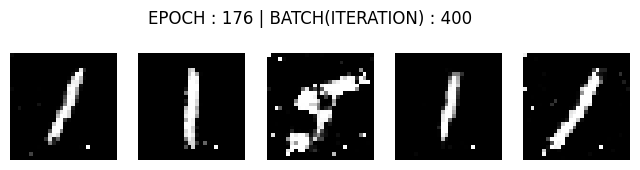

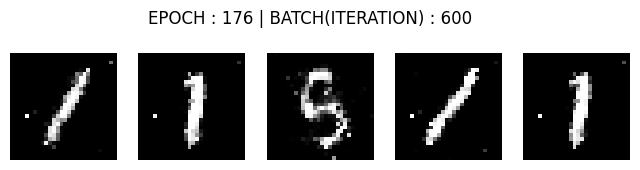

[Epoch: 176/200] [Batch: 657/657] [D loss: 0.266496] [G loss: 2.779166]


  0%|          | 0/657 [00:00<?, ?it/s]

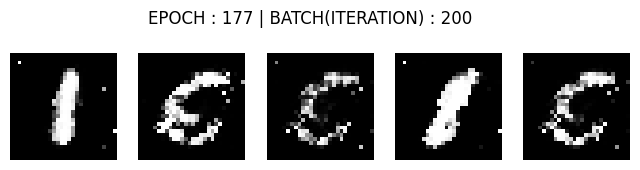

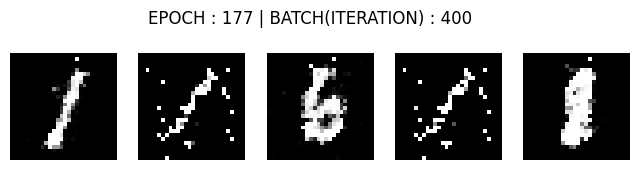

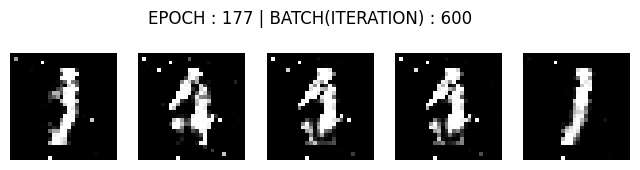

[Epoch: 177/200] [Batch: 657/657] [D loss: 0.225874] [G loss: 3.980602]


  0%|          | 0/657 [00:00<?, ?it/s]

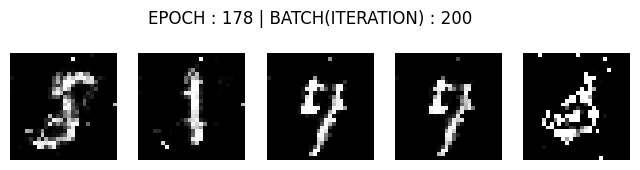

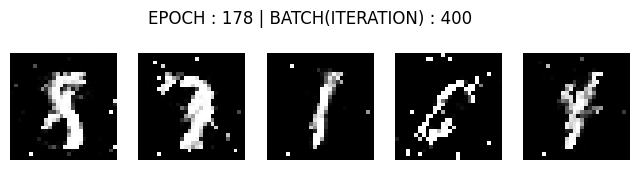

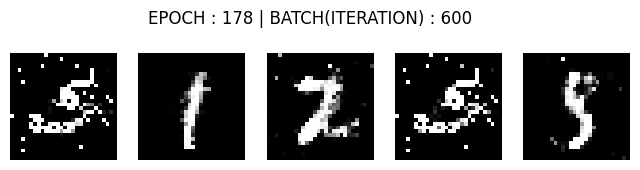

[Epoch: 178/200] [Batch: 657/657] [D loss: 0.509513] [G loss: 4.297812]


  0%|          | 0/657 [00:00<?, ?it/s]

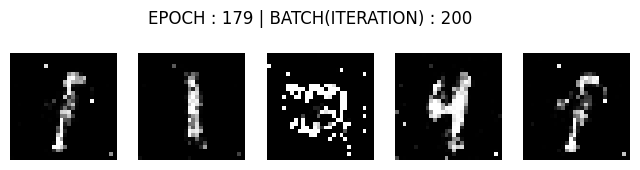

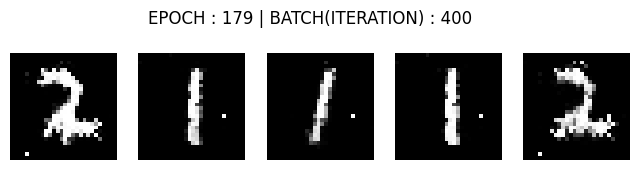

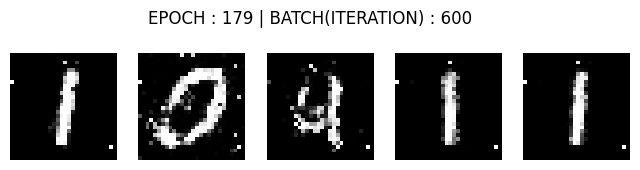

[Epoch: 179/200] [Batch: 657/657] [D loss: 0.199005] [G loss: 3.814954]


  0%|          | 0/657 [00:00<?, ?it/s]

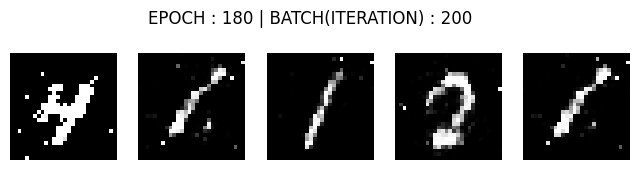

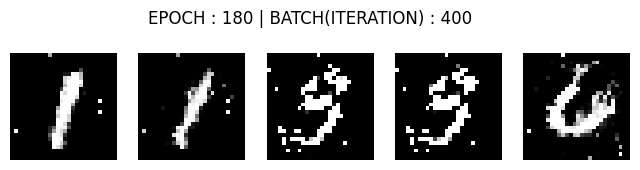

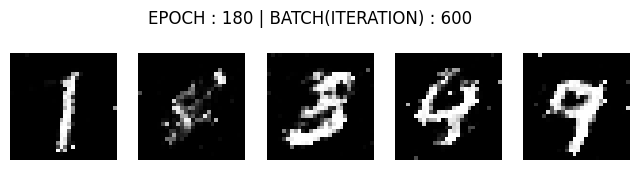

[Epoch: 180/200] [Batch: 657/657] [D loss: 0.194772] [G loss: 3.437689]


  0%|          | 0/657 [00:00<?, ?it/s]

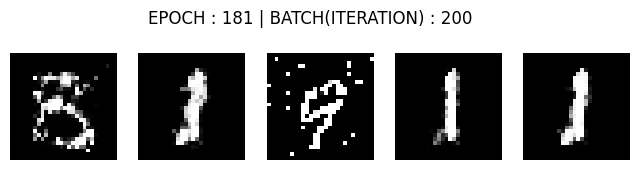

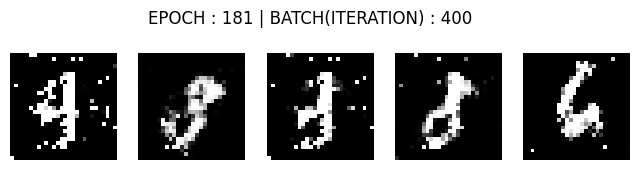

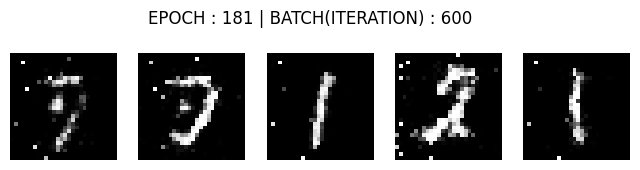

[Epoch: 181/200] [Batch: 657/657] [D loss: 0.073718] [G loss: 3.221828]


  0%|          | 0/657 [00:00<?, ?it/s]

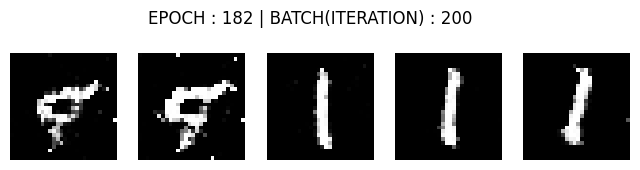

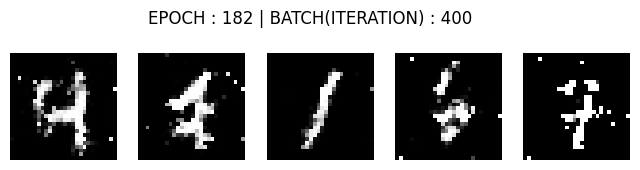

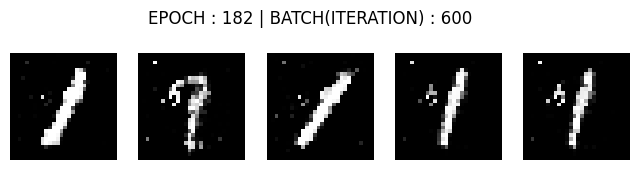

[Epoch: 182/200] [Batch: 657/657] [D loss: 0.378575] [G loss: 4.561500]


  0%|          | 0/657 [00:00<?, ?it/s]

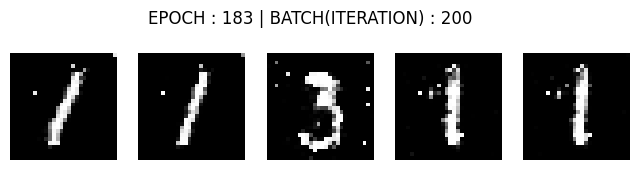

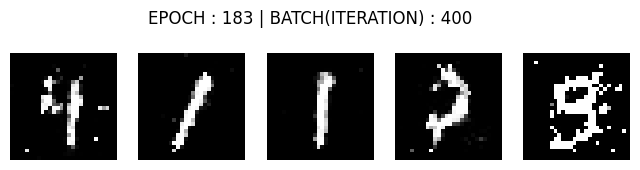

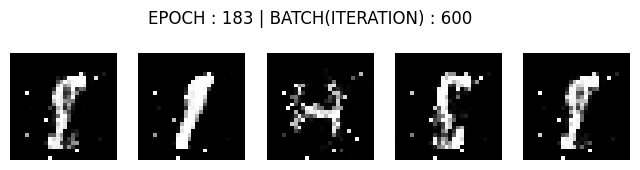

[Epoch: 183/200] [Batch: 657/657] [D loss: 0.293514] [G loss: 3.410736]


  0%|          | 0/657 [00:00<?, ?it/s]

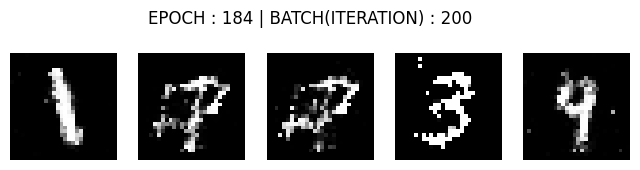

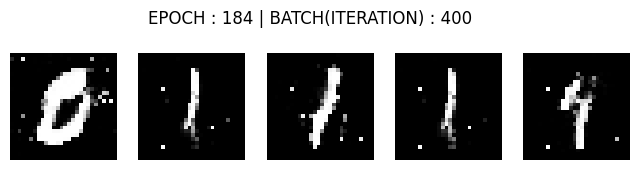

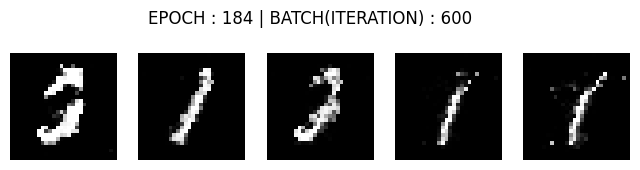

[Epoch: 184/200] [Batch: 657/657] [D loss: 0.281927] [G loss: 2.340662]


  0%|          | 0/657 [00:00<?, ?it/s]

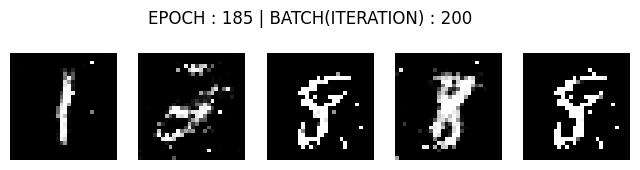

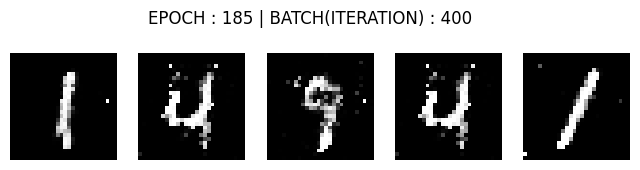

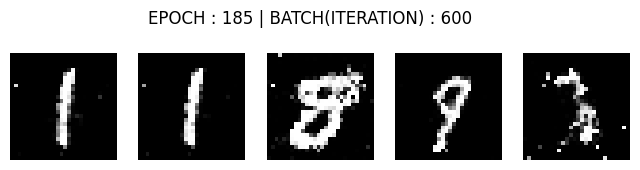

[Epoch: 185/200] [Batch: 657/657] [D loss: 0.188295] [G loss: 1.950167]


  0%|          | 0/657 [00:00<?, ?it/s]

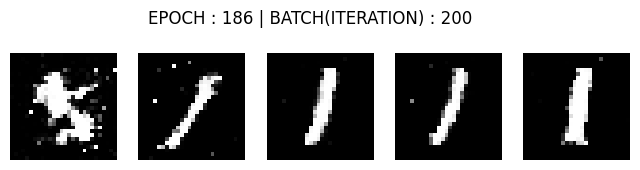

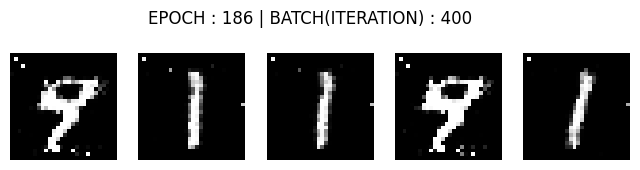

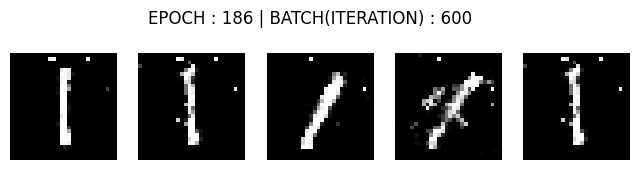

[Epoch: 186/200] [Batch: 657/657] [D loss: 0.372066] [G loss: 0.839367]


  0%|          | 0/657 [00:00<?, ?it/s]

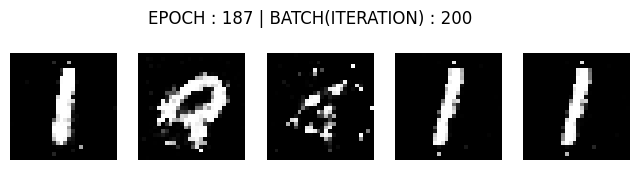

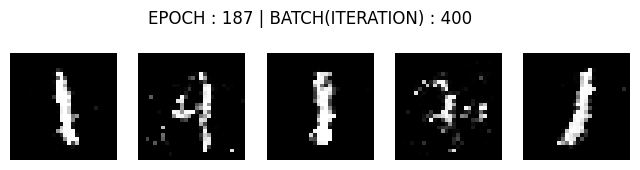

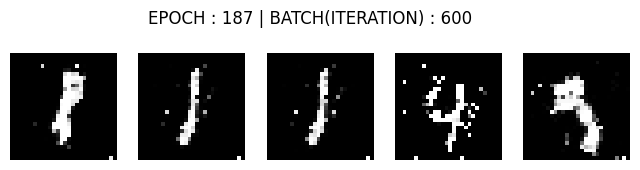

[Epoch: 187/200] [Batch: 657/657] [D loss: 0.121249] [G loss: 2.807044]


  0%|          | 0/657 [00:00<?, ?it/s]

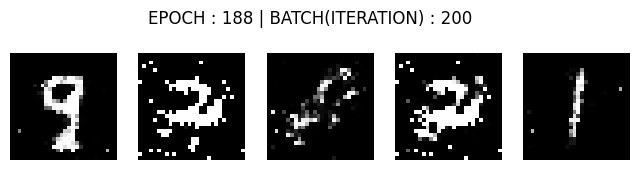

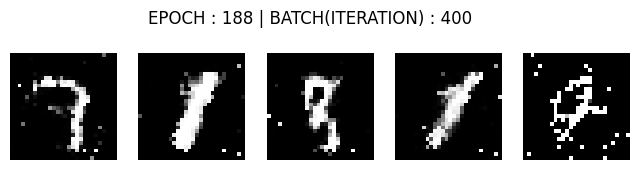

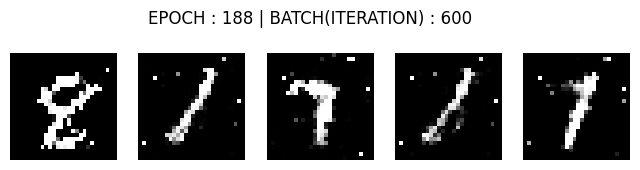

[Epoch: 188/200] [Batch: 657/657] [D loss: 0.334204] [G loss: 1.664809]


  0%|          | 0/657 [00:00<?, ?it/s]

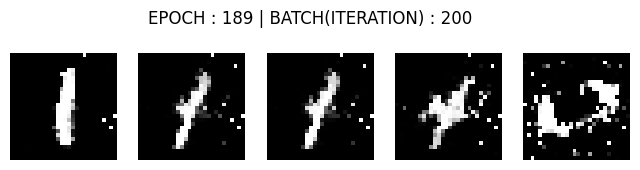

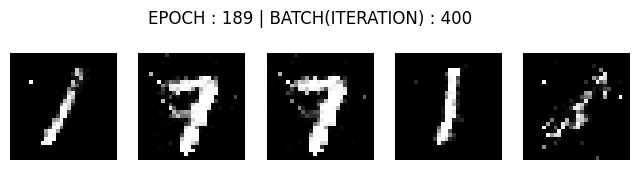

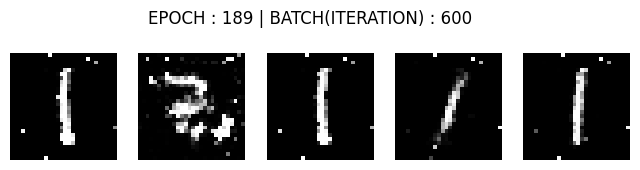

[Epoch: 189/200] [Batch: 657/657] [D loss: 0.219502] [G loss: 2.033169]


  0%|          | 0/657 [00:00<?, ?it/s]

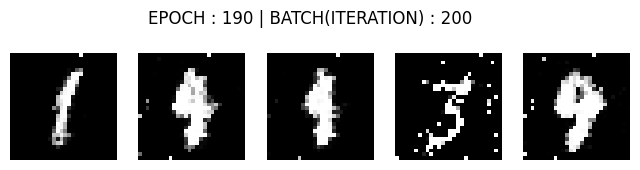

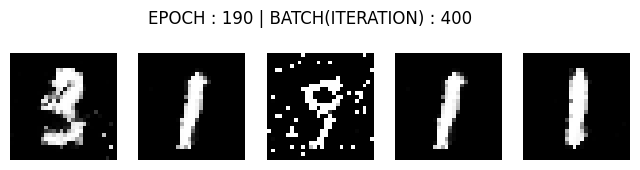

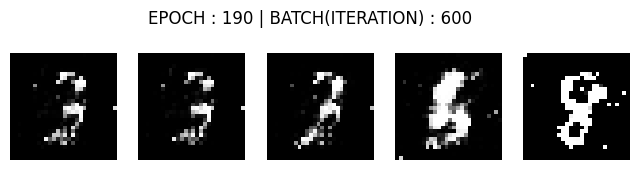

[Epoch: 190/200] [Batch: 657/657] [D loss: 0.325907] [G loss: 3.262935]


  0%|          | 0/657 [00:00<?, ?it/s]

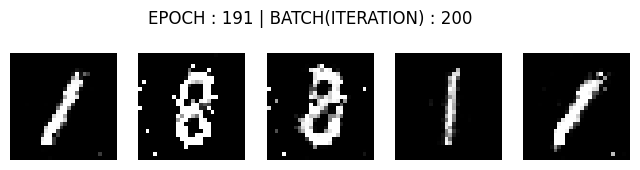

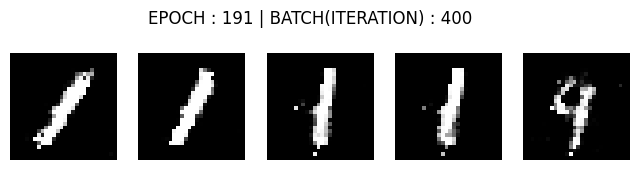

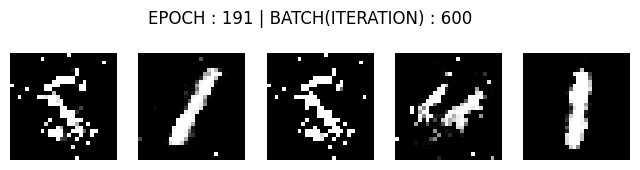

[Epoch: 191/200] [Batch: 657/657] [D loss: 0.043145] [G loss: 3.288349]


  0%|          | 0/657 [00:00<?, ?it/s]

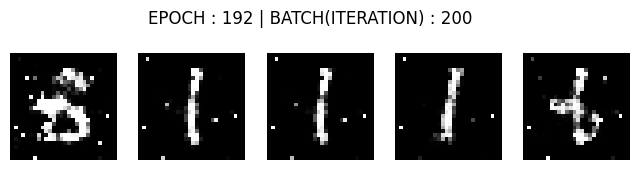

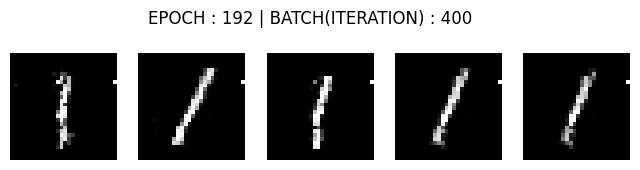

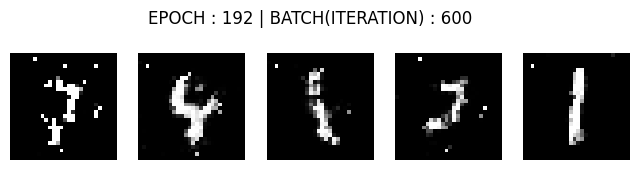

[Epoch: 192/200] [Batch: 657/657] [D loss: 0.080664] [G loss: 4.119458]


  0%|          | 0/657 [00:00<?, ?it/s]

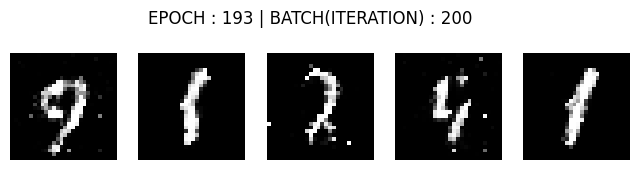

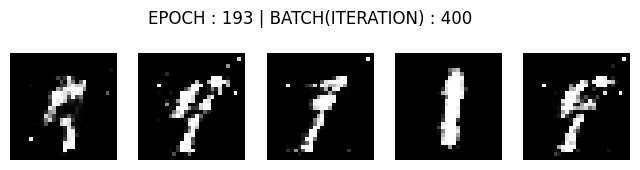

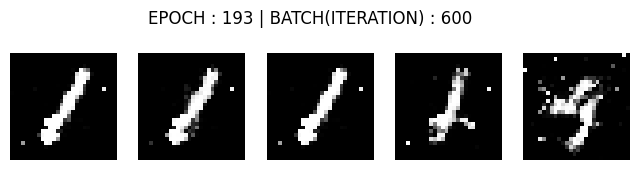

[Epoch: 193/200] [Batch: 657/657] [D loss: 0.121036] [G loss: 2.366828]


  0%|          | 0/657 [00:00<?, ?it/s]

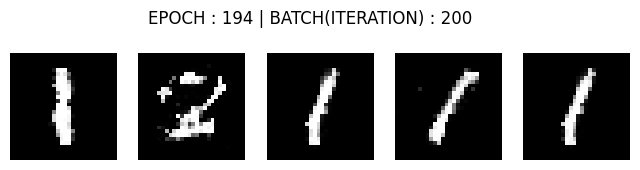

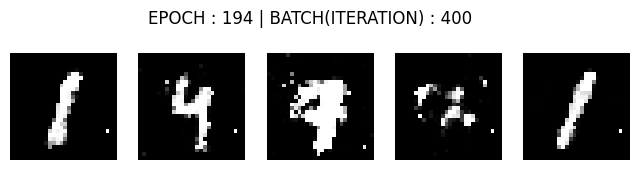

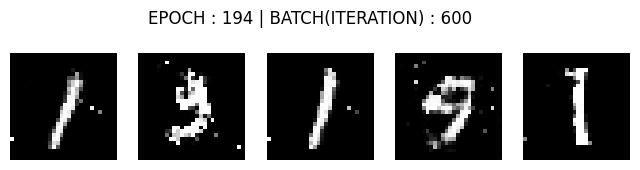

[Epoch: 194/200] [Batch: 657/657] [D loss: 0.346241] [G loss: 3.472709]


  0%|          | 0/657 [00:00<?, ?it/s]

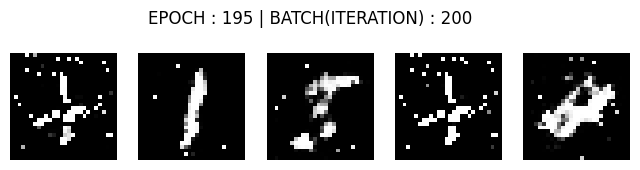

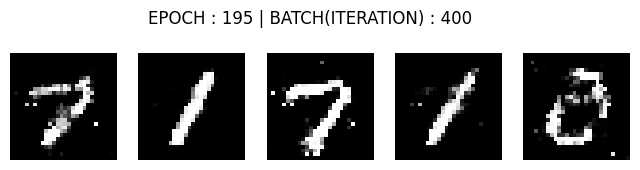

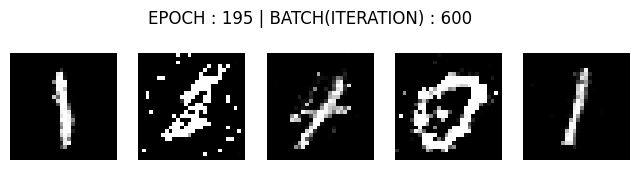

[Epoch: 195/200] [Batch: 657/657] [D loss: 0.308094] [G loss: 1.788693]


  0%|          | 0/657 [00:00<?, ?it/s]

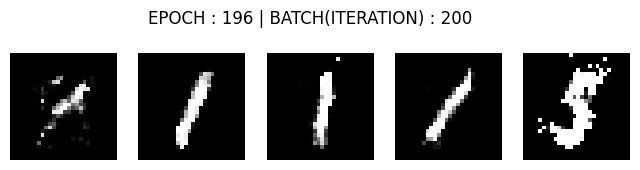

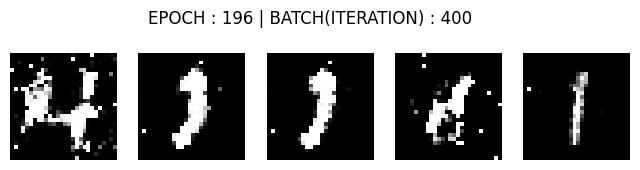

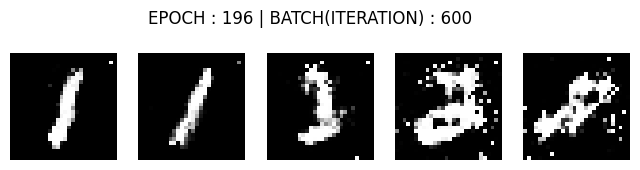

[Epoch: 196/200] [Batch: 657/657] [D loss: 0.301320] [G loss: 2.109860]


  0%|          | 0/657 [00:00<?, ?it/s]

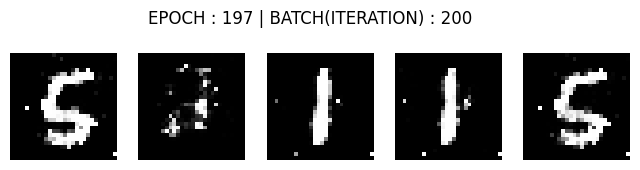

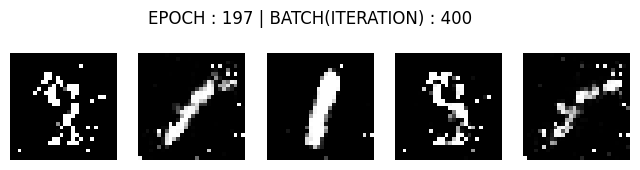

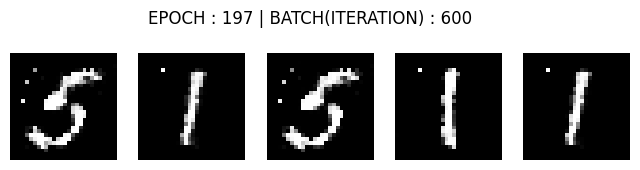

[Epoch: 197/200] [Batch: 657/657] [D loss: 0.245115] [G loss: 2.096794]


  0%|          | 0/657 [00:00<?, ?it/s]

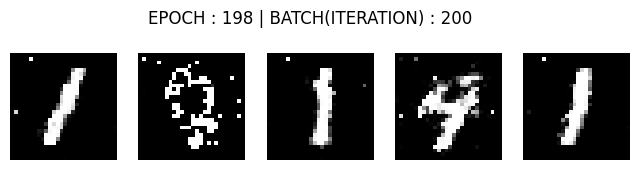

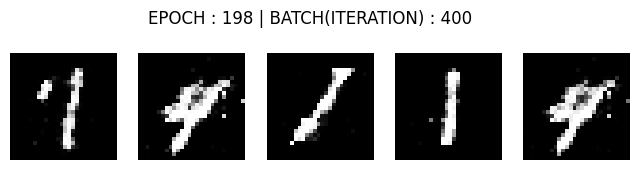

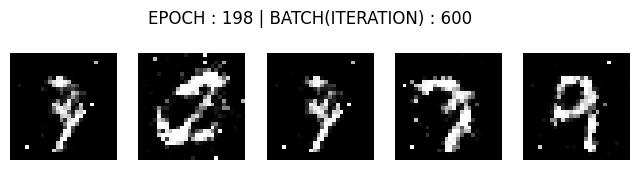

[Epoch: 198/200] [Batch: 657/657] [D loss: 0.052789] [G loss: 4.217933]


  0%|          | 0/657 [00:00<?, ?it/s]

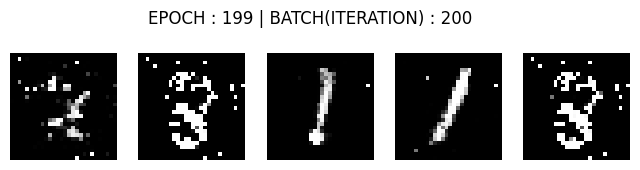

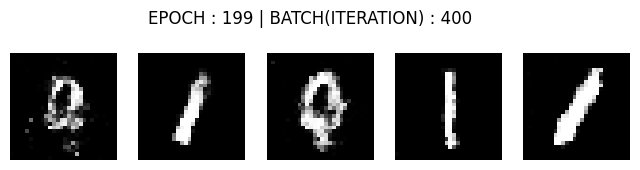

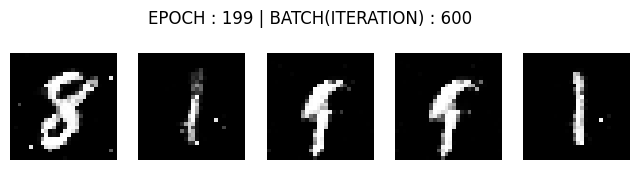

[Epoch: 199/200] [Batch: 657/657] [D loss: 0.198232] [G loss: 3.138356]


  0%|          | 0/657 [00:00<?, ?it/s]

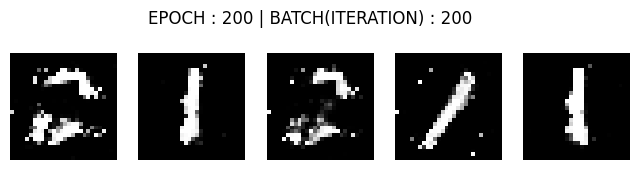

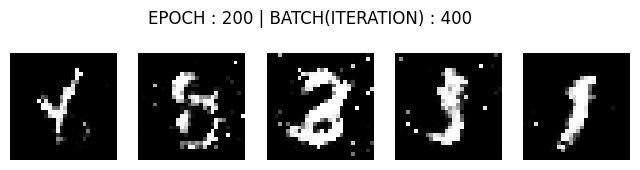

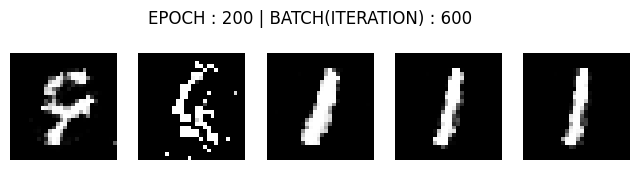

[Epoch: 200/200] [Batch: 657/657] [D loss: 0.290180] [G loss: 2.685457]


In [29]:
n_epochs = 200 # suggested default = 200
for epoch in range(n_epochs):
    for i, (imgs, _) in enumerate(tqdm(dataloader)): # This code(enumerate) is dealt with once more in the *TEST_CODE below.
                                                     # Used 'tqdm' for showing progress

        # Adversarial ground truths (For more detail, refer *Read_More below)
        valid = Variable(Tensor(imgs.size(0), 1).fill_(1.0), requires_grad=False) # imgs.size(0) == batch_size(1 batch) == 64, *TEST_CODE
        fake = Variable(Tensor(imgs.size(0), 1).fill_(0.0), requires_grad=False) # And Variable is for caclulate gradient. In fact, you can use it, but you don't have to.
                                                                                # requires_grad=False is default in tensor type. *Read_More

        # Configure input
        real_imgs = imgs.type(Tensor) # As mentioned, it is no longer necessary to wrap the tensor in a Variable.
      # real_imgs = Variable(imgs.type(Tensor)) # requires_grad=False, Default! It's same.

# ------------
# Train Generator
# ------------
        optimizer_G.zero_grad()

        # sample noise 'z' as generator input
        z = Tensor(np.random.normal(0, 1, (imgs.shape[0],latent_dim))) # Random sampling Tensor(batch_size, latent_dim) of Gaussian distribution
        # z.shape == torch.Size([64, 100])

        # Generate a batch of images
        gen_imgs = generator(z)
        # gen_imgs.shape == torch.Size([64, 1, 28, 28])

        # Loss measures generator's ability to fool the discriminator
        g_loss = adversarial_loss(discriminator(gen_imgs), valid) # torch.nn.BCELoss() compare result(64x1) and valid(64x1, filled with 1)

        g_loss.backward()
        optimizer_G.step()

# ------------
# Train Discriminator
# ------------
        optimizer_D.zero_grad()

        # Measure discriminator's ability to classify real from generated samples
        real_loss = adversarial_loss(discriminator(real_imgs), valid) # torch.nn.BCELoss() compare result(64x1) and valid(64x1, filled with 1)
        fake_loss = adversarial_loss(discriminator(gen_imgs.detach()), fake) # We are learning the discriminator now. So have to use detach()

        d_loss = (real_loss + fake_loss) / 2

        d_loss.backward()# If didn't use detach() for gen_imgs, all weights of the generator will be calculated with backward().
        optimizer_D.step()



# ------------
# Real Time Visualization (While Training)
# ------------

        sample_z_in_train = Tensor(np.random.normal(0, 1, (imgs.shape[0],latent_dim)))
        # z.shape == torch.Size([64, 100])
        sample_gen_imgs_in_train = generator(sample_z_in_train).detach().cpu()
        # gen_imgs.shape == torch.Size([64, 1, 28, 28])

        if ((i+1) % 200) == 0: # show while batch - 200/657, 400/657, 600/657
            nrow=1
            ncols=5
            fig, axes = plt.subplots(nrows=nrow,ncols=ncols, figsize=(8,2))
            plt.suptitle('EPOCH : {} | BATCH(ITERATION) : {}'.format(epoch+1, i+1))
            for ncol in range(ncols):
                axes[ncol].imshow(sample_gen_imgs_in_train.permute(0,2,3,1)[ncol], cmap='gray')
                axes[ncol].axis('off')
            plt.show()
    print(
        "[Epoch: %d/%d] [Batch: %d/%d] [D loss: %f] [G loss: %f]"
        % (epoch+1, n_epochs, i+1, len(dataloader), d_loss.item(), g_loss.item())
    )

> TEST CODE : enumerate >> [docs.python.org/enumerate](https://docs.python.org/3/library/functions.html#enumerate)

# Now to generate our own images. First we sample a random noise vector z that would be fed to the generator.

In [30]:
# latent vector
sample_z = Tensor(np.random.normal(0, 1, (64,100)))
sample_z.shape

torch.Size([64, 100])

# We provide the latent vectors (64 in this case) to the Generator

In [31]:
# generated images
sample_gen_imgs = generator(sample_z)
sample_gen_imgs.shape

torch.Size([64, 1, 28, 28])

# Question 6 How many images did the Generator produce?

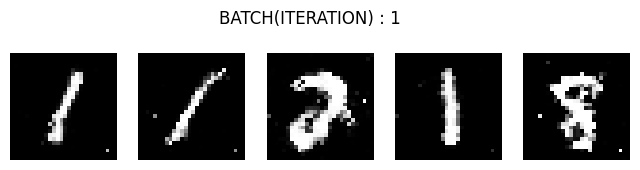

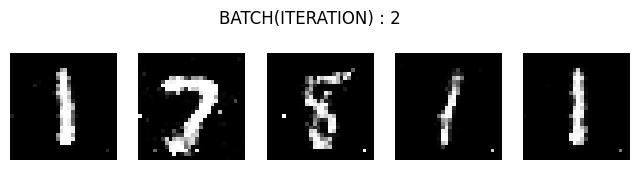

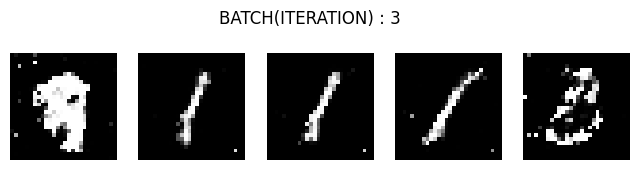

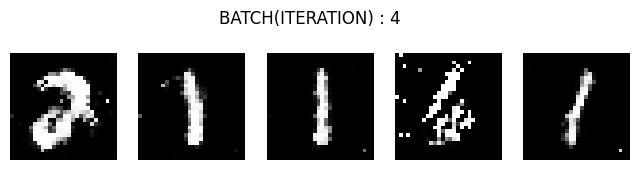

In [32]:
for i in range(4):
      nrow=1
      ncols=5
      fig, axes = plt.subplots(nrows=nrow,ncols=ncols, figsize=(8,2))
      plt.suptitle('BATCH(ITERATION) : {}'.format(i+1))
      for ncol in range(ncols):
          axes[ncol].imshow(sample_gen_imgs.detach().cpu().permute(0,2,3,1)[ncol+i*5], cmap='gray')
          axes[ncol].axis('off')
      plt.show()

> Read More
- [What is Ground Truth? - Definition from Techpedia](https://www.techopedia.com/definition/32514/ground-truth)
- [tqdm. A Fast, Extensible Progress Bar for Python and CLI](https://github.com/tqdm/tqdm)
- [Variables are no longer necessary to use autograd with tensors](https://pytorch.org/docs/stable/autograd.html#variable-deprecated)
- [np.random.normal(loc=0.0, scale=1.0, size=None)](https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html)



--------------

# You might be wondering how do we control the output of the Generator? Since we are using a vanilla GAN we don't have control over the generator outputs. However, we have other types of GANs like the Conditional GANs or CGANs for short that provide us control over the outputs of our generator. You can explore these types of GANs and train them on MNIST to generate digits of your choice.

### Notebook Credits:
This lab is based on the notebook provided by "sw-song" on Kaggle.

https://www.kaggle.com/code/songseungwon/pytorch-gan-basic-tutorial-for-beginner/notebook